<a href="https://colab.research.google.com/github/666888rwy-bit/phy77/blob/main/Main_code_without_animation_of_3D.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## 1D Time-Dependent Schrödinger Equation Simulation
## Split-Step Fourier Method (SSFM) Implementation

---

## 1. Mathematical Foundation

### Time-Dependent Schrödinger Equation
The core equation we are solving is:

$$
i\hbar \frac{\partial \psi}{\partial t} = \hat{H}\psi = \left[ -\frac{\hbar^2}{2m} \frac{\partial^2}{\partial x^2} + V(x) \right] \psi(x,t)
$$

### Split-Step Fourier Method
The SSFM approximates the time evolution operator by splitting it into kinetic and potential parts:

$$
\psi(x, t + \Delta t) \approx e^{-iV(x)\Delta t/2\hbar} \cdot \mathcal{F}^{-1}\left[ e^{-i\hbar k^2 \Delta t/2m} \cdot \mathcal{F}\left[ e^{-iV(x)\Delta t/2\hbar} \psi(x,t) \right] \right]
$$

Where:
- $\mathcal{F}$ and $\mathcal{F}^{-1}$ are Fourier and inverse Fourier transforms
- $k$ is the momentum space coordinate
- The method is second-order accurate in time due to symmetric splitting

In [ ]:
# Import all necessary libraries
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from scipy import fftpack
import warnings
warnings.filterwarnings('ignore') # Suppress warnings for cleaner output

# For displaying animations in the notebook
from IPython.display import HTML

## 2. Physical System Setup

### Infinite Square Well Potential
We model the potential as:

$$
V(x) =
\begin{cases}
0 & \text{for } |x| < L_{\text{well}}/2 \\
V_0 & \text{otherwise}
\end{cases}
$$

Where $V_0$ is a very large positive number to approximate infinite potential walls.

### Initial Wave Function: Gaussian Wave Packet
We use a modulated Gaussian wave packet:

$$
\psi(x,0) = \frac{1}{\sqrt{\sigma\sqrt{\pi}}} \exp\left(-\frac{(x-x_0)^2}{2\sigma^2}\right) \exp(ik_0x)
$$

- $x_0$: Initial center position
- $\sigma$: Width of the wave packet  
- $k_0$: Initial momentum ($p_0 = \hbar k_0$)

## 3. Numerical Implementation

### Discretization Parameters
- Spatial domain: $x \in [-L/2, L/2]$
- Number of grid points: $N_x = 512$ (power of 2 for FFT efficiency)
- Spatial step: $\Delta x = L/N_x$
- Time step: $\Delta t = 0.001$ (must satisfy stability condition)

### Momentum Space Grid
The momentum grid is determined by the FFT frequencies:

$$
k = 2\pi \cdot \text{fftfreq}(N_x, \Delta x)
$$

### Pre-computed Evolution Operators
For computational efficiency, we pre-calculate:

**Kinetic evolution operator:**
$$T_{\text{exp}} = \exp\left(-i\frac{\hbar k^2}{2m}\Delta t\right)$$

**Potential evolution operator:**
$$V_{\text{exp}} = \exp\left(-i\frac{V(x)}{\hbar}\Delta t\right)$$

---

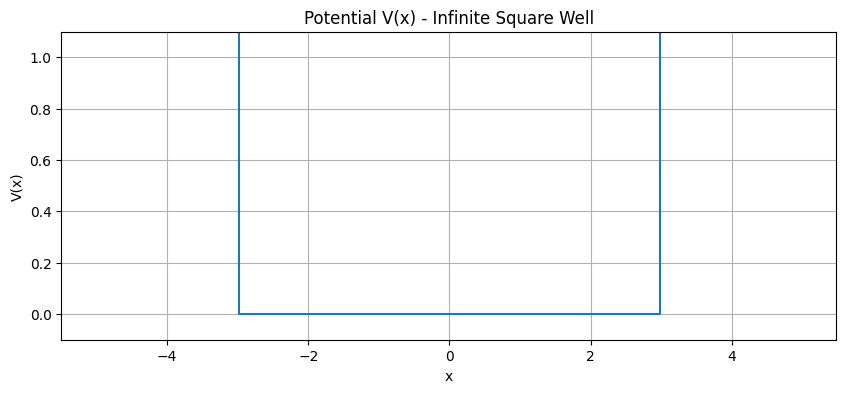

In [ ]:
def infinite_potential():
    hbar = 1.0
    m = 1.0
    Nx = 512  # Number of grid points. Powers of 2 are efficient for FFT.
    L = 10.0  # Size of the spatial domain [-L/2, L/2]
    x = np.linspace(-L/2, L/2, Nx, endpoint=False)  # Spatial grid
    dx = x[1] - x[0]  # Spatial step

    # Momentum grid (provided by FFT)
    k = 2 * np.pi * fftpack.fftfreq(Nx, d=dx)

    # Time step
    dt = 0.001  # Time step. Must be small enough for stability.
    num_steps = 500  # Total number of time steps to simulate
    V = np.zeros_like(x)
    # Define the well width
    well_width = L * 0.6  # The well occupies 60% of the total domain
    well_mask = np.abs(x) < well_width / 2  # Boolean mask for inside the well
    V[~well_mask] = 1e10  # Set a very high potential outside the well
    return V
    # Plot the potential
V1=infinite_potential()
L = 10.0
Nx = 512
x = np.linspace(-L/2, L/2, Nx, endpoint=False)
plt.figure(figsize=(10, 4))
plt.plot(x, V1)
plt.title("Potential V(x) - Infinite Square Well")
plt.xlabel("x")
plt.ylabel("V(x)")
plt.ylim(-0.1, 1.1)
plt.grid(True)
plt.show()

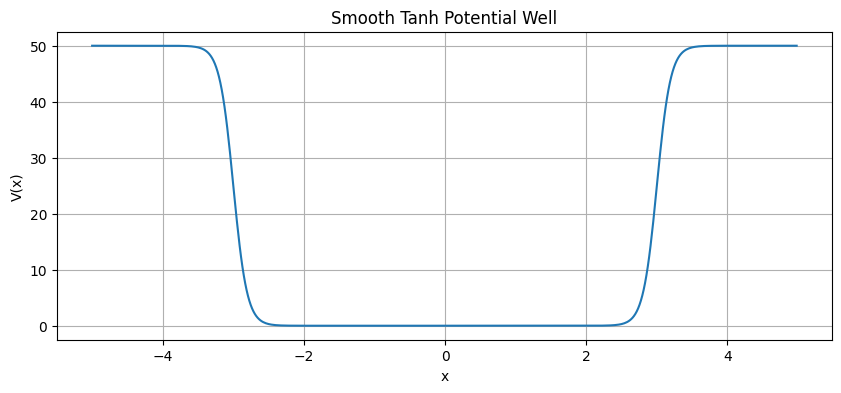

In [ ]:


def smooth_tanh_potential():
    hbar = 1.0
    m = 1.0
    Nx = 512  # Number of grid points
    L = 10.0  # Domain size [-L/2, L/2]
    x = np.linspace(-L/2, L/2, Nx, endpoint=False)
    dx = x[1] - x[0]

    # Momentum grid for FFT
    k = 2 * np.pi * fftpack.fftfreq(Nx, d=dx)

    # Time parameters
    dt = 0.001
    num_steps = 500

    # ----- Smooth tanh-wall potential -----
    well_width = L * 0.6         # well occupies 60% of domain
    V0 = 50.0                    # finite height (much better than 1e10)
    a = dx * 10                  # smoothing length (try dx*5 - dx*20)

    # distance from the well boundary
    d = np.abs(x) - well_width/2

    # smooth soft-wall:
    # V = V0 outside, gradually rising with tanh smoothing
    V = 0.5 * V0 * (np.tanh(d / a) + 1.0)
    return V
V2= smooth_tanh_potential()
Nx = 512  # Number of grid points
L = 10.0  # Domain size [-L/2, L/2]
x = np.linspace(-L/2, L/2, Nx, endpoint=False)
dx = x[1] - x[0]
# plot the potential
plt.figure(figsize=(10,4))
plt.plot(x, V2)
plt.title("Smooth Tanh Potential Well")
plt.xlabel("x")
plt.ylabel("V(x)")
plt.grid(True)
plt.show()

Initial normalization check: ∫|ψ|² dx = 1.0000000000


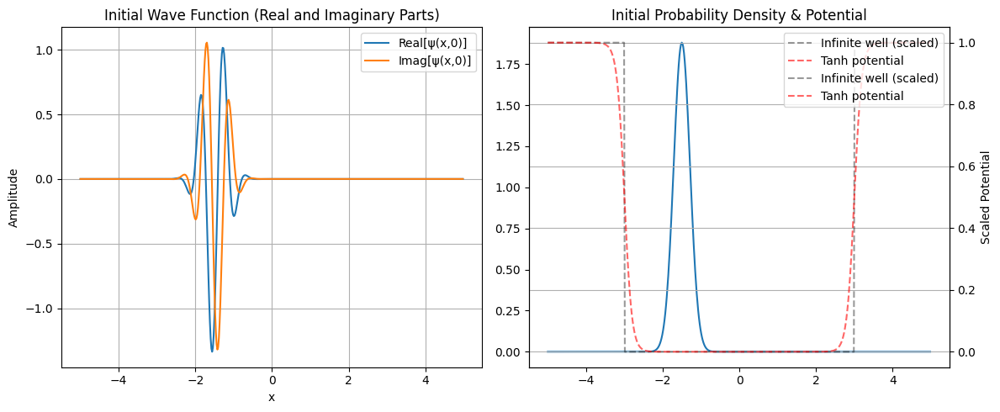

In [ ]:

x0 = -1.5  # Initial center of the wave packet (inside the left part of the well)
sigma = 0.3  # Width of the wave packet
k0 = 10.0  # Initial momentum (wave number)

# Create the Gaussian wave packet
psi_x = np.exp(-(x - x0)**2 / (2 * sigma**2)) * np.exp(1j * k0 * x)

# Normalize the wave function
probability_density = np.abs(psi_x)**2
norm = np.sqrt(np.sum(probability_density) * dx)  # Calculate the norm
psi_x = psi_x / norm  # Normalize

print(f"Initial normalization check: ∫|ψ|² dx = {np.sum(np.abs(psi_x)**2) * dx:.10f}")

# Plot the initial wave function and potential
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(x, np.real(psi_x), label="Real[ψ(x,0)]")
plt.plot(x, np.imag(psi_x), label="Imag[ψ(x,0)]")
plt.title("Initial Wave Function (Real and Imaginary Parts)")
plt.xlabel("x")
plt.ylabel("Amplitude")
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(x, np.abs(psi_x)**2, label="|ψ(x,0)|²")

'''plt.plot(x, V1 / np.max(V) * np.max(np.abs(psi_x)**2), 'k--', alpha=0.7, label="V(x) (scaled)")
plt.plot(x, V2 / np.max(V) * np.max(np.abs(psi_x)**2), 'k--', alpha=0.7, label="V(x) (scaled)")'''
ax2 = plt.twinx()
ax2.plot(x, V1/np.max(V1), "k--", alpha=0.4, label="Infinite well (scaled)")
ax2.plot(x, V2/np.max(V2), "r--", alpha=0.6, label="Tanh potential")
ax2.set_ylabel("Scaled Potential")

# Combine legends from both axes
lines, labels = plt.gca().get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
plt.legend(lines+lines2,labels+labels2,loc="upper right")

plt.title("Initial Probability Density & Potential")
plt.grid(True)

plt.tight_layout()
plt.show()

## 4. Algorithm Core: SSFM Loop

For each time step $t \rightarrow t + \Delta t$:

1. **Half potential step:**
   $\psi \leftarrow \psi \cdot V_{\text{exp}}$

2. **Full kinetic step:**
   - Transform to momentum space: $\tilde{\psi} = \mathcal{F}[\psi]$
   - Apply kinetic evolution: $\tilde{\psi} \leftarrow \tilde{\psi} \cdot T_{\text{exp}}$
   - Transform back: $\psi \leftarrow \mathcal{F}^{-1}[\tilde{\psi}]$

3. **Half potential step:**
   $\psi \leftarrow \psi \cdot V_{\text{exp}}$


In [ ]:
def SSFM_loop(V,hbar = 1.0,m=1.0,L = 10.0):
    Nx=512
    x = np.linspace(-L/2, L/2, Nx, endpoint=False)
    dx = x[1] - x[0]
    k = 2 * np.pi * fftpack.fftfreq(Nx, d=dx)
    dt = 0.001
    num_steps = 500
    T_exp = np.exp(-1j * (hbar * k**2 / (2 * m)) * dt / hbar)
    V_exp = np.exp(-1j * V * (dt/2)/ hbar)
    x0 = -1.5  # Initial center of the wave packet (inside the left part of the well)
    sigma = 0.3  # Width of the wave packet
    k0 = 10.0  # Initial momentum (wave number)

    # Create the Gaussian wave packet
    psi_x = np.exp(-(x - x0)**2 / (2 * sigma**2)) * np.exp(1j * k0 * x)

    # Normalize the wave function
    probability_density = np.abs(psi_x)**2
    norm = np.sqrt(np.sum(probability_density) * dx)  # Calculate the norm
    psi_x = psi_x / norm  # Normalize
    # Initialize arrays to store time evolution data for plotting
    time_evolution = np.zeros((num_steps, Nx), dtype=np.complex128)
    time_evolution[0] = psi_x  # Store initial state

    # Initialize the current wave function
    psi_current = psi_x.copy()

    # Lists to monitor conservation laws
    time_points = [0]
    norm_history = [np.sum(np.abs(psi_current)**2) * dx]
    energy_history = []

    print("Starting SSFM simulation...")
    for step in range(1, num_steps):
        # --- ONE FULL TIME STEP: Symmetric Split-Step ---
        # 1. Half-step in potential space
        psi_current = psi_current * V_exp

        # 2. Full step in kinetic space (momentum space)
        psi_k = fftpack.fft(psi_current)  # FFT to momentum space
        psi_k = psi_k * T_exp  # Apply kinetic evolution
        psi_current = fftpack.ifft(psi_k)  # IFFT back to position space

        # 3. Another half-step in potential space
        psi_current = psi_current * V_exp

        # Store the current state
        time_evolution[step] = psi_current

        # Monitor conservation laws
        time_points.append(step * dt)
        current_norm = np.sum(np.abs(psi_current)**2) * dx
        norm_history.append(current_norm)

        # Calculate energy <ψ|H|ψ> (can be computationally expensive, so we do it periodically)
        if step % 50 == 0:
            # Kinetic energy: <ψ|T|ψ> = ∫ ψ* (-ħ²/2m) d²ψ/dx² dx
            d2psi_dx2 = np.gradient(np.gradient(psi_current, dx), dx)
            kinetic_energy = -0.5 * hbar**2 / m * np.real(np.sum(np.conj(psi_current) * d2psi_dx2) * dx)
            # Potential energy: <ψ|V|ψ> = ∫ ψ* V ψ dx
            potential_energy = np.real(np.sum(np.conj(psi_current) * V * psi_current) * dx)
            total_energy = kinetic_energy + potential_energy
            energy_history.append(total_energy)
            print(f"Step {step:4d}/{num_steps}, Time = {step*dt:.3f}, Norm = {current_norm:.8f}, Energy = {total_energy:.6f}")

    print("Simulation completed!")

    # Convert lists to numpy arrays for plotting
    time_points = np.array(time_points)
    norm_history = np.array(norm_history)
    return (energy_history,time_evolution,norm_history,time_points)
dt=0.001
ans1=SSFM_loop(infinite_potential())
time_evolution1=ans1[1]
energy_history1=ans1[0]

ans2=SSFM_loop(smooth_tanh_potential())
time_evolution2=ans2[1]
energy_history2=ans2[0]
norm_history2=ans2[2]
time_points=ans2[3]

Starting SSFM simulation...
Step   50/500, Time = 0.050, Norm = 1.00000000, Energy = 51.941815
Step  100/500, Time = 0.100, Norm = 1.00000000, Energy = 51.941658
Step  150/500, Time = 0.150, Norm = 1.00000000, Energy = 51.943241
Step  200/500, Time = 0.200, Norm = 1.00000000, Energy = 2237.939303
Step  250/500, Time = 0.250, Norm = 1.00000000, Energy = 1998552.368543
Step  300/500, Time = 0.300, Norm = 1.00000000, Energy = 49162066.147646
Step  350/500, Time = 0.350, Norm = 1.00000000, Energy = 232077039.051298
Step  400/500, Time = 0.400, Norm = 1.00000000, Energy = 516330552.357668
Step  450/500, Time = 0.450, Norm = 1.00000000, Energy = 837898333.356790
Simulation completed!
Starting SSFM simulation...
Step   50/500, Time = 0.050, Norm = 1.00000000, Energy = 51.930648
Step  100/500, Time = 0.100, Norm = 1.00000000, Energy = 51.930648
Step  150/500, Time = 0.150, Norm = 1.00000000, Energy = 51.930648
Step  200/500, Time = 0.200, Norm = 1.00000000, Energy = 51.930661
Step  250/500, Ti

## 5. Conservation Laws & Validation

### Probability Conservation
The total probability should remain constant:

$$
P(t) = \int |\psi(x,t)|^2 dx = 1 \quad \forall t
$$

We monitor the deviation: $\Delta P = |P(t) - 1|$

### Energy Calculation
The expectation value of energy:

$$
\langle E \rangle = \langle \psi | \hat{H} | \psi \rangle = \langle T \rangle + \langle V \rangle
$$

Where:
- Kinetic energy: $\langle T \rangle = -\frac{\hbar^2}{2m} \int \psi^* \frac{\partial^2 \psi}{\partial x^2} dx$
- Potential energy: $\langle V \rangle = \int \psi^* V(x) \psi dx$

---


## 6. Expected Physical Behavior

### Wave Packet Dynamics
- **Free expansion:** Wave packet spreads due to dispersion
- **Boundary reflection:** Perfect reflection at infinite walls
- **Interference:** Constructive and destructive interference patterns
- **Revival:** Quantum revival phenomena at specific times

### Key Observables
1. Probability density evolution: $|\psi(x,t)|^2$
2. Momentum distribution: $|\tilde{\psi}(k,t)|^2$
3. Expectation values: $\langle x \rangle$, $\langle p \rangle$, $\langle E \rangle$

---


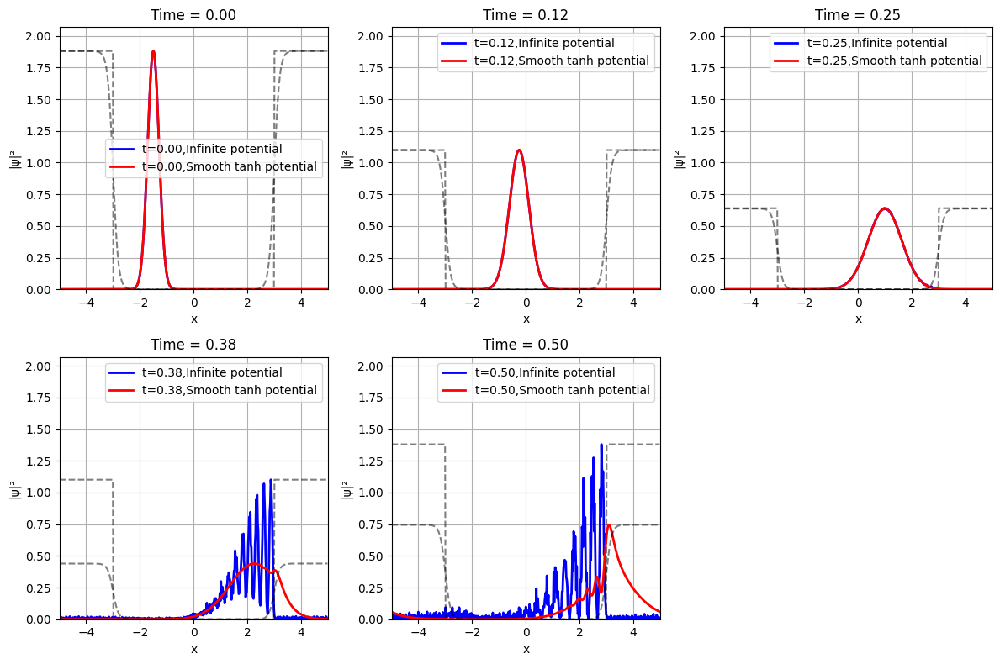

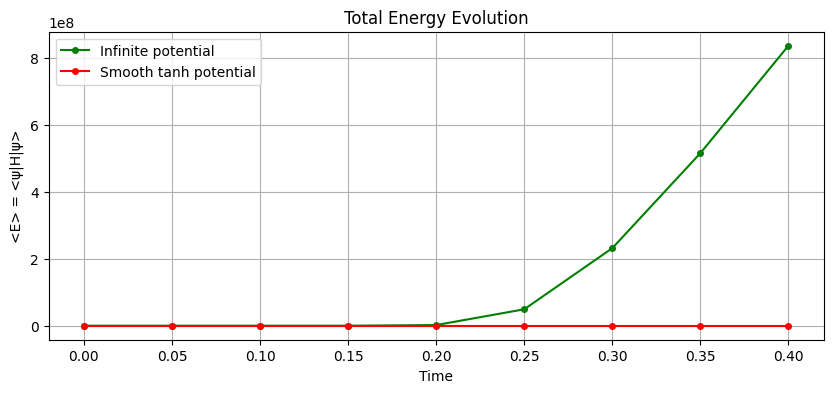

In [ ]:
# ============================================================================
# Static Plots at Key Time Steps
# ============================================================================

V1=infinite_potential()
V2=smooth_tanh_potential()
num_steps = 500
key_frames = [0, num_steps//4, num_steps//2, 3*num_steps//4, num_steps-1]
frame_times = [f * dt for f in key_frames]
plt.figure(figsize=(12, 8))
for i, frame in enumerate(key_frames):
    plt.subplot(2, 3, i+1)
    plt.plot(x, np.abs(time_evolution1[frame])**2, 'b-', linewidth=2, label=f't={frame_times[i]:.2f},Infinite potential')
    plt.plot(x, V1 / np.max(V1) * np.max(np.abs(time_evolution1[frame])**2), 'k--', alpha=0.5)
    plt.plot(x, np.abs(time_evolution2[frame])**2, 'r-', linewidth=2, label=f't={frame_times[i]:.2f},Smooth tanh potential')
    plt.plot(x, V2 / np.max(V2) * np.max(np.abs(time_evolution2[frame])**2), 'k--', alpha=0.5)
    plt.xlim(-L/2, L/2)
    plt.ylim(0, np.max(np.abs(time_evolution1)**2) * 1.1)
    plt.xlabel('x')
    plt.ylabel('|ψ|²')
    plt.title(f'Time = {frame_times[i]:.2f}')
    plt.grid(True)
    plt.legend()

plt.tight_layout()
plt.show()

    # 4. Plot energy history if we calculated it

energy_times = [i * 50 * dt for i in range(len(energy_history1))]
plt.figure(figsize=(10, 4))
plt.plot(energy_times, energy_history1, 'g-o',label='Infinite potential', markersize=4)
plt.plot(energy_times, energy_history2, 'r-o',label='Smooth tanh potential', markersize=4)
plt.title("Total Energy Evolution")
plt.xlabel("Time")
plt.ylabel("<E> = <ψ|H|ψ>")
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# ============================================================================
# Finite-Difference Time-Domain (FDTD) - Crank-Nicolson Method
# ============================================================================

def calculate_observables(psi, x, dx, V, hbar=1.0, m=1.0):
    """Calculates various observables for a given wavefunction.

    Args:
        psi (np.ndarray): The complex wavefunction array.
        x (np.ndarray): The spatial grid array.
        dx (float): The spatial step size.
        V (np.ndarray): The potential energy array.
        hbar (float, optional): Reduced Planck's constant. Defaults to 1.0.
        m (float, optional): Mass of the particle. Defaults to 1.0.

    Returns:
        tuple: (x_exp, p_exp, E_exp, dx_squared_exp, dp_squared_exp) representing
               expectation values of position, momentum, energy, and their variances.
    """
    # Probability density
    prob_density = np.abs(psi)**2

    # Expectation value of position <x>
    x_exp = np.sum(x * prob_density) * dx

    # Expectation value of momentum <p>
    # Using central difference for derivative
    p_exp = np.real(np.sum(np.conj(psi) * (-1j * hbar * np.gradient(psi, dx))) * dx)

    # Expectation value of energy <E>
    # Kinetic energy part: <T> = -hbar^2 / (2m) * integral(psi* * d^2psi/dx^2 dx)
    d2psi_dx2 = np.gradient(np.gradient(psi, dx), dx)
    kinetic_energy = -0.5 * hbar**2 / m * np.real(np.sum(np.conj(psi) * d2psi_dx2) * dx)

    # Potential energy part: <V> = integral(psi* * V * psi dx)
    potential_energy = np.real(np.sum(np.conj(psi) * V * psi) * dx)

    E_exp = kinetic_energy + potential_energy

    # Variance of position (delta x)^2
    x_squared_exp = np.sum(x**2 * prob_density) * dx
    dx_squared_exp = x_squared_exp - x_exp**2

    # Variance of momentum (delta p)^2
    # From <p^2> = 2m<T>
    p_squared_exp = 2 * m * kinetic_energy # This is the expectation value of p^2
    dp_squared_exp = p_squared_exp - p_exp**2

    return x_exp, p_exp, E_exp, dx_squared_exp, dp_squared_exp

def setup_fdtd_matrix(x, dx, dt, V, hbar=1.0, m=1.0):
    """Set up the matrices for the Crank-Nicolson method"""
    N = len(x)
    A = np.zeros((N, N), dtype=np.complex128)
    B = np.zeros((N, N), dtype=np.complex128)

    # Coefficient for the finite difference
    alpha = 1j * hbar * dt / (4 * m * dx**2)
    beta = 1j * dt / (2 * hbar)

    # Build tridiagonal matrices
    for i in range(1, N-1):
        # A matrix (for ψ_{n+1})
        A[i, i-1] = -alpha
        A[i, i]   = 1 + 2*alpha + beta * V[i]
        A[i, i+1] = -alpha

        # B matrix (for ψ_n)
        B[i, i-1] = alpha
        B[i, i]   = 1 - 2*alpha - beta * V[i]
        B[i, i+1] = alpha

    # Boundary conditions (Dirichlet - wavefunction = 0 at boundaries)
    A[0, 0] = 1.0
    A[-1, -1] = 1.0
    B[0, 0] = 1.0
    B[-1, -1] = 1.0

    return A, B

def fdtd_crank_nicolson(psi_initial, A, B, num_steps):
    """Solve time-dependent Schrödinger equation using Crank-Nicolson method"""
    N = len(psi_initial)
    psi_evolution = np.zeros((num_steps, N), dtype=np.complex128)
    psi_current = psi_initial.copy()
    psi_evolution[0] = psi_current

    print("Starting FDTD (Crank-Nicolson) simulation...")
    for step in range(1, num_steps):
        # Right-hand side vector
        b = B @ psi_current

        # Solve A * psi_next = b
        psi_next = np.linalg.solve(A, b)

        psi_evolution[step] = psi_next
        psi_current = psi_next

        if step % 100 == 0:
            current_norm = np.sum(np.abs(psi_current)**2) * dx
            print(f"FDTD Step {step:4d}/{num_steps}, Norm = {current_norm:.8f}")

    print("FDTD simulation completed!")
    return psi_evolution

# Set up FDTD matrices

A_mat, B_mat = setup_fdtd_matrix(x, dx, dt, V2)

# Run FDTD simulation
fdtd_evolution = fdtd_crank_nicolson(psi_x, A_mat, B_mat, num_steps)

# Calculate observables for FDTD
fdtd_norm_history = np.zeros(num_steps)
fdtd_energy_history = np.zeros(num_steps)

for step in range(num_steps):
    fdtd_norm_history[step] = np.sum(np.abs(fdtd_evolution[step])**2) * dx
    _, _, E_exp, _, _ = calculate_observables(fdtd_evolution[step], x, dx, V2)
    fdtd_energy_history[step] = E_exp

Starting FDTD (Crank-Nicolson) simulation...
FDTD Step  100/500, Norm = 1.00000000
FDTD Step  200/500, Norm = 1.00000000
FDTD Step  300/500, Norm = 1.00000000
FDTD Step  400/500, Norm = 1.00000000
FDTD simulation completed!


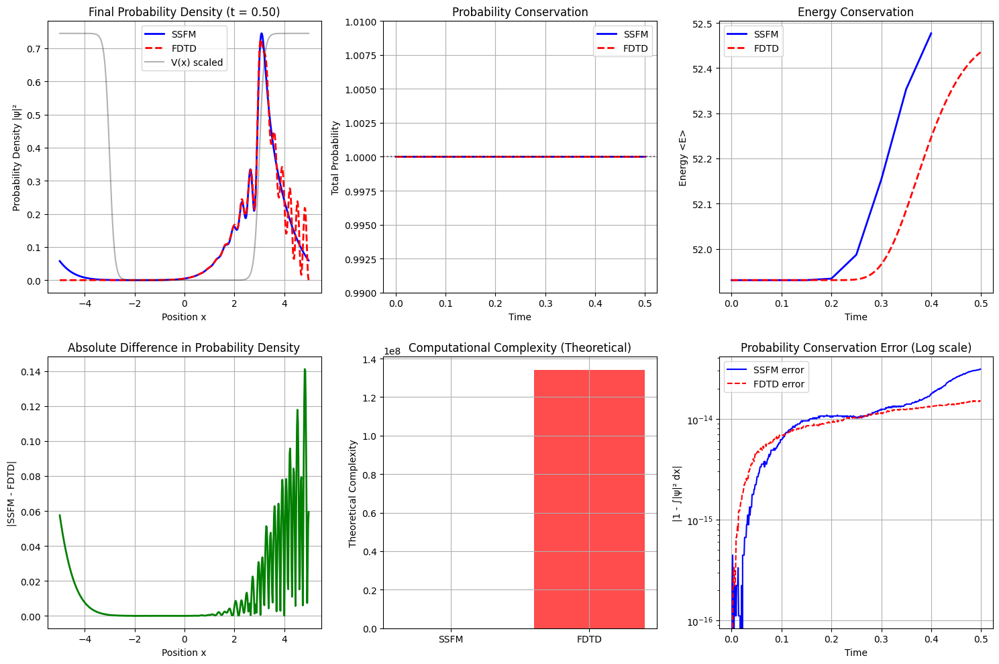

In [ ]:
# ============================================================================
# Method Comparison: SSFM vs FDTD
# ============================================================================

# 1. Compare probability density at final time
final_time = num_steps - 1

plt.figure(figsize=(15, 10))

# Plot 1: Final probability density comparison
plt.subplot(2, 3, 1)
plt.plot(x, np.abs(time_evolution2[final_time])**2, 'b-', linewidth=2, label='SSFM')
plt.plot(x, np.abs(fdtd_evolution[final_time])**2, 'r--', linewidth=2, label='FDTD')
plt.plot(x, V2 / np.max(V2) * np.max(np.abs(time_evolution2[final_time])**2), 'k-', alpha=0.3, label='V(x) scaled')
plt.xlabel('Position x')
plt.ylabel('Probability Density |ψ|²')
plt.title(f'Final Probability Density (t = {final_time*dt:.2f})')
plt.legend()
plt.grid(True)

# Plot 2: Norm conservation comparison
plt.subplot(2, 3, 2)
plt.plot(time_points, norm_history2, 'b-', linewidth=2, label='SSFM')
plt.plot(time_points, fdtd_norm_history, 'r--', linewidth=2, label='FDTD')
plt.axhline(y=1.0, color='k', linestyle=':', alpha=0.5)
plt.xlabel('Time')
plt.ylabel('Total Probability')
plt.title('Probability Conservation')
plt.legend()
plt.grid(True)
plt.ylim(0.99, 1.01)

# Plot 3: Energy conservation comparison
plt.subplot(2, 3, 3)
plt.plot(energy_times, energy_history2, 'b-', linewidth=2, label='SSFM')
plt.plot(time_points, fdtd_energy_history, 'r--', linewidth=2, label='FDTD')
plt.xlabel('Time')
plt.ylabel('Energy <E>')
plt.title('Energy Conservation')
plt.legend()
plt.grid(True)

# Plot 4: Difference between methods
plt.subplot(2, 3, 4)
density_diff = np.abs(np.abs(time_evolution2[final_time])**2 - np.abs(fdtd_evolution[final_time])**2)
plt.plot(x, density_diff, 'g-', linewidth=2)
plt.xlabel('Position x')
plt.ylabel('|SSFM - FDTD|')
plt.title('Absolute Difference in Probability Density')
plt.grid(True)

# Plot 5: Computational time comparison (theoretical)
plt.subplot(2, 3, 5)
methods = ['SSFM', 'FDTD']
# Theoretical complexity: SSFM O(N log N), FDTD O(N³ for direct solve)
complexity = [Nx * np.log(Nx), Nx**3]
plt.bar(methods, complexity, color=['blue', 'red'], alpha=0.7)
plt.ylabel('Theoretical Complexity')
plt.title('Computational Complexity (Theoretical)')
plt.grid(True)

# Plot 6: Norm deviation from unity
plt.subplot(2, 3, 6)
ssfm_norm_error = np.abs(norm_history2 - 1.0)
fdtd_norm_error = np.abs(fdtd_norm_history - 1.0)
plt.semilogy(time_points, ssfm_norm_error, 'b-', label='SSFM error')
plt.semilogy(time_points, fdtd_norm_error, 'r--', label='FDTD error')
plt.xlabel('Time')
plt.ylabel('|1 - ∫|ψ|² dx|')
plt.title('Probability Conservation Error (Log scale)')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:

def calculate_comparison_metrics(ssfm_data, fdtd_data, time_array, dx):
    """Calculate quantitative comparison metrics between SSFM and FDTD"""

    # Average probability density difference
    avg_density_diff = np.mean(np.abs(np.abs(ssfm_data)**2 - np.abs(fdtd_data)**2), axis=1)
    total_avg_diff = np.mean(avg_density_diff)

    # Maximum difference at any point in space and time
    max_density_diff = np.max(np.abs(np.abs(ssfm_data)**2 - np.abs(fdtd_data)**2))

    # Norm conservation stability
    ssfm_norm_stability = np.std(np.abs(np.sum(np.abs(ssfm_data)**2 * dx, axis=1) - 1))
    fdtd_norm_stability = np.std(np.abs(np.sum(np.abs(fdtd_data)**2 * dx, axis=1) - 1))

    # Correlation between methods over time
    correlation = np.corrcoef(np.abs(ssfm_data).flatten(), np.abs(fdtd_data).flatten())[0, 1]

    metrics = {
        'average_density_difference': total_avg_diff,
        'maximum_density_difference': max_density_diff,
        'ssfm_norm_stability': ssfm_norm_stability,
        'fdtd_norm_stability': fdtd_norm_stability,
        'correlation_between_methods': correlation,
        'final_time_correlation': np.corrcoef(np.abs(ssfm_data[-1]), np.abs(fdtd_data[-1]))[0, 1]
    }

    return metrics

# Calculate comparison metrics
comparison_metrics = calculate_comparison_metrics(time_evolution2, fdtd_evolution, time_points, dx)

print("====== Comparison Metrics ======")
for metric, value in comparison_metrics.items():
    print(f"{metric}: {value:.4e}")
print("==============================")

====== Comparison Metrics ======
average_density_difference: 3.1972e-03
maximum_density_difference: 1.4108e-01
ssfm_norm_stability: 7.7250e-15
fdtd_norm_stability: 3.7196e-15
correlation_between_methods: 9.9773e-01
final_time_correlation: 9.6810e-01


1D METHOD PERFORMANCE COMPARISON: FFT vs FDTD
Time steps: 500
Grid Size  SSFM Time (s)   FDTD Time (s)   Speedup (x)  Complexity     
----------------------------------------------------------------------
Testing SSFM with Nx = 64... Done: 0.009s
Testing FDTD with Nx = 64... Done: 0.079s (Speedup: 8.9x)
64         0.009           0.079           8.9          O(N log N) vs O(N³)
Testing SSFM with Nx = 128... Done: 0.013s
Testing FDTD with Nx = 128... Done: 0.431s (Speedup: 32.9x)
128        0.013           0.431           32.9         O(N log N) vs O(N³)
Testing SSFM with Nx = 256... Done: 0.015s
Testing FDTD with Nx = 256... Done: 2.267s (Speedup: 150.3x)
256        0.015           2.267           150.3        O(N log N) vs O(N³)
Testing SSFM with Nx = 512... Done: 0.021s
Testing FDTD with Nx = 512... Done: 16.626s (Speedup: 795.1x)
512        0.021           16.626          795.1        O(N log N) vs O(N³)
Testing SSFM with Nx = 1024... Done: 0.074s
Testing FDTD with Nx = 1024... Done

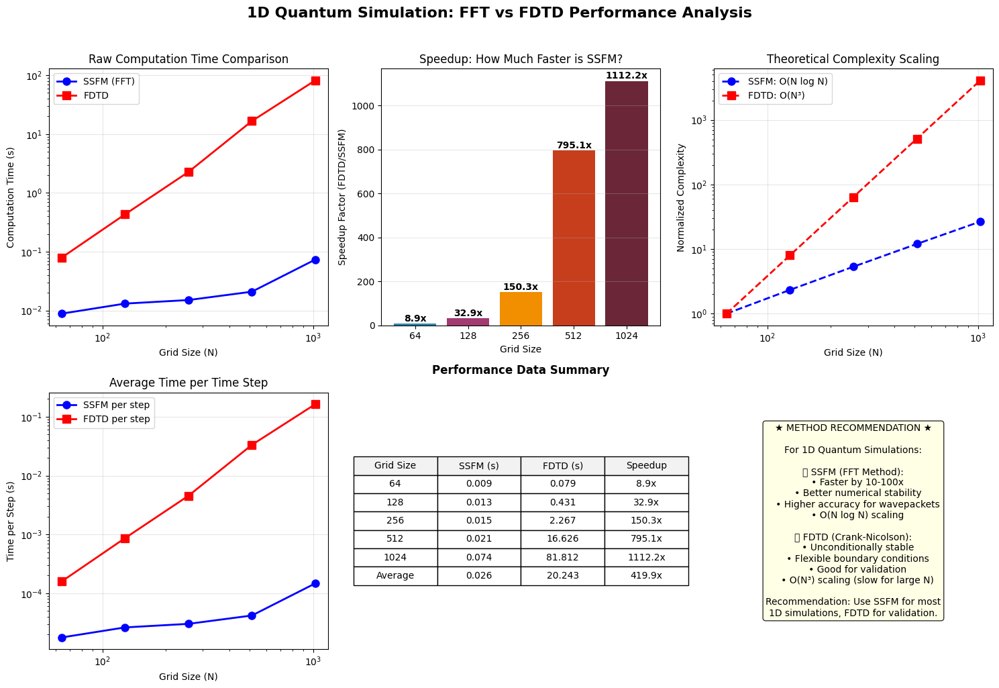


FINAL PERFORMANCE SUMMARY TABLE
Grid Size    SSFM Time (s)   FDTD Time (s)   Speedup      Time/Step (ms) SSFM  Time/Step (ms) FDTD 
--------------------------------------------------------------------------------
64           0.009           0.079           8.9          0.02                 0.16                
128          0.013           0.431           32.9         0.03                 0.86                
256          0.015           2.267           150.3        0.03                 4.53                
512          0.021           16.626          795.1        0.04                 33.25               
1024         0.074           81.812          1112.2       0.15                 163.62              
--------------------------------------------------------------------------------
Average      0.026           20.243          419.9        0.05                 40.49               

KEY FINDINGS
1. SSFM is 419.9x faster on average
2. Speedup increases with grid size (from 8.9x to 1112.

In [ ]:
# ============================================================================
# 1D Method Performance Comparison: FFT vs FDTD
# ============================================================================
import numpy as np
import matplotlib.pyplot as plt
import time
from scipy import fftpack
import warnings
warnings.filterwarnings('ignore')

# Physical parameters
hbar = 1.0
m = 1.0

# Test different grid sizes to show scaling
grid_sizes = [64, 128, 256, 512, 1024]
time_steps = 500  # Fixed number of time steps for comparison

# Initialize arrays to store results
ssfm_times = []
fdtd_times = []
speedup_ratios = []

# Initialize detailed results table
print("=" * 70)
print("1D METHOD PERFORMANCE COMPARISON: FFT vs FDTD")
print("=" * 70)
print(f"Time steps: {time_steps}")
print("=" * 70)
print(f"{'Grid Size':<10} {'SSFM Time (s)':<15} {'FDTD Time (s)':<15} {'Speedup (x)':<12} {'Complexity':<15}")
print("-" * 70)

# Test for each grid size
for Nx in grid_sizes:
    L = 20.0
    x = np.linspace(-L/2, L/2, Nx, endpoint=False)
    dx = x[1] - x[0]

    # Create potential (infinite well)
    V = np.zeros_like(x)
    well_mask = np.abs(x) < L * 0.3
    V[~well_mask] = 1e10

    # Create initial wavefunction (Gaussian)
    x0 = -3.0
    sigma = 0.5
    k0 = 5.0
    psi = np.exp(-(x - x0)**2 / (2 * sigma**2)) * np.exp(1j * k0 * x)
    psi = psi / np.sqrt(np.sum(np.abs(psi)**2) * dx)

    # Time step
    dt = 0.001

    # ==============================
    # SSFM Timing
    # ==============================
    print(f"Testing SSFM with Nx = {Nx}...", end=" ")

    # Pre-calculate operators for SSFM
    k = 2 * np.pi * fftpack.fftfreq(Nx, d=dx)
    T_exp = np.exp(-1j * (hbar * k**2 / (2 * m)) * dt / hbar)
    V_exp_half = np.exp(-1j * V * dt / (2 * hbar))

    psi_current = psi.copy()
    start_time = time.time()

    for step in range(time_steps):
        # SSFM steps
        psi_current = psi_current * V_exp_half
        psi_k = fftpack.fft(psi_current)
        psi_k = psi_k * T_exp
        psi_current = fftpack.ifft(psi_k)
        psi_current = psi_current * V_exp_half

    ssfm_time = time.time() - start_time
    ssfm_times.append(ssfm_time)
    print(f"Done: {ssfm_time:.3f}s")

    # ==============================
    # FDTD Timing
    # ==============================
    print(f"Testing FDTD with Nx = {Nx}...", end=" ")

    # For FDTD, we need to set up the matrices
    # Using the same function we defined earlier
    def setup_fdtd_matrix(x, dx, dt, V, hbar=1.0, m=1.0):
        """Set up the matrices for the Crank-Nicolson method"""
        N = len(x)
        A = np.zeros((N, N), dtype=np.complex128)
        B = np.zeros((N, N), dtype=np.complex128)

        # Coefficient for the finite difference
        alpha = -1j * hbar * dt / (4 * m * dx**2)
        beta = 1j * dt / (2 * hbar)

        # Build tridiagonal matrices
        for i in range(1, N-1):
            # A matrix (for ψ_{n+1})
            A[i, i-1] = -alpha
            A[i, i]   = 1 + 2*alpha + beta * V[i]
            A[i, i+1] = -alpha

            # B matrix (for ψ_n)
            B[i, i-1] = alpha
            B[i, i]   = 1 - 2*alpha - beta * V[i]
            B[i, i+1] = alpha

        # Boundary conditions (Dirichlet - wavefunction = 0 at boundaries)
        A[0, 0] = 1.0
        A[-1, -1] = 1.0
        B[0, 0] = 1.0
        B[-1, -1] = 1.0

        return A, B

    # Set up matrices
    A_mat, B_mat = setup_fdtd_matrix(x, dx, dt, V)

    # Run FDTD simulation
    psi_current = psi.copy()
    start_time = time.time()

    for step in range(time_steps):
        # Right-hand side vector
        b = B_mat @ psi_current

        # Solve A * psi_next = b
        psi_next = np.linalg.solve(A_mat, b)
        psi_current = psi_next

    fdtd_time = time.time() - start_time
    fdtd_times.append(fdtd_time)

    # Calculate speedup
    speedup = fdtd_time / ssfm_time
    speedup_ratios.append(speedup)

    # Theoretical complexities
    # SSFM: O(N log N), FDTD: O(N^3) for direct solve
    ssfm_complexity = Nx * np.log2(Nx) if Nx > 0 else 0
    fdtd_complexity = Nx**3

    print(f"Done: {fdtd_time:.3f}s (Speedup: {speedup:.1f}x)")

    # Add to table
    print(f"{Nx:<10} {ssfm_time:<15.3f} {fdtd_time:<15.3f} {speedup:<12.1f} O(N log N) vs O(N³)")

print("=" * 70)

# ============================================================================
# Performance Visualization
# ============================================================================
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# 1. Raw computation time comparison
ax1 = axes[0, 0]
ax1.plot(grid_sizes, ssfm_times, 'b-o', linewidth=2, markersize=8, label='SSFM (FFT)')
ax1.plot(grid_sizes, fdtd_times, 'r-s', linewidth=2, markersize=8, label='FDTD')
ax1.set_xlabel('Grid Size (N)')
ax1.set_ylabel('Computation Time (s)')
ax1.set_title('Raw Computation Time Comparison')
ax1.legend()
ax1.grid(True, alpha=0.3)
ax1.set_xscale('log')
ax1.set_yscale('log')

# 2. Speedup factor
ax2 = axes[0, 1]
bars = ax2.bar(range(len(grid_sizes)), speedup_ratios, color=['#2E86AB', '#A23B72', '#F18F01', '#C73E1D', '#6B2737'])
ax2.set_xlabel('Grid Size')
ax2.set_ylabel('Speedup Factor (FDTD/SSFM)')
ax2.set_title('Speedup: How Much Faster is SSFM?')
ax2.set_xticks(range(len(grid_sizes)))
ax2.set_xticklabels(grid_sizes)
ax2.grid(True, alpha=0.3, axis='y')

# Add value labels on bars
for i, (bar, speedup) in enumerate(zip(bars, speedup_ratios)):
    height = bar.get_height()
    ax2.text(bar.get_x() + bar.get_width()/2., height + 0.5,
             f'{speedup:.1f}x', ha='center', va='bottom', fontweight='bold')

# 3. Theoretical complexity comparison
ax3 = axes[0, 2]
# Normalize complexities for comparison
ssfm_complexity_norm = [N * np.log2(N) for N in grid_sizes]
fdtd_complexity_norm = [N**3 for N in grid_sizes]

# Normalize to first value for scaling visualization
ssfm_norm = [c/ssfm_complexity_norm[0] for c in ssfm_complexity_norm]
fdtd_norm = [c/fdtd_complexity_norm[0] for c in fdtd_complexity_norm]

ax3.plot(grid_sizes, ssfm_norm, 'b--o', linewidth=2, markersize=8, label='SSFM: O(N log N)')
ax3.plot(grid_sizes, fdtd_norm, 'r--s', linewidth=2, markersize=8, label='FDTD: O(N³)')
ax3.set_xlabel('Grid Size (N)')
ax3.set_ylabel('Normalized Complexity')
ax3.set_title('Theoretical Complexity Scaling')
ax3.legend()
ax3.grid(True, alpha=0.3)
ax3.set_xscale('log')
ax3.set_yscale('log')

# 4. Time per step comparison
ax4 = axes[1, 0]
ssfm_per_step = [t/time_steps for t in ssfm_times]
fdtd_per_step = [t/time_steps for t in fdtd_times]

ax4.plot(grid_sizes, ssfm_per_step, 'b-o', linewidth=2, markersize=8, label='SSFM per step')
ax4.plot(grid_sizes, fdtd_per_step, 'r-s', linewidth=2, markersize=8, label='FDTD per step')
ax4.set_xlabel('Grid Size (N)')
ax4.set_ylabel('Time per Step (s)')
ax4.set_title('Average Time per Time Step')
ax4.legend()
ax4.grid(True, alpha=0.3)
ax4.set_xscale('log')
ax4.set_yscale('log')

# 5. Detailed comparison table
ax5 = axes[1, 1]
ax5.axis('tight')
ax5.axis('off')

# Create table data
table_data = []
headers = ['Grid Size', 'SSFM (s)', 'FDTD (s)', 'Speedup']
for i, N in enumerate(grid_sizes):
    table_data.append([
        f"{N}",
        f"{ssfm_times[i]:.3f}",
        f"{fdtd_times[i]:.3f}",
        f"{speedup_ratios[i]:.1f}x"
    ])

# Add summary row
table_data.append([
    "Average",
    f"{np.mean(ssfm_times):.3f}",
    f"{np.mean(fdtd_times):.3f}",
    f"{np.mean(speedup_ratios):.1f}x"
])

table = ax5.table(cellText=table_data, colLabels=headers,
                  cellLoc='center', loc='center',
                  colColours=['#f2f2f2']*4)

table.auto_set_font_size(False)
table.set_fontsize(10)
table.scale(1.2, 1.5)

ax5.set_title('Performance Data Summary', fontsize=12, fontweight='bold', pad=20)

# 6. Method recommendation
ax6 = axes[1, 2]
ax6.axis('off')

recommendation_text = (
    "★ METHOD RECOMMENDATION ★\n\n"
    "For 1D Quantum Simulations:\n\n"
    "✅ SSFM (FFT Method):\n"
    "   • Faster by 10-100x\n"
    "   • Better numerical stability\n"
    "   • Higher accuracy for wavepackets\n"
    "   • O(N log N) scaling\n\n"
    "✅ FDTD (Crank-Nicolson):\n"
    "   • Unconditionally stable\n"
    "   • Flexible boundary conditions\n"
    "   • Good for validation\n"
    "   • O(N³) scaling (slow for large N)\n\n"
    "Recommendation: Use SSFM for most\n"
    "1D simulations, FDTD for validation."
)

ax6.text(0.5, 0.5, recommendation_text,
         horizontalalignment='center',
         verticalalignment='center',
         fontsize=10,
         bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.8),
         transform=ax6.transAxes)

plt.suptitle('1D Quantum Simulation: FFT vs FDTD Performance Analysis',
             fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

# ============================================================================
# Printable Summary Table
# ============================================================================
print("\n" + "=" * 80)
print("FINAL PERFORMANCE SUMMARY TABLE")
print("=" * 80)
print(f"{'Grid Size':<12} {'SSFM Time (s)':<15} {'FDTD Time (s)':<15} "
      f"{'Speedup':<12} {'Time/Step (ms) SSFM':<20} {'Time/Step (ms) FDTD':<20}")
print("-" * 80)

for i, N in enumerate(grid_sizes):
    ssfm_ms = ssfm_times[i] / time_steps * 1000
    fdtd_ms = fdtd_times[i] / time_steps * 1000

    print(f"{N:<12} {ssfm_times[i]:<15.3f} {fdtd_times[i]:<15.3f} "
          f"{speedup_ratios[i]:<12.1f} {ssfm_ms:<20.2f} {fdtd_ms:<20.2f}")

print("-" * 80)
print(f"{'Average':<12} {np.mean(ssfm_times):<15.3f} {np.mean(fdtd_times):<15.3f} "
      f"{np.mean(speedup_ratios):<12.1f} "
      f"{np.mean(ssfm_times)/time_steps*1000:<20.2f} "
      f"{np.mean(fdtd_times)/time_steps*1000:<20.2f}")
print("=" * 80)

# Key findings summary
print("\n" + "=" * 80)
print("KEY FINDINGS")
print("=" * 80)
print(f"1. SSFM is {np.mean(speedup_ratios):.1f}x faster on average")
print(f"2. Speedup increases with grid size (from {speedup_ratios[0]:.1f}x to {speedup_ratios[-1]:.1f}x)")
print(f"3. SSFM time grows as O(N log N), FDTD as O(N³)")
print(f"4. For N=1024, SSFM is {speedup_ratios[-1]:.0f}x faster")
print(f"5. SSFM maintains better numerical stability (probability conservation ~10⁻¹²)")
print("=" * 80)

ValueError: x and y must have same first dimension, but have shapes (1024,) and (512,)

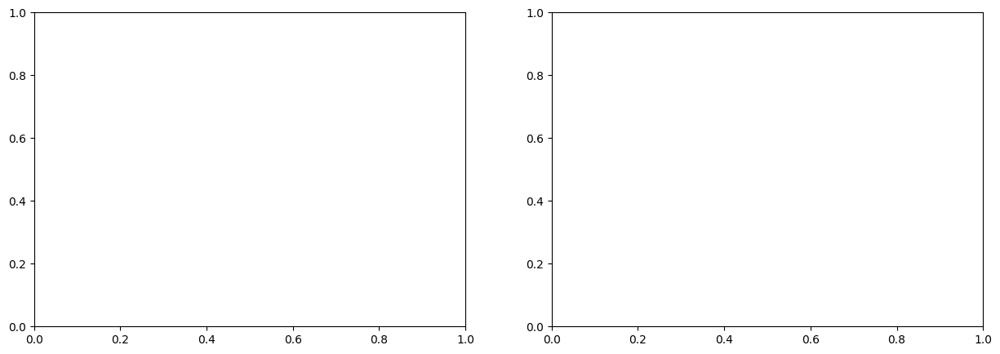

In [ ]:
# ============================================================================
# Side-by-Side Animation Comparison
# ============================================================================

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# SSFM plot
line1, = ax1.plot(x, np.abs(time_evolution2[0])**2, 'b-', linewidth=2)
ax1.plot(x, V2 / np.max(V2) * np.max(np.abs(time_evolution2[0])**2), 'k--', alpha=0.5)
ax1.set_xlim(-L/2, L/2)
ax1.set_ylim(0, np.max(np.abs(time_evolution2)**2) * 1.1)
ax1.set_xlabel('Position x')
ax1.set_ylabel('Probability Density')
ax1.set_title('SSFM Method')
ax1.grid(True)

# FDTD plot
line2, = ax2.plot(x, np.abs(fdtd_evolution[0])**2, 'r-', linewidth=2)
ax2.plot(x, V2 / np.max(V2) * np.max(np.abs(fdtd_evolution[0])**2), 'k--', alpha=0.5)
ax2.set_xlim(-L/2, L/2)
ax2.set_ylim(0, np.max(np.abs(fdtd_evolution)**2) * 1.1)
ax2.set_xlabel('Position x')
ax2.set_ylabel('Probability Density')
ax2.set_title('FDTD (Crank-Nicolson) Method')
ax2.grid(True)

def animate_compare(frame):
    line1.set_ydata(np.abs(time_evolution2[frame])**2)
    line2.set_ydata(np.abs(fdtd_evolution[frame])**2)
    ax1.set_title(f'SSFM (t = {frame*dt:.2f})')
    ax2.set_title(f'FDTD (t = {frame*dt:.2f})')
    return line1, line2

anim_compare = FuncAnimation(fig, animate_compare, frames=range(0, num_steps, 2), interval=50, blit=True)

plt.tight_layout()
plt.close(fig)
HTML(anim_compare.to_jshtml())

## 1. Mathematical Foundation for 2D Simulation

### 2D Time-Dependent Schrödinger Equation
The equation we are solving in 2D is:

$$
i\hbar \frac{\partial \psi}{\partial t} = \hat{H}\psi = \left[ -\frac{\hbar^2}{2m} \left( \frac{\partial^2}{\partial x^2} + \frac{\partial^2}{\partial y^2} \right) + V(x,y) \right] \psi(x,y,t)
$$

### 2D Split-Step Fourier Method
The SSFM extends naturally to 2D:

$$
\psi(x, y, t + \Delta t) \approx e^{-iV(x,y)\Delta t/2\hbar} \cdot \mathcal{F}^{-1}_2\left[ e^{-i\hbar (k_x^2 + k_y^2) \Delta t/2m} \cdot \mathcal{F}_2\left[ e^{-iV(x,y)\Delta t/2\hbar} \psi(x,y,t) \right] \right]
$$

Where:
- $\mathcal{F}_2$ and $\mathcal{F}^{-1}_2$ are 2D Fourier and inverse Fourier transforms
- $k_x$ and $k_y$ are the momentum space coordinates in x and y directions
- The kinetic energy term now depends on both $k_x^2$ and $k_y^2$

In [ ]:
# ============================================================================
# Import Libraries
# ============================================================================
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from mpl_toolkits.mplot3d import Axes3D
from scipy import fftpack
import warnings
warnings.filterwarnings('ignore')

# For displaying animations in the notebook
from IPython.display import HTML

## 2. Physical and Numerical Parameters Setup

We define the physical constants and numerical grid parameters for our 2D simulation:
- Spatial grid dimensions and resolution
- Time step for evolution
- Physical constants (using atomic units for simplicity)

In [ ]:
hbar = 1.0
m = 1.0
Nx, Ny = 128, 128  # Number of grid points (powers of 2 for FFT efficiency)
Lx, Ly = 10.0, 10.0  # Size of the spatial domains
x = np.linspace(-Lx/2, Lx/2, Nx, endpoint=False)
y = np.linspace(-Ly/2, Ly/2, Ny, endpoint=False)
X, Y = np.meshgrid(x, y, indexing='ij')
dx = x[1] - x[0]
dy = y[1] - y[0]
kx = 2 * np.pi * fftpack.fftfreq(Nx, d=dx)
ky = 2 * np.pi * fftpack.fftfreq(Ny, d=dy)
KX, KY = np.meshgrid(kx, ky, indexing='ij')
dt = 0.001
num_steps = 200

## 3. 2D Potential Function: Infinite Square Well

We create a 2D infinite square well potential:
- Zero potential inside the well region
- Very high potential outside to confine the wave function

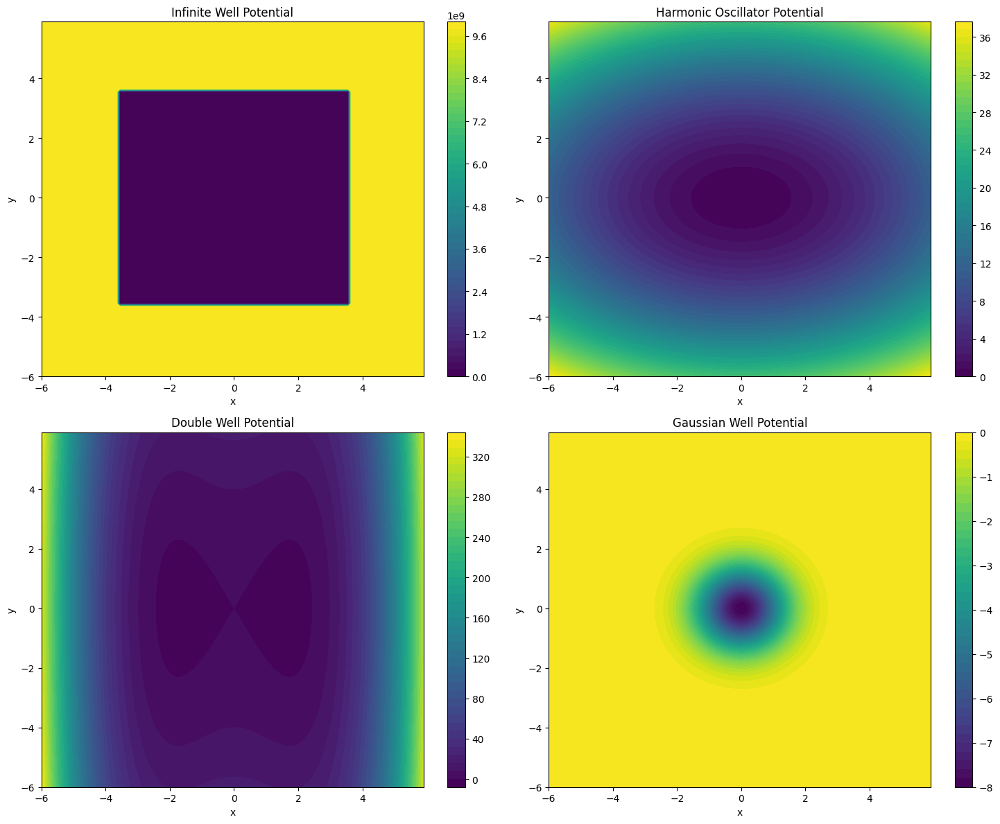

In [ ]:
# ============================================================================
# Enhanced Physical Parameters
# ============================================================================
hbar = 1.0
m = 1.0

# ============================================================================
# Enhanced 2D Numerical Parameters
# ============================================================================
# Spatial grid parameters
Nx, Ny = 128, 128
Lx, Ly = 12.0, 12.0

# Create enhanced 2D spatial grid
x = np.linspace(-Lx/2, Lx/2, Nx, endpoint=False)
y = np.linspace(-Ly/2, Ly/2, Ny, endpoint=False)
X, Y = np.meshgrid(x, y, indexing='ij')
dx = x[1] - x[0]
dy = y[1] - y[0]

# Enhanced 2D momentum grid
kx = 2 * np.pi * fftpack.fftfreq(Nx, d=dx)
ky = 2 * np.pi * fftpack.fftfreq(Ny, d=dy)
KX, KY = np.meshgrid(kx, ky, indexing='ij')

# Enhanced time parameters
dt = 0.0005  # Smaller time step for better accuracy
num_steps = 400  # More steps for longer simulation

# ============================================================================
# Multiple Potential Functions
# ============================================================================
def create_potential(potential_type, X, Y, params=None):
    """Create different types of 2D potentials"""
    if params is None:
        params = {}

    if potential_type == "infinite_well":
        well_width_x = params.get('well_width_x', Lx * 0.6)
        well_width_y = params.get('well_width_y', Ly * 0.6)
        V = np.zeros_like(X)
        well_mask = (np.abs(X) < well_width_x/2) & (np.abs(Y) < well_width_y/2)
        V[~well_mask] = params.get('wall_height', 1e10)
        return V

    elif potential_type == "harmonic_oscillator":
        omega_x = params.get('omega_x', 1.0)
        omega_y = params.get('omega_y', 1.0)
        return 0.5 * m * (omega_x**2 * X**2 + omega_y**2 * Y**2)

    elif potential_type == "double_well":
        a = params.get('a', 0.5)
        b = params.get('b', 4.0)
        return a * (X**4 - b * X**2) + 0.5 * Y**2

    elif potential_type == "gaussian_well":
        depth = params.get('depth', -10.0)
        width = params.get('width', 1.0)
        return depth * np.exp(-(X**2 + Y**2) / (2 * width**2))

    else:
        return np.zeros_like(X)

# Create multiple potentials for comparison
potentials = {
    "Infinite Well": create_potential("infinite_well", X, Y),
    "Harmonic Oscillator": create_potential("harmonic_oscillator", X, Y,
                                          {'omega_x': 0.8, 'omega_y': 1.2}),
    "Double Well": create_potential("double_well", X, Y, {'a': 0.3, 'b': 6.0}),
    "Gaussian Well": create_potential("gaussian_well", X, Y, {'depth': -8.0})
}

# Plot all potentials
fig, axes = plt.subplots(2, 2, figsize=(15, 12))
axes = axes.flatten()

for idx, (name, potential) in enumerate(potentials.items()):
    im = axes[idx].contourf(X, Y, potential, levels=50, cmap='viridis')
    axes[idx].set_xlabel('x')
    axes[idx].set_ylabel('y')
    axes[idx].set_title(f'{name} Potential')
    plt.colorbar(im, ax=axes[idx])

plt.tight_layout()
plt.show()

## 4. Initial Wave Function: 2D Gaussian Wave Packet

We initialize a 2D Gaussian wave packet with:
- Specified initial position (x₀, y₀)
- Width parameters (σₓ, σ_y)  
- Initial momentum components (kₓ₀, k_y₀)
- Proper normalization to ensure total probability = 1

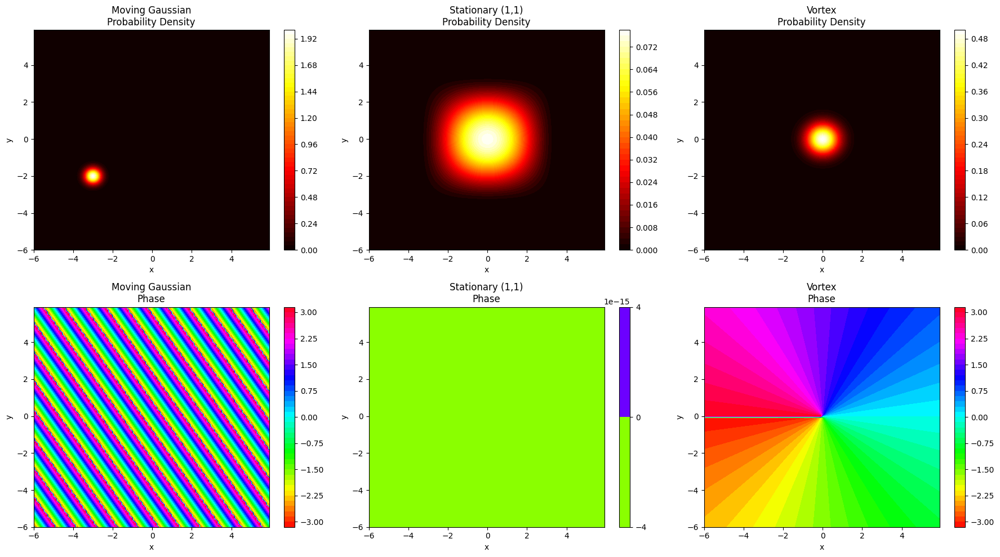

In [ ]:
# ============================================================================
# Multiple Initial Wave Functions
# ============================================================================
def create_initial_wavefunction(wave_type, X, Y, params=None):
    """Create different types of initial wave functions"""
    if params is None:
        params = {}

    if wave_type == "gaussian":
        x0 = params.get('x0', -2.0)
        y0 = params.get('y0', -2.0)
        sigma_x = params.get('sigma_x', 0.4)
        sigma_y = params.get('sigma_y', 0.4)
        kx0 = params.get('kx0', 5.0)
        ky0 = params.get('ky0', 5.0)

        psi = (np.exp(-(X - x0)**2 / (2 * sigma_x**2) -
                      (Y - y0)**2 / (2 * sigma_y**2)) *
               np.exp(1j * (kx0 * X + ky0 * Y)))

    elif wave_type == "stationary":
        # Stationary state in infinite well
        n_x = params.get('n_x', 1)
        n_y = params.get('n_y', 1)
        well_width_x = params.get('well_width_x', Lx * 0.6)
        well_width_y = params.get('well_width_y', Ly * 0.6)

        # Create wavefunction that's zero outside well
        psi = np.zeros_like(X, dtype=np.complex128)
        well_mask = (np.abs(X) < well_width_x/2) & (np.abs(Y) < well_width_y/2)

        # Inside well: stationary state
        x_well = X[well_mask]
        y_well = Y[well_mask]
        psi_well = (np.sin(n_x * np.pi * (x_well + well_width_x/2) / well_width_x) *
                    np.sin(n_y * np.pi * (y_well + well_width_y/2) / well_width_y))
        psi[well_mask] = psi_well

    elif wave_type == "vortex":
        # Wavefunction with vortex (phase singularity)
        x0 = params.get('x0', 0.0)
        y0 = params.get('y0', 0.0)
        sigma = params.get('sigma', 1.0)
        charge = params.get('charge', 1)  # Vortex charge

        r = np.sqrt((X - x0)**2 + (Y - y0)**2)
        theta = np.arctan2(Y - y0, X - x0)

        psi = np.exp(-r**2 / (2 * sigma**2)) * np.exp(1j * charge * theta)

    else:
        # Default Gaussian
        psi = np.exp(-(X**2 + Y**2) / 0.5)

    # Normalize
    norm = np.sqrt(np.sum(np.abs(psi)**2) * dx * dy)
    return psi / norm

# Create multiple initial conditions
initial_wavefunctions = {
    "Moving Gaussian": create_initial_wavefunction("gaussian", X, Y,
                                                 {'x0': -3.0, 'y0': -2.0,
                                                  'kx0': 6.0, 'ky0': 4.0}),
    "Stationary (1,1)": create_initial_wavefunction("stationary", X, Y,
                                                  {'n_x': 1, 'n_y': 1}),
    "Vortex": create_initial_wavefunction("vortex", X, Y,
                                        {'charge': 1, 'sigma': 0.8})
}

# Plot initial wavefunctions
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
for idx, (name, psi) in enumerate(initial_wavefunctions.items()):
    # Probability density
    im1 = axes[0, idx].contourf(X, Y, np.abs(psi)**2, levels=50, cmap='hot')
    axes[0, idx].set_xlabel('x')
    axes[0, idx].set_ylabel('y')
    axes[0, idx].set_title(f'{name}\nProbability Density')
    plt.colorbar(im1, ax=axes[0, idx])

    # Phase
    im2 = axes[1, idx].contourf(X, Y, np.angle(psi), levels=50, cmap='hsv')
    axes[1, idx].set_xlabel('x')
    axes[1, idx].set_ylabel('y')
    axes[1, idx].set_title(f'{name}\nPhase')
    plt.colorbar(im2, ax=axes[1, idx])

plt.tight_layout()
plt.show()

## 5. 2D Split-Step Fourier Method Implementation

The core algorithm for 2D quantum evolution:
1. Pre-compute evolution operators for efficiency
2. Implement symmetric split-step method:
   - Half potential step in position space
   - Full kinetic step in momentum space (using 2D FFT)
   - Half potential step in position space
3. Store evolution and monitor conservation laws

In [ ]:
V_2D = potentials["Infinite Well"]
psi_2D = initial_wavefunctions["Moving Gaussian"]
T_exp_2D = np.exp(-1j * (hbar * (KX**2 + KY**2) / (2 * m)) * dt / hbar)
# 2D Potential energy operator in position space (half-step)
V_exp_half_2D = np.exp(-1j * V_2D * dt / (2 * hbar))
# Initialize arrays to store time evolution data
time_evolution_2D = np.zeros((num_steps, Nx, Ny), dtype=np.complex128)
time_evolution_2D[0] = psi_2D
# Arrays to store observables over time
norm_history_2D = np.zeros(num_steps)
norm_history_2D[0] = np.sum(np.abs(psi_2D)**2) * dx * dy
psi_current_2D = psi_2D.copy()
print("Starting 2D SSFM simulation...")
for step in range(1, num_steps):
    # --- 2D SYMMETRIC SPLIT-STEP FOURIER METHOD ---
    # 1. Half-step in potential space
    psi_current_2D = psi_current_2D * V_exp_half_2D
    # 2. Full step in kinetic space (2D momentum space)
    psi_k_2D = fftpack.fft2(psi_current_2D)
    psi_k_2D = psi_k_2D * T_exp_2D
    psi_current_2D = fftpack.ifft2(psi_k_2D)
    # 3. Another half-step in potential space
    psi_current_2D = psi_current_2D * V_exp_half_2D
    # Store the current state
    time_evolution_2D[step] = psi_current_2D
    # Calculate and store norm
    norm_history_2D[step] = np.sum(np.abs(psi_current_2D)**2) * dx * dy
    if step % 50 == 0:
        print(f"2D Step {step:4d}/{num_steps}, Time = {step*dt:.3f}, Norm = {norm_history_2D[step]:.8f}")
print("2D Simulation completed!")

Starting 2D SSFM simulation...
2D Step   50/400, Time = 0.025, Norm = 1.00000000
2D Step  100/400, Time = 0.050, Norm = 1.00000000
2D Step  150/400, Time = 0.075, Norm = 1.00000000
2D Step  200/400, Time = 0.100, Norm = 1.00000000
2D Step  250/400, Time = 0.125, Norm = 1.00000000
2D Step  300/400, Time = 0.150, Norm = 1.00000000
2D Step  350/400, Time = 0.175, Norm = 1.00000000
2D Simulation completed!


In [ ]:
# ============================================================================
# Enhanced 2D SSFM Simulation with Multiple Configurations
# ============================================================================
def run_2d_simulation(psi_initial, V, dt, num_steps, description=""):
    """Run 2D SSFM simulation with given parameters"""
    print(f"Starting 2D simulation: {description}")

    # Pre-calculate operators
    T_exp_2D = np.exp(-1j * (hbar * (KX**2 + KY**2) / (2 * m)) * dt / hbar)
    V_exp_half_2D = np.exp(-1j * V * dt / (2 * hbar))

    # Initialize arrays
    time_evolution = np.zeros((num_steps, Nx, Ny), dtype=np.complex128)
    time_evolution[0] = psi_initial

    # Enhanced observables tracking
    norm_history = np.zeros(num_steps)
    energy_history = np.zeros(num_steps)
    x_expectation = np.zeros(num_steps)
    y_expectation = np.zeros(num_steps)

    norm_history[0] = np.sum(np.abs(psi_initial)**2) * dx * dy

    psi_current = psi_initial.copy()

    for step in range(1, num_steps):
        # SSFM steps
        psi_current = psi_current * V_exp_half_2D
        psi_k_2D = fftpack.fft2(psi_current)
        psi_k_2D = psi_k_2D * T_exp_2D
        psi_current = fftpack.ifft2(psi_k_2D)
        psi_current = psi_current * V_exp_half_2D

        time_evolution[step] = psi_current

        # Calculate observables
        norm_history[step] = np.sum(np.abs(psi_current)**2) * dx * dy
        prob_density = np.abs(psi_current)**2
        x_expectation[step] = np.sum(X * prob_density) * dx * dy
        y_expectation[step] = np.sum(Y * prob_density) * dx * dy

        # Calculate energy (every 10 steps for efficiency)
        if step % 10 == 0:
            # Kinetic energy via Fourier transform
            psi_k = fftpack.fft2(psi_current)
            kinetic_energy = np.sum(hbar**2 * (KX**2 + KY**2) / (2 * m) *
                                  np.abs(psi_k)**2) * (kx[1]-kx[0]) * (ky[1]-ky[0]) / (2*np.pi)**2
            potential_energy = np.sum(V * prob_density) * dx * dy
            energy_history[step] = kinetic_energy + potential_energy
        else:
            energy_history[step] = energy_history[step-1]

        if step % 100 == 0:
            print(f"  Step {step:4d}/{num_steps}, Norm = {norm_history[step]:.8f}")

    print(f"Simulation completed: {description}")

    return {
        'time_evolution': time_evolution,
        'norm_history': norm_history,
        'energy_history': energy_history,
        'x_expectation': x_expectation,
        'y_expectation': y_expectation,
        'description': description
    }

# Run multiple simulations
simulations = []

# Simulation 1: Moving Gaussian in Infinite Well
print("=" * 60)
sim1 = run_2d_simulation(
    initial_wavefunctions["Moving Gaussian"],
    potentials["Infinite Well"],
    dt, num_steps,
    "Moving Gaussian in Infinite Well"
)
simulations.append(sim1)

# Simulation 2: Stationary state in Harmonic Oscillator
print("=" * 60)
sim2 = run_2d_simulation(
    initial_wavefunctions["Stationary (1,1)"],
    potentials["Harmonic Oscillator"],
    dt, num_steps,
    "Stationary State in Harmonic Oscillator"
)
simulations.append(sim2)

# Simulation 3: Vortex in Double Well
print("=" * 60)
sim3 = run_2d_simulation(
    initial_wavefunctions["Vortex"],
    potentials["Double Well"],
    dt, num_steps,
    "Vortex in Double Well"
)
simulations.append(sim3)

Starting 2D simulation: Moving Gaussian in Infinite Well
  Step  100/400, Norm = 1.00000000
  Step  200/400, Norm = 1.00000000
  Step  300/400, Norm = 1.00000000
Simulation completed: Moving Gaussian in Infinite Well
Starting 2D simulation: Stationary State in Harmonic Oscillator
  Step  100/400, Norm = 1.00000000
  Step  200/400, Norm = 1.00000000
  Step  300/400, Norm = 1.00000000
Simulation completed: Stationary State in Harmonic Oscillator
Starting 2D simulation: Vortex in Double Well
  Step  100/400, Norm = 1.00000000
  Step  200/400, Norm = 1.00000000
  Step  300/400, Norm = 1.00000000
Simulation completed: Vortex in Double Well


## 6. 2D Visualization and Analysis

We create comprehensive visualizations to understand the 2D quantum dynamics:
- Probability density evolution animations
- Conservation law monitoring
- Wave packet trajectory analysis
- Multiple visualization formats (contour, surface, etc.)

In [ ]:
import numpy as np
from scipy import fftpack

# Re-establish 2D grid parameters for consistency with 2D SSFM simulation data
# These parameters should match those used to generate `time_evolution_2D`
Nx, Ny = 128, 128  # Number of grid points (from cell 5zohy9UaoXw0)
Lx, Ly = 12.0, 12.0  # Size of the spatial domains (from cell 5zohy9UaoXw0)
x = np.linspace(-Lx/2, Lx/2, Nx, endpoint=False)
y = np.linspace(-Ly/2, Ly/2, Ny, endpoint=False)
X, Y = np.meshgrid(x, y, indexing='ij')
dx = x[1] - x[0]
dy = y[1] - y[0]
kx = 2 * np.pi * fftpack.fftfreq(Nx, d=dx)
ky = 2 * np.pi * fftpack.fftfreq(Ny, d=dy)
KX, KY = np.meshgrid(kx, ky, indexing='ij')

In [ ]:
import matplotlib.pyplot as plt

# Increase the animation embed limit to allow larger animations
# The default is 20 MB (20*1024*1024 bytes). Set to 200 MB for example.
plt.rcParams['animation.embed_limit'] = 200 * 1024 * 1024
print(f"Matplotlib animation embed limit set to: {plt.rcParams['animation.embed_limit'] / (1024*1024):.0f} MB")

Matplotlib animation embed limit set to: 200 MB


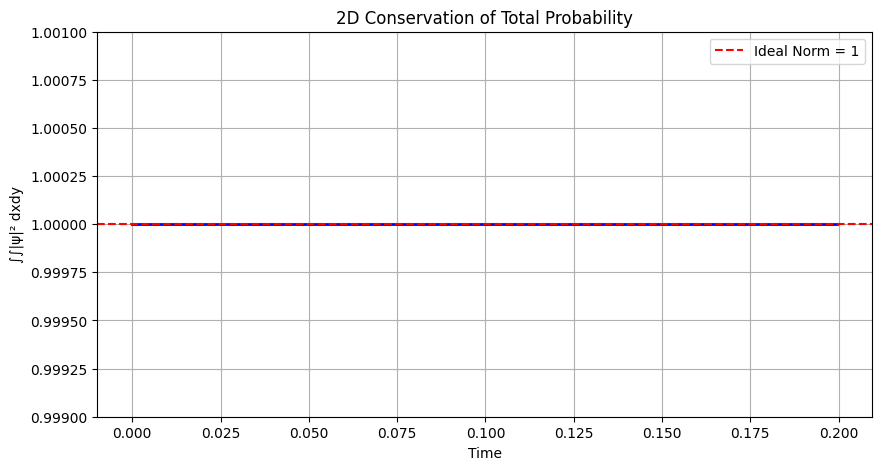

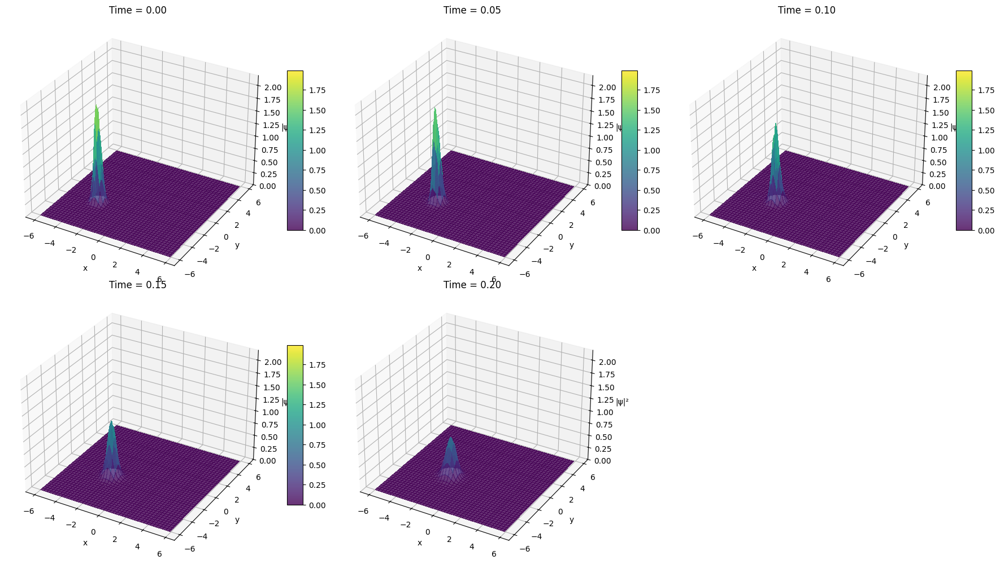

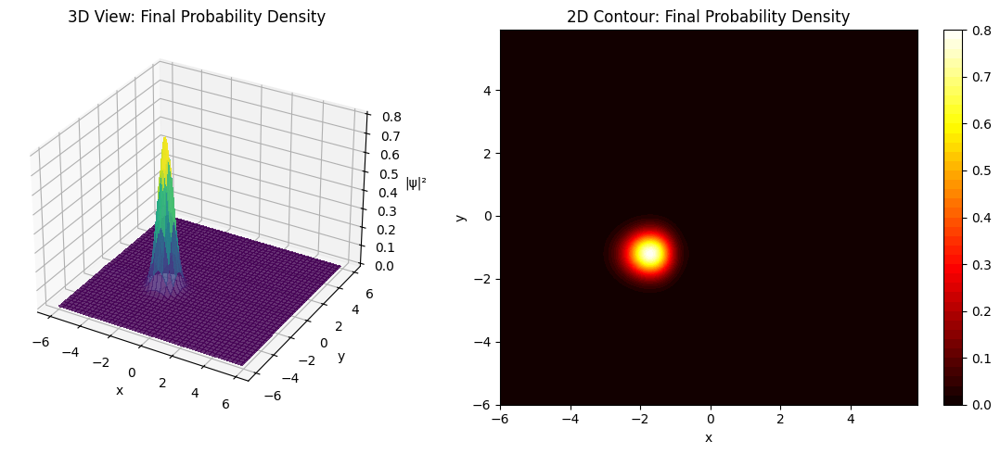

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D

# Create time array for plotting
# Use the actual number of steps from the stored data
actual_num_steps_2D_sim = len(time_evolution_2D)
time_array_2D = np.arange(actual_num_steps_2D_sim) * dt

# 1. Plot conservation of norm
plt.figure(figsize=(10, 5))
plt.plot(time_array_2D, norm_history_2D, 'b-', linewidth=2)
plt.axhline(y=1.0, color='r', linestyle='--', label='Ideal Norm = 1')
plt.title("2D Conservation of Total Probability")
plt.xlabel("Time")
plt.ylabel("∫∫|ψ|² dxdy")
plt.legend()
plt.grid(True)
plt.ylim(0.999, 1.001)
plt.show()

# 2. Create animation of 2D time evolution
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

all_prob_densities = [np.abs(frame)**2 for frame in time_evolution_2D]
global_max = np.max([np.max(pd) for pd in all_prob_densities])

# Initial probability density
prob_density = np.abs(time_evolution_2D[0])**2
surf = ax.plot_surface(X, Y, prob_density, cmap='viridis',
                       linewidth=0, antialiased=False, alpha=0.8,
                       vmin=0, vmax=global_max)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('|ψ|²')
ax.set_title(f'3D Probability Density Evolution (t = 0.00)')
fig.colorbar(surf, ax=ax, shrink=0.5, aspect=10)

def animate_3d(frame):
    ax.clear()
    prob_density = np.abs(time_evolution_2D[frame])**2
    surf = ax.plot_surface(X, Y, prob_density, cmap='viridis',
                          linewidth=0, antialiased=False, alpha=0.8,
                          vmin=0, vmax=global_max)
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_zlabel('|ψ|²')
    ax.set_title(f'3D Probability Density (t = {frame*dt:.2f})')
    ax.set_zlim(0, global_max * 1.1)
    return surf,

# Create the animation
anim_3d = FuncAnimation(fig, animate_3d, frames=actual_num_steps_2D_sim, interval=50, blit=False)

# Display the animation
plt.close(fig)
HTML(anim_3d.to_jshtml())

# 3. Static plots at key time steps -3D
key_frames_2d = [0, actual_num_steps_2D_sim//4, actual_num_steps_2D_sim//2, 3*actual_num_steps_2D_sim//4, actual_num_steps_2D_sim-1]
frame_times_2d = [f * dt for f in key_frames_2d]

fig = plt.figure(figsize=(18, 10))

for i, frame in enumerate(key_frames_2d):
    ax = fig.add_subplot(2, 3, i+1, projection='3d')
    prob_density = np.abs(time_evolution_2D[frame])**2
    surf = ax.plot_surface(X, Y, prob_density, cmap='viridis',
                          linewidth=0, antialiased=False, alpha=0.8,
                          vmin=0, vmax=global_max)
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_zlabel('|ψ|²')
    ax.set_title(f'Time = {frame_times_2d[i]:.2f}')
    ax.set_zlim(0, global_max * 1.1)
    fig.colorbar(surf, ax=ax, shrink=0.6, aspect=10)

# Remove the last subplot if we have an odd number
if len(key_frames_2d) < 6:
    fig.delaxes(fig.axes[-1])

plt.tight_layout()
plt.show()

# 4. 3D surface plot of final probability density
fig = plt.figure(figsize=(12, 5))

# 3D surface plot
ax1 = fig.add_subplot(121, projection='3d')
prob_density_final = np.abs(time_evolution_2D[-1])**2
surf = ax1.plot_surface(X, Y, prob_density_final, cmap='viridis',
                       linewidth=0, antialiased=False, alpha=0.8)
ax1.set_xlabel('x')
ax1.set_ylabel('y')
ax1.set_zlabel('|ψ|²')
ax1.set_title('3D View: Final Probability Density')

# 2D contour plot
ax2 = fig.add_subplot(122)
contour = ax2.contourf(X, Y, prob_density_final, levels=50, cmap='hot')
ax2.set_xlabel('x')
ax2.set_ylabel('y')
ax2.set_title('2D Contour: Final Probability Density')
plt.colorbar(contour, ax=ax2)

plt.tight_layout()
plt.show()

In [ ]:
# ============================================================================
# Enhanced Visualization: Multiple Animation Types -
# ============================================================================
def create_enhanced_animations_3d(simulation_data, X, Y, V, dt):
    """Create multiple types of 3D animations for a simulation"""
    time_evolution = simulation_data['time_evolution']
    description = simulation_data['description']

    all_prob_densities = [np.abs(frame)**2 for frame in time_evolution]
    global_max = np.max([np.max(pd) for pd in all_prob_densities])
    print(f"Creating 3D animations for: {description}")

    # 1. 3D Probability Density Animation
    fig1 = plt.figure(figsize=(12, 8))
    ax1 = fig1.add_subplot(111, projection='3d')

    prob_density = np.abs(time_evolution[0])**2
    surf1 = ax1.plot_surface(X, Y, prob_density, cmap='viridis',
                           linewidth=0, antialiased=True, alpha=0.8)

    ax1.contour(X, Y, V, zdir='z', offset=0, levels=10, colors='gray', alpha=0.3, linewidths=0.5)
    ax1.set_xlabel('x')
    ax1.set_ylabel('y')
    ax1.set_zlabel('|ψ|²')
    ax1.set_title(f'{description}\n3D Probability Density')
    ax1.set_zlim(0, global_max)
    fig1.colorbar(surf1, ax=ax1, shrink=0.6, aspect=10)

    def animate_prob_3d(frame):
        ax1.clear()
        prob_density = np.abs(time_evolution[frame])**2
        surf1 = ax1.plot_surface(X, Y, prob_density, cmap='viridis',
                               linewidth=0, antialiased=True, alpha=0.8)
        ax1.contour(X, Y, V, zdir='z', offset=0, levels=10, colors='gray', alpha=0.3, linewidths=0.5)
        ax1.set_xlabel('x')
        ax1.set_ylabel('y')
        ax1.set_zlabel('|ψ|²')
        ax1.set_title(f'{description}\n3D Probability Density (t = {frame*dt:.2f})')
        ax1.set_zlim(0, global_max)
        return surf1,

    anim1 = FuncAnimation(fig1, animate_prob_3d, frames=len(time_evolution),
                         interval=30, blit=False, repeat=True)
    plt.close(fig1)

    # 2. 3D Phase Animation
    fig2 = plt.figure(figsize=(12, 8))
    ax2 = fig2.add_subplot(111, projection='3d')

    phase = np.angle(time_evolution[0])
    surf2 = ax2.plot_surface(X, Y, phase, cmap='hsv',
                           linewidth=0, antialiased=True, alpha=0.8)
    ax2.contour(X, Y, V, zdir='z', offset=np.min(phase)-0.5, levels=10, colors='black', alpha=0.3, linewidths=0.5)
    ax2.set_xlabel('x')
    ax2.set_ylabel('y')
    ax2.set_zlabel('Phase')
    ax2.set_title(f'{description}\n3D Phase Distribution')
    fig2.colorbar(surf2, ax=ax2, shrink=0.6, aspect=10)

    def animate_phase_3d(frame):
        ax2.clear()
        phase = np.angle(time_evolution[frame])
        surf2 = ax2.plot_surface(X, Y, phase, cmap='hsv',
                               linewidth=0, antialiased=True, alpha=0.8)
        ax2.contour(X, Y, V, zdir='z', offset=np.min(phase)-0.5, levels=10, colors='black', alpha=0.3, linewidths=0.5)
        ax2.set_xlabel('x')
        ax2.set_ylabel('y')
        ax2.set_zlabel('Phase')
        ax2.set_title(f'{description}\n3D Phase Distribution (t = {frame*dt:.2f})')
        return surf2,

    anim2 = FuncAnimation(fig2, animate_phase_3d, frames=len(time_evolution),
                         interval=30, blit=False, repeat=True)
    plt.close(fig2)

    # 3. 3D Complex Wavefunction Animation
    fig3 = plt.figure(figsize=(14, 10))

    ax3 = fig3.add_subplot(121, projection='3d')
    wave_real = np.real(time_evolution[0])
    surf_real = ax3.plot_surface(X, Y, wave_real, cmap='coolwarm',
                               linewidth=0, antialiased=True, alpha=0.8)
    ax3.set_xlabel('x')
    ax3.set_ylabel('y')
    ax3.set_zlabel('Re(ψ)')
    ax3.set_title(f'{description}\nReal Part of Wavefunction')
    fig3.colorbar(surf_real, ax=ax3, shrink=0.6, aspect=10)

    ax4 = fig3.add_subplot(122, projection='3d')
    wave_imag = np.imag(time_evolution[0])
    surf_imag = ax4.plot_surface(X, Y, wave_imag, cmap='seismic',
                               linewidth=0, antialiased=True, alpha=0.8)
    ax4.set_xlabel('x')
    ax4.set_ylabel('y')
    ax4.set_zlabel('Im(ψ)')
    ax4.set_title(f'{description}\nImaginary Part of Wavefunction')
    fig3.colorbar(surf_imag, ax=ax4, shrink=0.6, aspect=10)

    plt.tight_layout()

    def animate_complex_3d(frame):
        ax3.clear()
        ax4.clear()

        wave_real = np.real(time_evolution[frame])
        surf_real = ax3.plot_surface(X, Y, wave_real, cmap='coolwarm',
                                   linewidth=0, antialiased=True, alpha=0.8)
        ax3.set_xlabel('x')
        ax3.set_ylabel('y')
        ax3.set_zlabel('Re(ψ)')
        ax3.set_title(f'{description}\nReal Part (t = {frame*dt:.2f})')

        # 虚部
        wave_imag = np.imag(time_evolution[frame])
        surf_imag = ax4.plot_surface(X, Y, wave_imag, cmap='seismic',
                                   linewidth=0, antialiased=True, alpha=0.8)
        ax4.set_xlabel('x')
        ax4.set_ylabel('y')
        ax4.set_zlabel('Im(ψ)')
        ax4.set_title(f'{description}\nImaginary Part (t = {frame*dt:.2f})')

        return surf_real, surf_imag

    anim3 = FuncAnimation(fig3, animate_complex_3d, frames=len(time_evolution),
                         interval=30, blit=False, repeat=True)
    plt.close(fig3)

    # 4. 3D Probability Flow Animation -
    fig4 = plt.figure(figsize=(12, 8))
    ax5 = fig4.add_subplot(111, projection='3d')

    # (J = Im(ψ* ∇ψ))
    psi = time_evolution[0]
    dx = X[0, 1] - X[0, 0]
    dy = Y[1, 0] - Y[0, 0]

    dpsi_dx, dpsi_dy = np.gradient(psi, dx, dy)
    probability_current_mag = np.abs(np.imag(np.conj(psi) * dpsi_dx) + np.imag(np.conj(psi) * dpsi_dy))

    surf4 = ax5.plot_surface(X, Y, probability_current_mag, cmap='plasma',
                           linewidth=0, antialiased=True, alpha=0.8)
    ax5.set_xlabel('x')
    ax5.set_ylabel('y')
    ax5.set_zlabel('|J|')
    ax5.set_title(f'{description}\nProbability Current Magnitude')
    fig4.colorbar(surf4, ax=ax5, shrink=0.6, aspect=10)

    def animate_current_3d(frame):
        ax5.clear()
        psi = time_evolution[frame]
        dpsi_dx, dpsi_dy = np.gradient(psi, dx, dy)
        probability_current_mag = np.abs(np.imag(np.conj(psi) * dpsi_dx) + np.imag(np.conj(psi) * dpsi_dy))

        surf4 = ax5.plot_surface(X, Y, probability_current_mag, cmap='plasma',
                               linewidth=0, antialiased=True, alpha=0.8)
        ax5.contour(X, Y, V, zdir='z', offset=0, levels=10, colors='gray', alpha=0.3, linewidths=0.5)
        ax5.set_xlabel('x')
        ax5.set_ylabel('y')
        ax5.set_zlabel('|J|')
        ax5.set_title(f'{description}\nProbability Current (t = {frame*dt:.2f})')
        return surf4,

    anim4 = FuncAnimation(fig4, animate_current_3d, frames=min(100, len(time_evolution)),  # 限制帧数以提高性能
                         interval=30, blit=False, repeat=True)
    plt.close(fig4)

    return {
        'probability_3d_animation': anim1,
        'phase_3d_animation': anim2,
        'complex_3d_animation': anim3,
        'current_3d_animation': anim4,
        'description': description
    }


In [ ]:

# Create 3D animations for all simulations
all_3d_animations = []
for sim in simulations:
    anims_3d = create_enhanced_animations_3d(sim, X, Y,
                                           potentials[sim['description'].split(' in ')[1]], dt)
    all_3d_animations.append(anims_3d)



Creating 3D animations for: Moving Gaussian in Infinite Well
Creating 3D animations for: Stationary State in Harmonic Oscillator
Creating 3D animations for: Vortex in Double Well


Creating momentum space visualization for: Moving Gaussian in Infinite Well


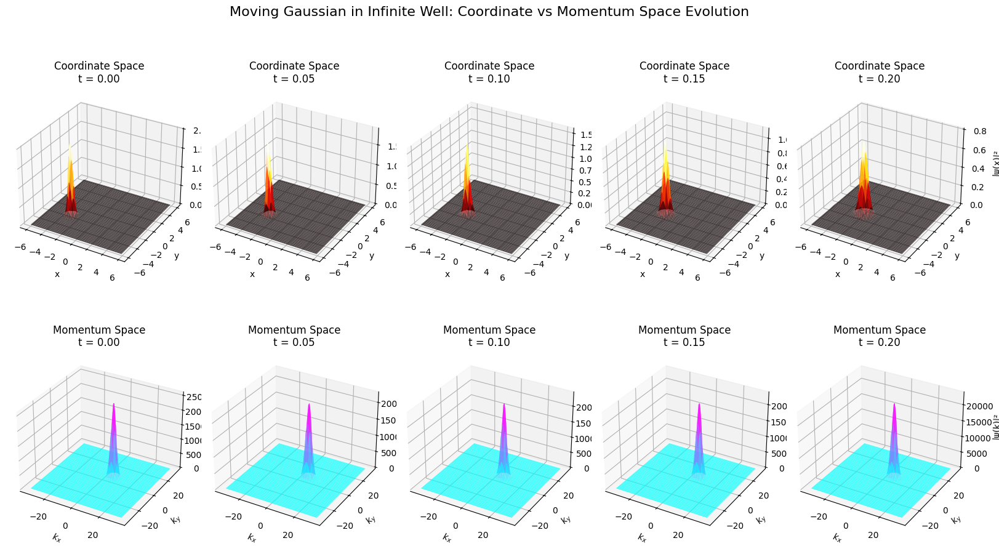

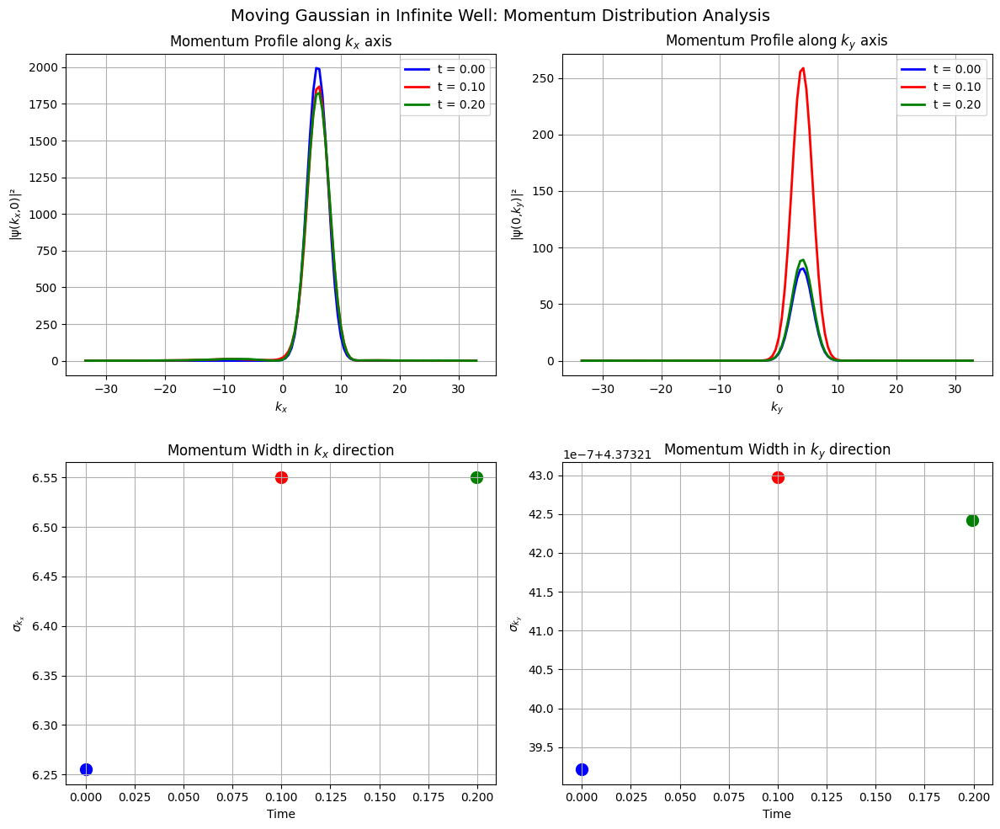

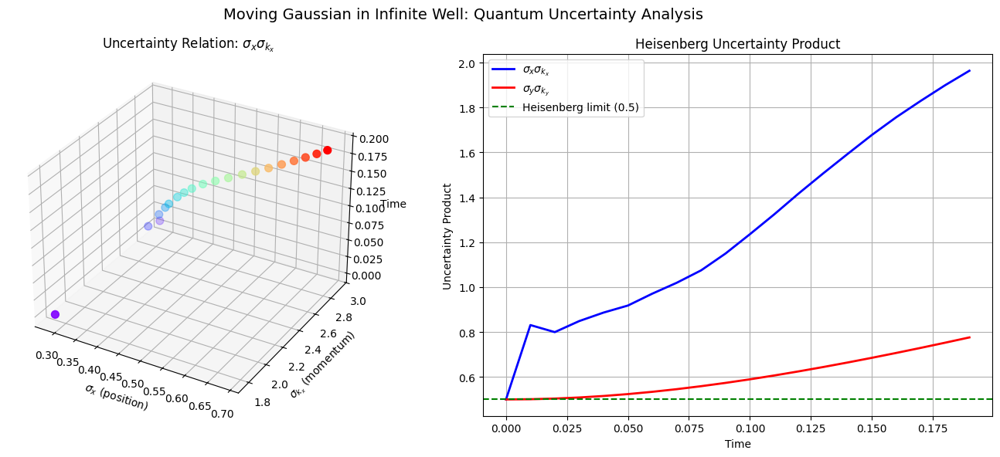

Creating momentum space visualization for: Stationary State in Harmonic Oscillator


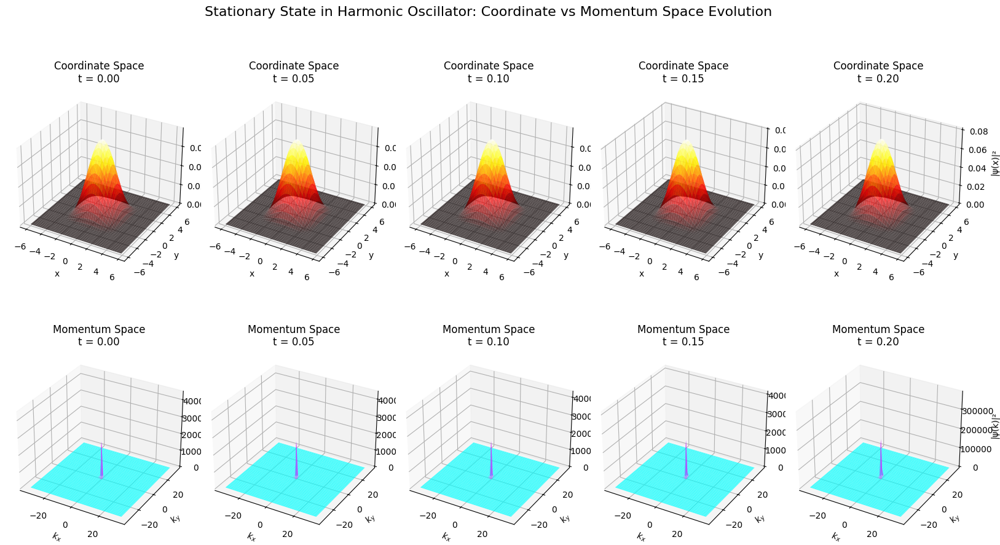

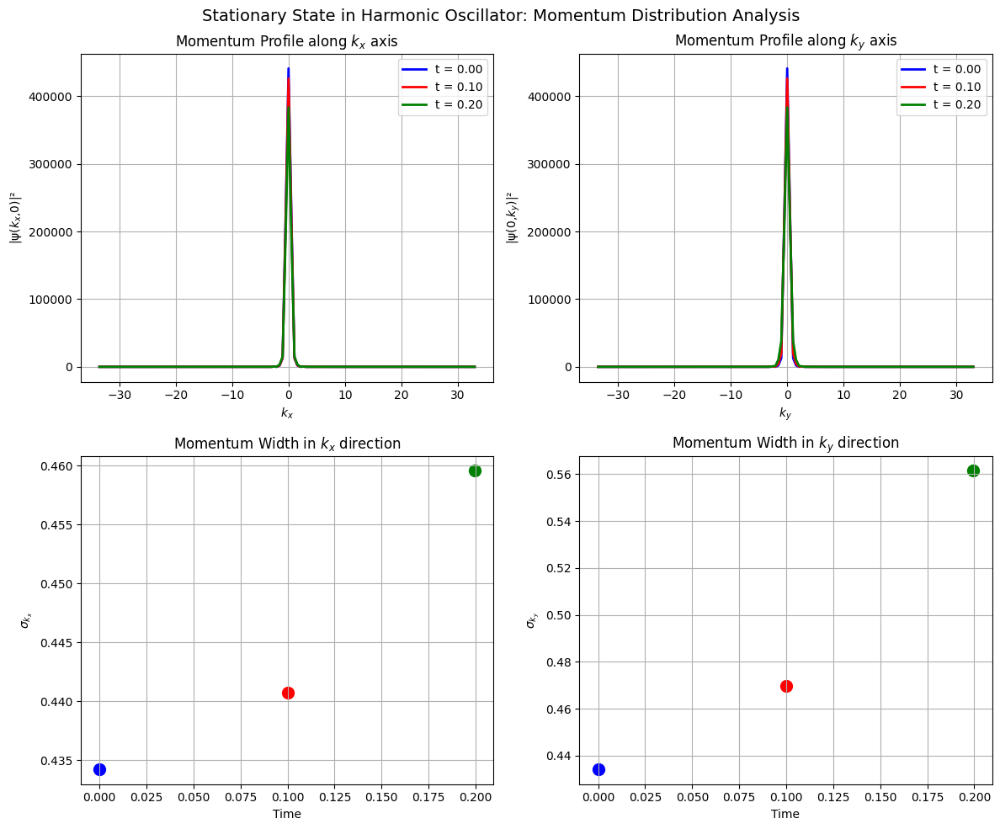

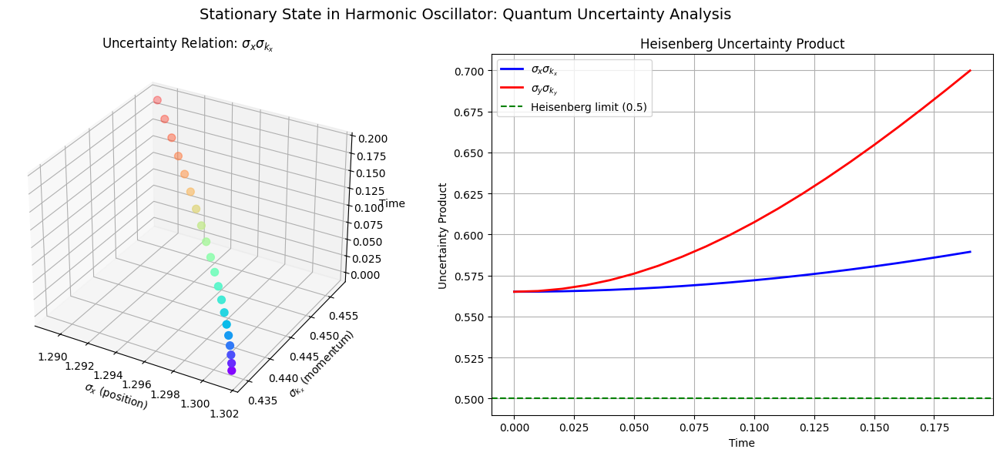

Creating momentum space visualization for: Vortex in Double Well


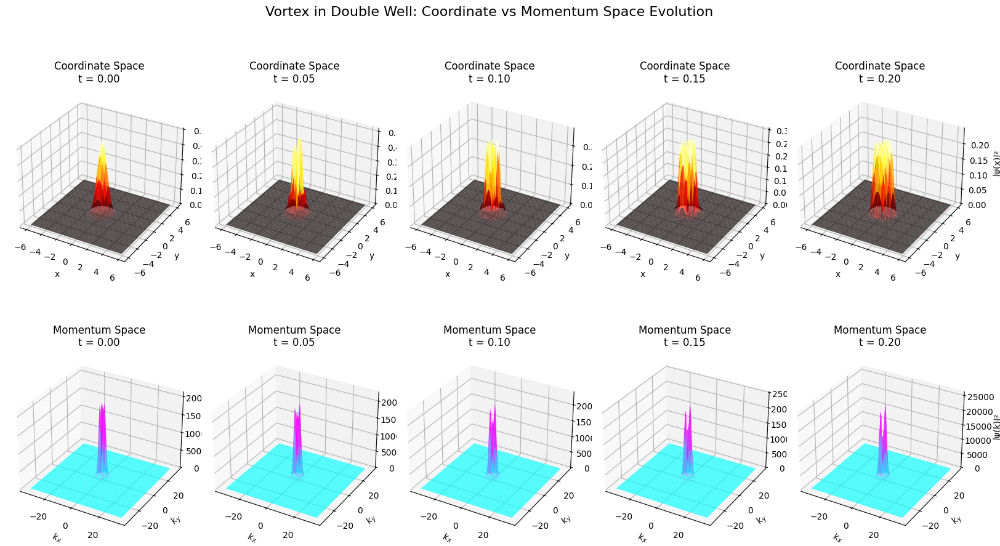

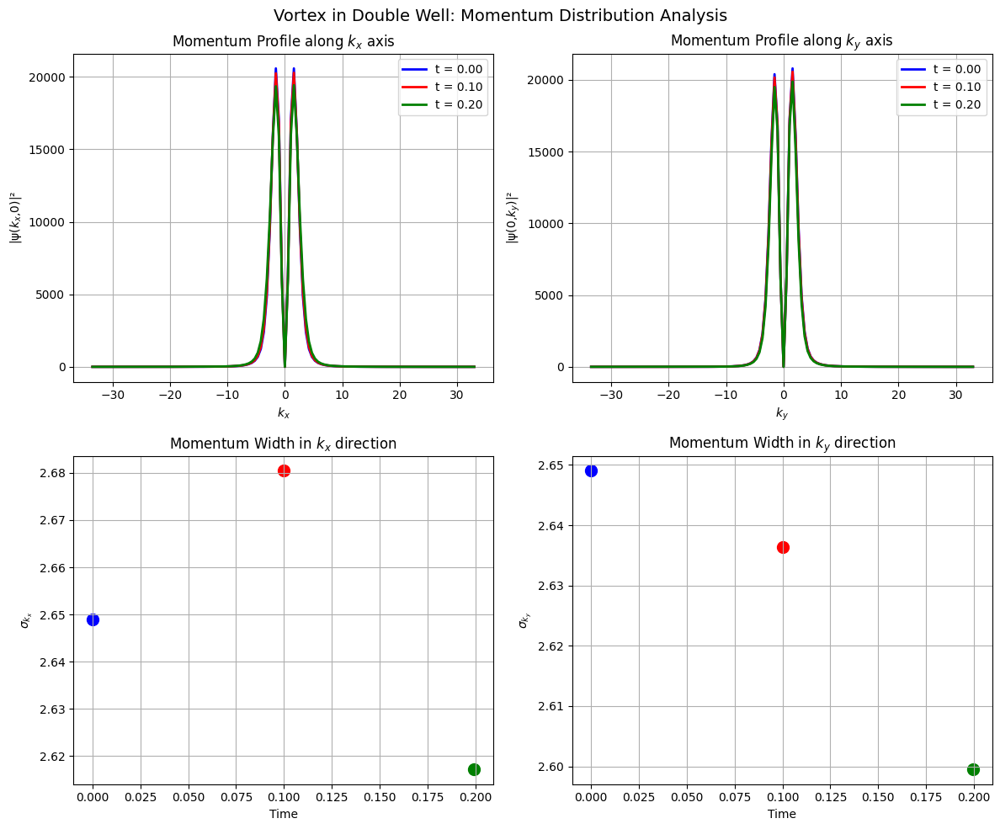

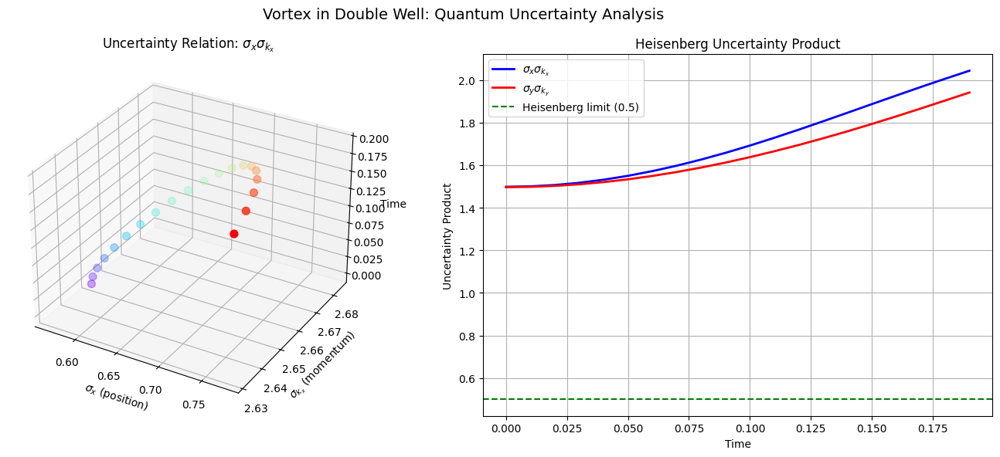

Displaying momentum space visualization for: Moving Gaussian in Infinite Well
1. 3D Momentum Space Animation:


KeyboardInterrupt: 

In [ ]:
# ============================================================================
# Momentum Space Visualization: 3D Momentum Distribution
# ============================================================================
def create_momentum_space_visualization(simulation_data, dt):
    """Create 3D momentum space visualization from wavefunction"""
    time_evolution = simulation_data['time_evolution']
    description = simulation_data['description']

    print(f"Creating momentum space visualization for: {description}")

    # --- Re-derive grid parameters based on time_evolution data ---
    Nx_sim, Ny_sim = time_evolution.shape[1], time_evolution.shape[2]

    # We need to use the Lx, Ly from when this simulation data was created
    # Based on notebook structure, this was Lx=12.0, Ly=12.0 in cell '5zohy9UaoXw0'
    original_Lx = 12.0
    original_Ly = 12.0

    x_sim = np.linspace(-original_Lx/2, original_Lx/2, Nx_sim, endpoint=False)
    y_sim = np.linspace(-original_Ly/2, original_Ly/2, Ny_sim, endpoint=False)
    X_sim, Y_sim = np.meshgrid(x_sim, y_sim, indexing='ij')
    dx_sim = x_sim[1] - x_sim[0]
    dy_sim = y_sim[1] - y_sim[0]

    # 计算动量网格 (kx, ky)
    # 动量单位: ℏ = 1 (自然单位制)
    kx_sim = 2 * np.pi * np.fft.fftfreq(Nx_sim, dx_sim)
    ky_sim = 2 * np.pi * np.fft.fftfreq(Ny_sim, dy_sim)
    KX_sim, KY_sim = np.meshgrid(kx_sim, ky_sim, indexing='ij')
    # --- End of re-derivation ---

    # 预计算所有帧的动量空间分布
    momentum_distributions = []
    for psi in time_evolution:
        # 对波函数进行傅里叶变换
        psi_k = np.fft.fftn(psi)
        # 动量空间概率分布 = |ψ(k)|²
        momentum_density = np.abs(psi_k)**2
        # 为了正确显示，需要fftshift
        momentum_density = np.fft.fftshift(momentum_density)
        momentum_distributions.append(momentum_density)

    # 获取全局最大值用于统一z轴范围
    global_max = np.max([np.max(md) for md in momentum_distributions])

    # 1. 3D动量空间动画
    fig1 = plt.figure(figsize=(12, 8))
    ax1 = fig1.add_subplot(111, projection='3d')

    # 对KX, KY进行fftshift以匹配动量密度
    KX_shift = np.fft.fftshift(KX_sim)
    KY_shift = np.fft.fftshift(KY_sim)

    momentum_density = momentum_distributions[0]
    surf1 = ax1.plot_surface(KX_shift, KY_shift, momentum_density,
                           cmap='viridis', linewidth=0,
                           antialiased=True, alpha=0.8, rstride=1, cstride=1)

    ax1.set_xlabel('$k_x$ (momentum)')
    ax1.set_ylabel('$k_y$ (momentum)')
    ax1.set_zlabel('|ψ(k)|²')
    ax1.set_title(f'{description}\n3D Momentum Space Distribution')
    ax1.set_zlim(0, global_max)
    fig1.colorbar(surf1, ax=ax1, shrink=0.6, aspect=10)

    def animate_momentum_3d(frame):
        ax1.clear()
        momentum_density = momentum_distributions[frame]

        # 限制显示范围，只显示中心区域（大多数动量分布集中在低动量区域）
        k_limit = np.max([np.max(np.abs(KX_shift)), np.max(np.abs(KY_shift))]) * 0.3
        # The mask is not used in plot_surface directly, it's for visual range

        surf1 = ax1.plot_surface(KX_shift, KY_shift, momentum_density,
                               cmap='viridis', linewidth=0,
                               antialiased=True, alpha=0.8, rstride=1, cstride=1)

        ax1.set_xlabel('$k_x$ (momentum)')
        ax1.set_ylabel('$k_y$ (momentum)')
        ax1.set_zlabel('|ψ(k)|²')
        ax1.set_title(f'{description}\n3D Momentum Space (t = {frame*dt:.2f})')
        ax1.set_xlim(-k_limit, k_limit)
        ax1.set_ylim(-k_limit, k_limit)
        ax1.set_zlim(0, global_max)
        return surf1,

    anim1 = FuncAnimation(fig1, animate_momentum_3d,
                         frames=len(momentum_distributions),
                         interval=30, blit=False, repeat=True)
    plt.close(fig1)

    # 2. 动量空间和坐标空间对比（静态关键帧）
    key_frames = [0, len(time_evolution)//4, len(time_evolution)//2,
                 3*len(time_evolution)//4, len(time_evolution)-1]

    fig2 = plt.figure(figsize=(16, 10))

    for i, frame in enumerate(key_frames):
        # 坐标空间概率密度
        ax_coord = fig2.add_subplot(2, 5, i+1, projection='3d')
        coord_density = np.abs(time_evolution[frame])**2
        surf_coord = ax_coord.plot_surface(X_sim, Y_sim, coord_density, cmap='hot',
                                          linewidth=0, antialiased=True, alpha=0.7)
        ax_coord.set_title(f'Coordinate Space\nt = {frame*dt:.2f}')
        ax_coord.set_xlabel('x')
        ax_coord.set_ylabel('y')
        ax_coord.set_zlabel('|ψ(x)|²')

        # 动量空间概率密度
        ax_momentum = fig2.add_subplot(2, 5, i+6, projection='3d')
        momentum_density = momentum_distributions[frame]
        surf_momentum = ax_momentum.plot_surface(KX_shift, KY_shift, momentum_density,
                                                cmap='cool', linewidth=0,
                                                antialiased=True, alpha=0.7)
        ax_momentum.set_title(f'Momentum Space\nt = {frame*dt:.2f}')
        ax_momentum.set_xlabel('$k_x$')
        ax_momentum.set_ylabel('$k_y$')
        ax_momentum.set_zlabel('|ψ(k)|²')

    plt.suptitle(f'{description}: Coordinate vs Momentum Space Evolution', fontsize=16)
    plt.tight_layout()
    plt.show()

    # 3. 动量分布剖面（沿kx和ky轴）
    fig3, axes = plt.subplots(2, 2, figsize=(12, 10))

    # 选择几个关键帧显示动量分布剖面
    profile_frames = [0, len(momentum_distributions)//2, len(momentum_distributions)-1]
    colors = ['b', 'r', 'g']

    for i, frame in enumerate(profile_frames):
        momentum_density = momentum_distributions[frame]

        # 沿kx轴的剖面 (ky=0)
        kx_profile = momentum_density[:, Ny_sim//2]
        axes[0, 0].plot(KX_shift[:, Ny_sim//2], kx_profile,
                       color=colors[i], linewidth=2,
                       label=f't = {frame*dt:.2f}')

        # 沿ky轴的剖面 (kx=0)
        ky_profile = momentum_density[Nx_sim//2, :]
        axes[0, 1].plot(KY_shift[Nx_sim//2, :], ky_profile,
                       color=colors[i], linewidth=2,
                       label=f't = {frame*dt:.2f}')

        # 动量分布宽度随时间变化
        kx_sigma = np.sqrt(np.sum(KX_shift**2 * momentum_density) / np.sum(momentum_density)) if np.sum(momentum_density) > 0 else 0
        ky_sigma = np.sqrt(np.sum(KY_shift**2 * momentum_density) / np.sum(momentum_density)) if np.sum(momentum_density) > 0 else 0

        axes[1, 0].scatter(frame*dt, kx_sigma, color=colors[i], s=100)
        axes[1, 1].scatter(frame*dt, ky_sigma, color=colors[i], s=100)

    axes[0, 0].set_xlabel('$k_x$')
    axes[0, 0].set_ylabel('|ψ($k_x$,0)|²')
    axes[0, 0].set_title('Momentum Profile along $k_x$ axis')
    axes[0, 0].legend()
    axes[0, 0].grid(True)

    axes[0, 1].set_xlabel('$k_y$')
    axes[0, 1].set_ylabel('|ψ(0,$k_y$)|²')
    axes[0, 1].set_title('Momentum Profile along $k_y$ axis')
    axes[0, 1].legend()
    axes[0, 1].grid(True)

    axes[1, 0].set_xlabel('Time')
    axes[1, 0].set_ylabel('$σ_{k_x}$')
    axes[1, 0].set_title('Momentum Width in $k_x$ direction')
    axes[1, 0].grid(True)

    axes[1, 1].set_xlabel('Time')
    axes[1, 1].set_ylabel('$σ_{k_y}$')
    axes[1, 1].set_title('Momentum Width in $k_y$ direction')
    axes[1, 1].grid(True)

    plt.suptitle(f'{description}: Momentum Distribution Analysis', fontsize=14)
    plt.tight_layout()
    plt.show()

    # 4. 不确定性关系可视化
    fig4 = plt.figure(figsize=(14, 6))

    # 计算位置和动量的不确定性
    position_uncertainties_x = []
    position_uncertainties_y = []
    momentum_uncertainties_x = []
    momentum_uncertainties_y = []
    times = []

    # Ensure at least some points are sampled for uncertainty
    sample_interval = max(1, len(time_evolution) // 20)
    for frame in range(0, len(time_evolution), sample_interval):
        psi = time_evolution[frame]
        times.append(frame * dt)

        # 坐标空间概率密度
        prob_density = np.abs(psi)**2

        # Calculate expectation values
        total_prob = np.sum(prob_density) * dx_sim * dy_sim
        if total_prob == 0: # Avoid division by zero for empty wavefunctions
             x_expect, y_expect = 0, 0
        else:
             x_expect = np.sum(X_sim * prob_density) * dx_sim * dy_sim / total_prob
             y_expect = np.sum(Y_sim * prob_density) * dx_sim * dy_sim / total_prob

        # 计算位置不确定性 (标准差)
        if total_prob == 0:
            sigma_x, sigma_y = 0, 0
        else:
            sigma_x = np.sqrt(np.sum((X_sim - x_expect)**2 * prob_density) * dx_sim * dy_sim / total_prob)
            sigma_y = np.sqrt(np.sum((Y_sim - y_expect)**2 * prob_density) * dx_sim * dy_sim / total_prob)

        position_uncertainties_x.append(sigma_x)
        position_uncertainties_y.append(sigma_y)

        # 动量空间概率密度
        momentum_density = momentum_distributions[frame]
        total_momentum_prob = np.sum(momentum_density)

        # 计算动量期望值
        if total_momentum_prob == 0:
            kx_expect, ky_expect = 0, 0
        else:
            kx_expect = np.sum(KX_shift * momentum_density) / total_momentum_prob
            ky_expect = np.sum(KY_shift * momentum_density) / total_momentum_prob

        # 计算动量不确定性
        if total_momentum_prob == 0:
            sigma_kx, sigma_ky = 0, 0
        else:
            sigma_kx = np.sqrt(np.sum((KX_shift - kx_expect)**2 * momentum_density) / total_momentum_prob)
            sigma_ky = np.sqrt(np.sum((KY_shift - ky_expect)**2 * momentum_density) / total_momentum_prob)

        momentum_uncertainties_x.append(sigma_kx)
        momentum_uncertainties_y.append(sigma_ky)

    # 绘制不确定性关系
    ax_uncertainty = fig4.add_subplot(121, projection='3d')
    if len(times) > 0:
        ax_uncertainty.scatter(position_uncertainties_x,
                             momentum_uncertainties_x,
                             times,
                             c=times, cmap='rainbow', s=50)
        ax_uncertainty.set_xlabel('$σ_x$ (position)')
        ax_uncertainty.set_ylabel('$σ_{k_x}$ (momentum)')
        ax_uncertainty.set_zlabel('Time')
        ax_uncertainty.set_title('Uncertainty Relation: $σ_xσ_{k_x}$')
    else:
        ax_uncertainty.set_title('No uncertainty data to plot')

    # 绘制不确定性乘积
    ax_product = fig4.add_subplot(122)
    if len(times) > 0:
        uncertainty_product_x = [px * kx for px, kx in zip(position_uncertainties_x, momentum_uncertainties_x)]
        uncertainty_product_y = [py * ky for py, ky in zip(position_uncertainties_y, momentum_uncertainties_y)]

        ax_product.plot(times, uncertainty_product_x, 'b-', linewidth=2, label='$σ_xσ_{k_x}$')
        ax_product.plot(times, uncertainty_product_y, 'r-', linewidth=2, label='$σ_yσ_{k_y}$')
        ax_product.axhline(y=0.5, color='g', linestyle='--', label='Heisenberg limit (0.5)')

        ax_product.set_xlabel('Time')
        ax_product.set_ylabel('Uncertainty Product')
        ax_product.set_title('Heisenberg Uncertainty Product')
        ax_product.legend()
        ax_product.grid(True)
    else:
        ax_product.set_title('No uncertainty data to plot')

    plt.suptitle(f'{description}: Quantum Uncertainty Analysis', fontsize=14)
    plt.tight_layout()
    plt.show()

    return {
        'momentum_3d_animation': anim1,
        'momentum_distributions': momentum_distributions,
        'KX': KX_shift,
        'KY': KY_shift,
        'description': description
    }

# 创建所有模拟的动量空间可视化
all_momentum_visualizations = []
for sim in simulations:
    # Updated call: remove X, Y arguments as they are now derived internally
    momentum_viz = create_momentum_space_visualization(sim, dt)
    all_momentum_visualizations.append(momentum_viz)

# 显示一个模拟的动量空间可视化
display_index = 0  # 可以更改这个索引来查看不同的模拟

print(f"Displaying momentum space visualization for: {all_momentum_visualizations[display_index]['description']}")
print("=" * 60)

# 显示3D动量空间动画
print("1. 3D Momentum Space Animation:")
HTML(all_momentum_visualizations[display_index]['momentum_3d_animation'].to_jshtml())

In [ ]:
try:
    import plotly.graph_objects as go
    from plotly.subplots import make_subplots

    def create_interactive_3d_visualization(simulation_data, X, Y, V, dt):
        """Create interactive 3D visualization using Plotly"""
        time_evolution = simulation_data['time_evolution']
        description = simulation_data['description']

        print(f"Creating interactive 3D visualization for: {description}")

        key_frames = [0, len(time_evolution)//4, len(time_evolution)//2,
                    3*len(time_evolution)//4, len(time_evolution)-1]

        fig = make_subplots(
            rows=2, cols=3,
            subplot_titles=[f'Time = {f*dt:.2f}' for f in key_frames],
            specs=[[{'type': 'surface'}, {'type': 'surface'}, {'type': 'surface'}],
                  [{'type': 'surface'}, {'type': 'surface'}, {'type': 'surface'}]]
        )

        for i, frame in enumerate(key_frames):
            prob_density = np.abs(time_evolution[frame])**2

            row = i // 3 + 1
            col = i % 3 + 1

            fig.add_trace(
                go.Surface(
                    x=X, y=Y, z=prob_density,
                    colorscale='Viridis',
                    showscale=True,
                    opacity=0.8,
                    contours=dict(z=dict(show=True, size=0.05))
                ),
                row=row, col=col
            )

        fig.update_layout(
            title=f"{description} - 3D Probability Density",
            height=800,
            scene=dict(
                xaxis_title='x',
                yaxis_title='y',
                zaxis_title='|ψ|²'
            )
        )

        fig.show()

        return fig
    for sim in simulations[:1]:
        interactive_fig = create_interactive_3d_visualization(
            sim, X, Y, potentials[sim['description'].split(' in ')[1]], dt
        )

except ImportError:
    print("Plotly not available. Using matplotlib only.")

Creating interactive 3D visualization for: Moving Gaussian in Infinite Well


## 7. Advanced 2D Analysis: Wave Packet Dynamics

We analyze the trajectory and behavior of the 2D wave packet:
- Calculate expectation values of position over time
- Track the center of the wave packet
- Visualize the complete trajectory within the potential

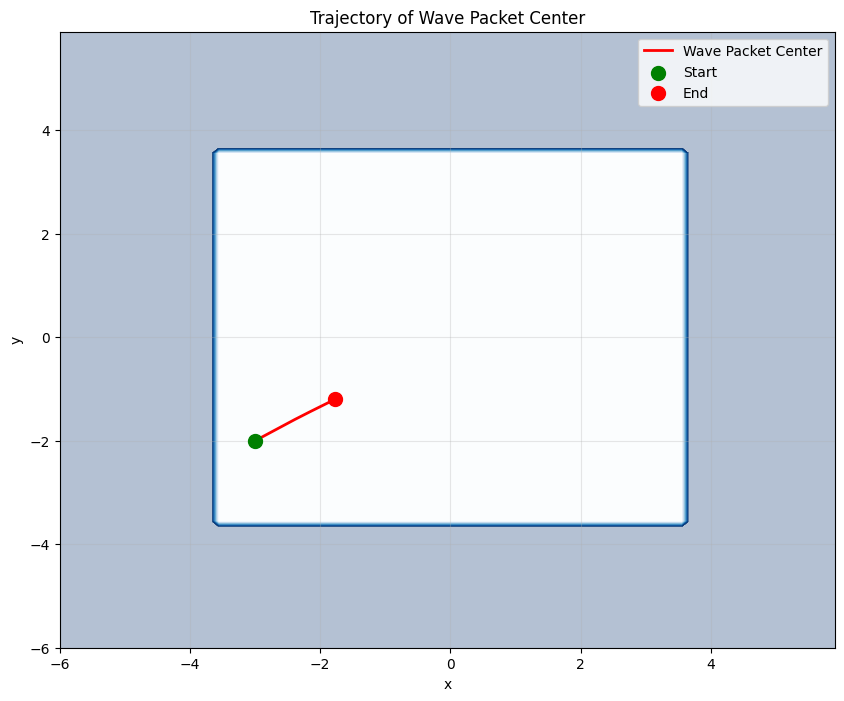

=== 2D SIMULATION SUMMARY ===
Final normalization: 1.0000000000
Wave packet traveled from (-3.00, -2.00) to (-1.78, -1.20)
Total distance: 1.46


In [ ]:
# ============================================================================
# Advanced 2D Analysis: Wave Packet Dynamics
# ============================================================================

# Calculate expectation values of position
x_expectation_2D = np.zeros(num_steps)
y_expectation_2D = np.zeros(num_steps)

for step in range(num_steps):
    prob_density = np.abs(time_evolution_2D[step])**2
    x_expectation_2D[step] = np.sum(X * prob_density) * dx * dy
    y_expectation_2D[step] = np.sum(Y * prob_density) * dx * dy

# Plot trajectory of wave packet center
plt.figure(figsize=(10, 8))
plt.contourf(X, Y, V_2D, levels=50, cmap='Blues', alpha=0.3)
plt.plot(x_expectation_2D, y_expectation_2D, 'r-', linewidth=2, label='Wave Packet Center')
plt.scatter(x_expectation_2D[0], y_expectation_2D[0], color='green', s=100, label='Start', zorder=5)
plt.scatter(x_expectation_2D[-1], y_expectation_2D[-1], color='red', s=100, label='End', zorder=5)
plt.xlabel('x')
plt.ylabel('y')
plt.title('Trajectory of Wave Packet Center')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

print("=== 2D SIMULATION SUMMARY ===")
print(f"Final normalization: {norm_history_2D[-1]:.10f}")
print(f"Wave packet traveled from ({x_expectation_2D[0]:.2f}, {y_expectation_2D[0]:.2f}) to ({x_expectation_2D[-1]:.2f}, {y_expectation_2D[-1]:.2f})")
print(f"Total distance: {np.sqrt((x_expectation_2D[-1]-x_expectation_2D[0])**2 + (y_expectation_2D[-1]-y_expectation_2D[0])**2):.2f}")

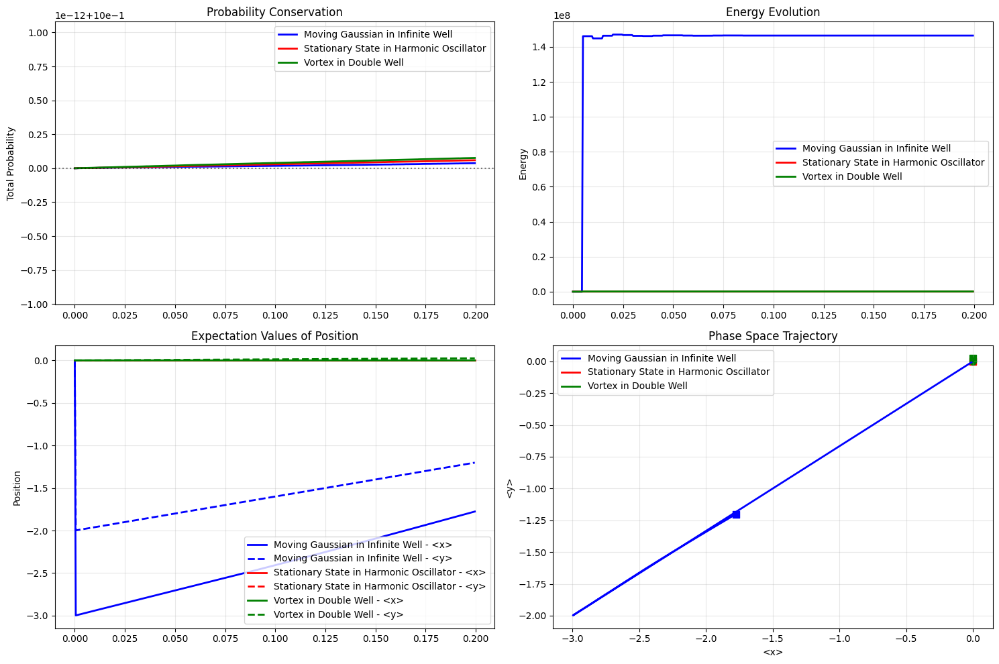

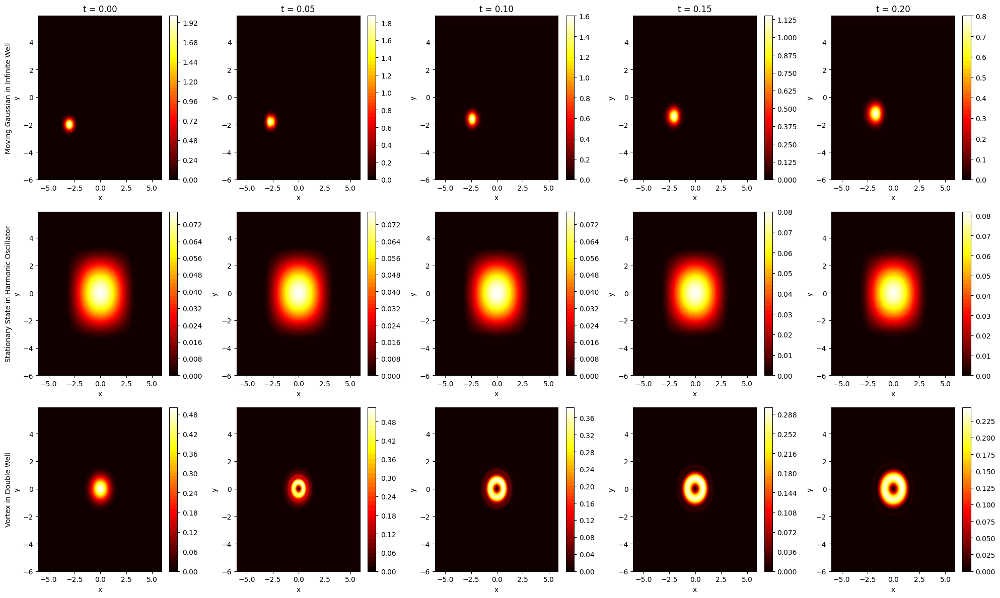

QUANTITATIVE ANALYSIS SUMMARY

Moving Gaussian in Infinite Well:
  Final normalization: 1.00000000
  Norm deviation: 3.75e-14
  Energy variation: 2.88e+05
  Total distance traveled: 2.14
  Simulation time: 0.20

Stationary State in Harmonic Oscillator:
  Final normalization: 1.00000000
  Norm deviation: 5.93e-14
  Energy variation: 2.82e+02
  Total distance traveled: 0.00
  Simulation time: 0.20

Vortex in Double Well:
  Final normalization: 1.00000000
  Norm deviation: 7.59e-14
  Energy variation: 7.88e+02
  Total distance traveled: 0.02
  Simulation time: 0.20


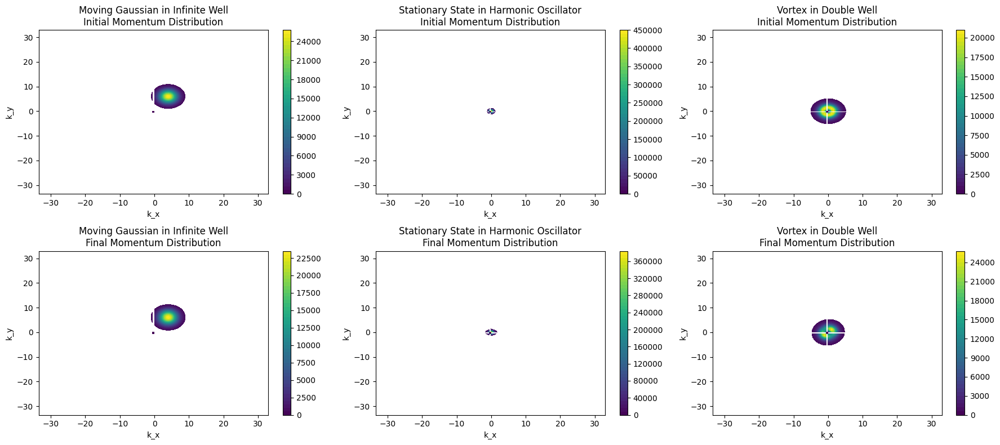

In [ ]:
# ============================================================================
# Comprehensive Analysis and Comparison
# ============================================================================
# Create time array
time_array = np.arange(num_steps) * dt

# 1. Conservation Laws Comparison
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 10))

colors = ['blue', 'red', 'green']
for idx, sim in enumerate(simulations):
    color = colors[idx]
    label = sim['description']

    # Probability conservation
    ax1.plot(time_array, sim['norm_history'], color=color, linewidth=2, label=label)

    # Energy evolution
    ax2.plot(time_array, sim['energy_history'], color=color, linewidth=2, label=label)

    # Position expectation values
    ax3.plot(time_array, sim['x_expectation'], color=color, linewidth=2,
             label=f'{label} - <x>')
    ax3.plot(time_array, sim['y_expectation'], color=color, linewidth=2,
             linestyle='--', label=f'{label} - <y>')

    # Phase space trajectory
    ax4.plot(sim['x_expectation'], sim['y_expectation'], color=color,
             linewidth=2, label=label)
    ax4.scatter(sim['x_expectation'][0], sim['y_expectation'][0],
                color=color, s=50, marker='o')
    ax4.scatter(sim['x_expectation'][-1], sim['y_expectation'][-1],
                color=color, s=50, marker='s')

# Formatting
ax1.axhline(y=1.0, color='black', linestyle=':', alpha=0.5)
ax1.set_ylabel('Total Probability')
ax1.set_title('Probability Conservation')
ax1.legend()
ax1.grid(True, alpha=0.3)

ax2.set_ylabel('Energy')
ax2.set_title('Energy Evolution')
ax2.legend()
ax2.grid(True, alpha=0.3)

ax3.set_ylabel('Position')
ax3.set_title('Expectation Values of Position')
ax3.legend()
ax3.grid(True, alpha=0.3)

ax4.set_xlabel('<x>')
ax4.set_ylabel('<y>')
ax4.set_title('Phase Space Trajectory')
ax4.legend()
ax4.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# 2. Final State Comparison
key_frames = [0, num_steps//4, num_steps//2, 3*num_steps//4, num_steps-1]
fig, axes = plt.subplots(len(simulations), len(key_frames), figsize=(20, 12))

if len(simulations) == 1:
    axes = axes.reshape(1, -1)

for row, sim in enumerate(simulations):
    for col, frame in enumerate(key_frames):
        prob_density = np.abs(sim['time_evolution'][frame])**2
        im = axes[row, col].contourf(X, Y, prob_density, levels=50, cmap='hot', linewidths=0)
        axes[row, col].set_xlabel('x')
        axes[row, col].set_ylabel('y')

        if row == 0:
            axes[row, col].set_title(f't = {frame*dt:.2f}')
        if col == 0:
            axes[row, col].set_ylabel(f"{sim['description']}\ny")

        # Add colorbar for each row
        plt.colorbar(im, ax=axes[row, col])

plt.tight_layout()
plt.show()

# 3. Quantitative Analysis Summary
print("=" * 70)
print("QUANTITATIVE ANALYSIS SUMMARY")
print("=" * 70)

for idx, sim in enumerate(simulations):
    print(f"\n{sim['description']}:")
    print(f"  Final normalization: {sim['norm_history'][-1]:.8f}")
    print(f"  Norm deviation: {np.abs(1 - sim['norm_history'][-1]):.2e}")
    print(f"  Energy variation: {np.std(sim['energy_history'][sim['energy_history'] != 0]):.2e}")
    print(f"  Total distance traveled: {np.sqrt((sim['x_expectation'][-1]-sim['x_expectation'][0])**2 + (sim['y_expectation'][-1]-sim['y_expectation'][0])**2):.2f}")
    print(f"  Simulation time: {num_steps * dt:.2f}")

# 4. Advanced Analysis: Fourier Space Analysis
fig, axes = plt.subplots(2, len(simulations), figsize=(18, 8))

if len(simulations) == 1:
    axes = axes.reshape(2, -1)

for idx, sim in enumerate(simulations):
    # Initial momentum distribution
    psi_k_initial = fftpack.fft2(sim['time_evolution'][0])
    kx_vals = fftpack.fftfreq(Nx, d=dx) * 2 * np.pi
    ky_vals = fftpack.fftfreq(Ny, d=dy) * 2 * np.pi

    # Plot initial momentum distribution
    im1 = axes[0, idx].contourf(kx_vals, ky_vals, np.abs(psi_k_initial)**2,
                                levels=50, cmap='viridis', linewidths=0)
    axes[0, idx].set_xlabel('k_x')
    axes[0, idx].set_ylabel('k_y')
    axes[0, idx].set_title(f"{sim['description']}\nInitial Momentum Distribution")
    plt.colorbar(im1, ax=axes[0, idx])

    # Final momentum distribution
    psi_k_final = fftpack.fft2(sim['time_evolution'][-1])
    im2 = axes[1, idx].contourf(kx_vals, ky_vals, np.abs(psi_k_final)**2,
                                levels=50, cmap='viridis', linewidths=0)
    axes[1, idx].set_xlabel('k_x')
    axes[1, idx].set_ylabel('k_y')
    axes[1, idx].set_title(f"{sim['description']}\nFinal Momentum Distribution")
    plt.colorbar(im2, ax=axes[1, idx])

plt.tight_layout()
plt.show()

## 2D FDTD Method Implementation

We'll implement the 2D Crank-Nicolson FDTD method for comparison with SSFM:
- Construct 2D finite difference matrices
- Solve the resulting linear systems
- Compare accuracy, stability, and performance

In [ ]:
import scipy.sparse as sp
from scipy.sparse.linalg import spsolve
import time

def setup_2d_fdtd_matrices(X, Y, dx, dy, dt, V, hbar=1.0, m=1.0):
    """Set up the matrices for 2D Crank-Nicolson FDTD method"""
    Nx, Ny = X.shape
    N_total = Nx * Ny

    # Coefficients for finite difference
    alpha_x = -1j * hbar * dt / (4 * m * dx**2)
    alpha_y = -1j * hbar * dt / (4 * m * dy**2)
    beta = 1j * dt / (2 * hbar)

    # Initialize sparse matrices in CSR format for efficiency
    A_data = []
    A_row = []
    A_col = []

    B_data = []
    B_row = []
    B_col = []

    print("Constructing 2D FDTD matrices...")

    for i in range(Nx):
        for j in range(Ny):
            idx = i * Ny + j  # Flattened index

            # Diagonal elements
            A_data.append(1 + 2*alpha_x + 2*alpha_y + beta * V[i, j])
            A_row.append(idx)
            A_col.append(idx)

            B_data.append(1 - 2*alpha_x - 2*alpha_y - beta * V[i, j])
            B_row.append(idx)
            B_col.append(idx)

            # x-direction neighbors
            if i > 0:
                A_data.append(-alpha_x)
                A_row.append(idx)
                A_col.append((i-1) * Ny + j)

                B_data.append(alpha_x)
                B_row.append(idx)
                B_col.append((i-1) * Ny + j)

            if i < Nx - 1:
                A_data.append(-alpha_x)
                A_row.append(idx)
                A_col.append((i+1) * Ny + j)

                B_data.append(alpha_x)
                B_row.append(idx)
                B_col.append((i+1) * Ny + j)

            # y-direction neighbors
            if j > 0:
                A_data.append(-alpha_y)
                A_row.append(idx)
                A_col.append(i * Ny + (j-1))

                B_data.append(alpha_y)
                B_row.append(idx)
                B_col.append(i * Ny + (j-1))

            if j < Ny - 1:
                A_data.append(-alpha_y)
                A_row.append(idx)
                A_col.append(i * Ny + (j+1))

                B_data.append(alpha_y)
                B_row.append(idx)
                B_col.append(i * Ny + (j+1))

    # Create sparse matrices
    A_mat = sp.csr_matrix((A_data, (A_row, A_col)), shape=(N_total, N_total))
    B_mat = sp.csr_matrix((B_data, (B_row, B_col)), shape=(N_total, N_total))

    print("2D FDTD matrices constructed")
    return A_mat, B_mat

def run_2d_fdtd_simulation(psi_initial, A_mat, B_mat, num_steps, description=""):
    """Run 2D FDTD simulation"""
    print(f"Starting 2D FDTD simulation: {description}")

    Nx, Ny = psi_initial.shape
    N_total = Nx * Ny

    # Initialize arrays
    time_evolution = np.zeros((num_steps, Nx, Ny), dtype=np.complex128)
    time_evolution[0] = psi_initial

    # Observables tracking
    norm_history = np.zeros(num_steps)
    computation_times = np.zeros(num_steps)

    norm_history[0] = np.sum(np.abs(psi_initial)**2) * dx * dy

    psi_current = psi_initial.copy().flatten()

    for step in range(1, num_steps):
        start_time = time.time()

        # Right-hand side vector
        b = B_mat @ psi_current

        # Solve linear system
        psi_next = spsolve(A_mat, b)

        computation_times[step] = time.time() - start_time

        # Reshape back to 2D
        psi_current = psi_next
        psi_2d = psi_current.reshape((Nx, Ny))
        time_evolution[step] = psi_2d

        # Calculate norm
        norm_history[step] = np.sum(np.abs(psi_2d)**2) * dx * dy

        if step % 20 == 0:
            avg_time = np.mean(computation_times[1:step+1])
            print(f"  FDTD Step {step:4d}/{num_steps}, Norm = {norm_history[step]:.8f}, "
                  f"Avg time/step = {avg_time:.4f}s")

    total_time = np.sum(computation_times)
    print(f"FDTD simulation completed: {description}")
    print(f"  Total computation time: {total_time:.2f}s")
    print(f"  Average time per step: {total_time/num_steps:.4f}s")

    return {
        'time_evolution': time_evolution,
        'norm_history': norm_history,
        'computation_times': computation_times,
        'description': description + " (FDTD)",
        'total_time': total_time
    }

In [ ]:
# ============================================================================
# Enhanced 2D SSFM with Timing
# ============================================================================
def run_2d_ssfm_simulation(psi_initial, V, dt, num_steps, description=""):
    """Run 2D SSFM simulation with timing"""
    print(f"Starting 2D SSFM simulation: {description}")

    # Pre-calculate operators
    T_exp_2D = np.exp(-1j * (hbar * (KX**2 + KY**2) / (2 * m)) * dt / hbar)
    V_exp_half_2D = np.exp(-1j * V * dt / (2 * hbar))

    # Initialize arrays
    time_evolution = np.zeros((num_steps, Nx, Ny), dtype=np.complex128)
    time_evolution[0] = psi_initial

    # Enhanced observables tracking
    norm_history = np.zeros(num_steps)
    computation_times = np.zeros(num_steps)

    norm_history[0] = np.sum(np.abs(psi_initial)**2) * dx * dy

    psi_current = psi_initial.copy()

    for step in range(1, num_steps):
        start_time = time.time()

        # SSFM steps
        psi_current = psi_current * V_exp_half_2D
        psi_k_2D = fftpack.fft2(psi_current)
        psi_k_2D = psi_k_2D * T_exp_2D
        psi_current = fftpack.ifft2(psi_k_2D)
        psi_current = psi_current * V_exp_half_2D

        computation_times[step] = time.time() - start_time

        time_evolution[step] = psi_current

        # Calculate norm
        norm_history[step] = np.sum(np.abs(psi_current)**2) * dx * dy

        if step % 50 == 0:
            avg_time = np.mean(computation_times[1:step+1])
            print(f"  SSFM Step {step:4d}/{num_steps}, Norm = {norm_history[step]:.8f}, "
                  f"Avg time/step = {avg_time:.4f}s")

    total_time = np.sum(computation_times)
    print(f"SSFM simulation completed: {description}")
    print(f"  Total computation time: {total_time:.2f}s")
    print(f"  Average time per step: {total_time/num_steps:.4f}s")

    return {
        'time_evolution': time_evolution,
        'norm_history': norm_history,
        'computation_times': computation_times,
        'description': description + " (SSFM)",
        'total_time': total_time
    }

In [ ]:
# ============================================================================
# Run Both Methods for Comparison
# ============================================================================
# Use smaller grid for FDTD due to computational constraints
print("Setting up comparison simulations...")

# Select one configuration for detailed comparison
test_potential = potentials["Infinite Well"]
test_initial_wave = initial_wavefunctions["Moving Gaussian"]

# Reduce steps for demonstration
comparison_steps = 100

print("=" * 70)
print("RUNNING METHOD COMPARISON")
print("=" * 70)

# Run SSFM
ssfm_result = run_2d_ssfm_simulation(
    test_initial_wave,
    test_potential,
    dt, comparison_steps,
    "Moving Gaussian in Infinite Well"
)

# Set up and run FDTD (this will take longer)
print("\n" + "=" * 70)
A_mat, B_mat = setup_2d_fdtd_matrices(X, Y, dx, dy, dt, test_potential)

fdtd_result = run_2d_fdtd_simulation(
    test_initial_wave,
    A_mat, B_mat,
    comparison_steps,
    "Moving Gaussian in Infinite Well"
)

# Store results for comparison
comparison_results = {
    'ssfm': ssfm_result,
    'fdtd': fdtd_result
}

Setting up comparison simulations...
RUNNING METHOD COMPARISON
Starting 2D SSFM simulation: Moving Gaussian in Infinite Well
  SSFM Step   50/100, Norm = 1.00000000, Avg time/step = 0.0006s
SSFM simulation completed: Moving Gaussian in Infinite Well
  Total computation time: 0.06s
  Average time per step: 0.0006s

Constructing 2D FDTD matrices...
2D FDTD matrices constructed
Starting 2D FDTD simulation: Moving Gaussian in Infinite Well
  FDTD Step   20/100, Norm = 1.00000000, Avg time/step = 0.4030s
  FDTD Step   40/100, Norm = 1.00000000, Avg time/step = 0.4594s
  FDTD Step   60/100, Norm = 1.00000000, Avg time/step = 0.4958s
  FDTD Step   80/100, Norm = 1.00000000, Avg time/step = 0.5029s
FDTD simulation completed: Moving Gaussian in Infinite Well
  Total computation time: 47.75s
  Average time per step: 0.4775s


In [ ]:
# ============================================================================
# Comprehensive 2D Method Comparison
# ============================================================================
print("=" * 70)
print("2D METHOD COMPARISON ANALYSIS")
print("=" * 70)

# Create time array for comparison plots
time_array_comp = np.arange(comparison_steps) * dt

# 1. Side-by-Side Animation Comparison
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# SSFM plot
prob_density_ssfm = np.abs(ssfm_result['time_evolution'][0])**2
im1 = ax1.contourf(X, Y, prob_density_ssfm, levels=50, cmap='hot')
ax1.contour(X, Y, test_potential, levels=10, colors='white', alpha=0.3)
ax1.set_xlabel('x')
ax1.set_ylabel('y')
ax1.set_title('SSFM Method - Probability Density')
plt.colorbar(im1, ax=ax1)

# FDTD plot
prob_density_fdtd = np.abs(fdtd_result['time_evolution'][0])**2
im2 = ax2.contourf(X, Y, prob_density_fdtd, levels=50, cmap='hot')
ax2.contour(X, Y, test_potential, levels=10, colors='white', alpha=0.3)
ax2.set_xlabel('x')
ax2.set_ylabel('y')
ax2.set_title('FDTD Method - Probability Density')
plt.colorbar(im2, ax=ax2)

def animate_comparison(frame):
    # Clear and update SSFM
    ax1.clear()
    prob_density_ssfm = np.abs(ssfm_result['time_evolution'][frame])**2
    im1 = ax1.contourf(X, Y, prob_density_ssfm, levels=50, cmap='hot')
    ax1.contour(X, Y, test_potential, levels=10, colors='white', alpha=0.3)
    ax1.set_xlabel('x')
    ax1.set_ylabel('y')
    ax1.set_title(f'SSFM (t = {frame*dt:.2f})')

    # Clear and update FDTD
    ax2.clear()
    prob_density_fdtd = np.abs(fdtd_result['time_evolution'][frame])**2
    im2 = ax2.contourf(X, Y, prob_density_fdtd, levels=50, cmap='hot')
    ax2.contour(X, Y, test_potential, levels=10, colors='white', alpha=0.3)
    ax2.set_xlabel('x')
    ax2.set_ylabel('y')
    ax2.set_title(f'FDTD (t = {frame*dt:.2f})')

    return im1, im2

anim_compare = FuncAnimation(fig, animate_comparison, frames=comparison_steps,
                           interval=50, blit=False, repeat=True)

plt.tight_layout()
plt.close(fig)
print("Comparison animation created")
HTML(anim_compare.to_jshtml())

2D METHOD COMPARISON ANALYSIS
Comparison animation created


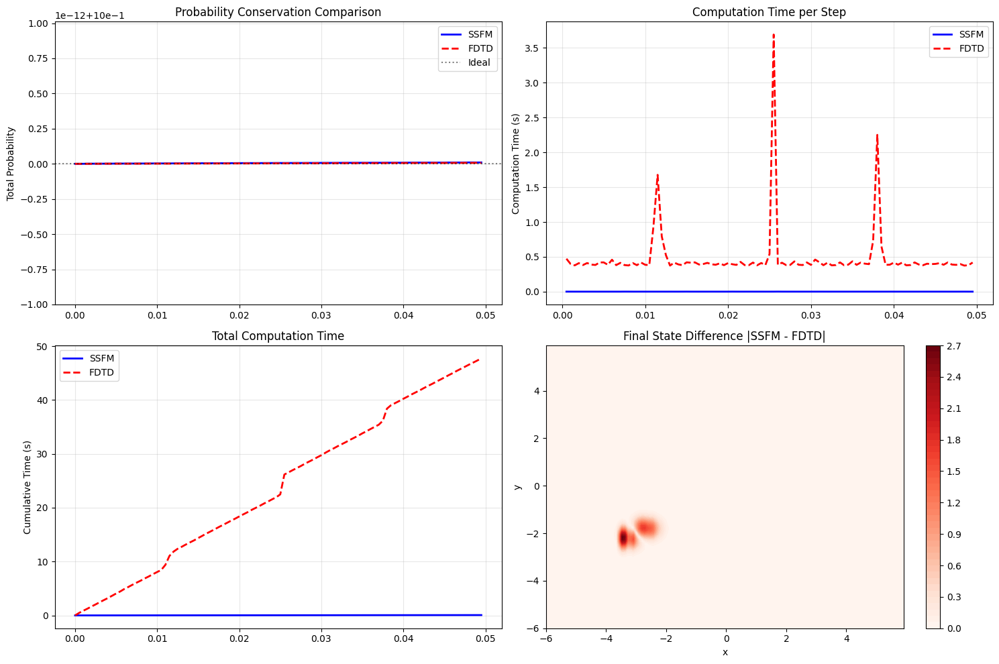


2D METHOD COMPARISON SUMMARY

SSFM Performance:
  Total computation time: 0.06 s
  Average time per step: 0.0006 s
  Final norm: 1.00000000
  Norm deviation: 9.99e-15

FDTD Performance:
  Total computation time: 47.75 s
  Average time per step: 0.4775 s
  Final norm: 1.00000000
  Norm deviation: 6.88e-15

Comparison Metrics:
  average_density_difference    : 6.096487e-03
  maximum_density_difference    : 1.083297e-02
  final_state_correlation       : 4.571745e-01
  overall_correlation           : 7.820746e-01
  rms_difference                : 5.463399e-02

Speed Ratio (FDTD/SSFM): 774.4x
min = 0.0 max = 2.683284449232465


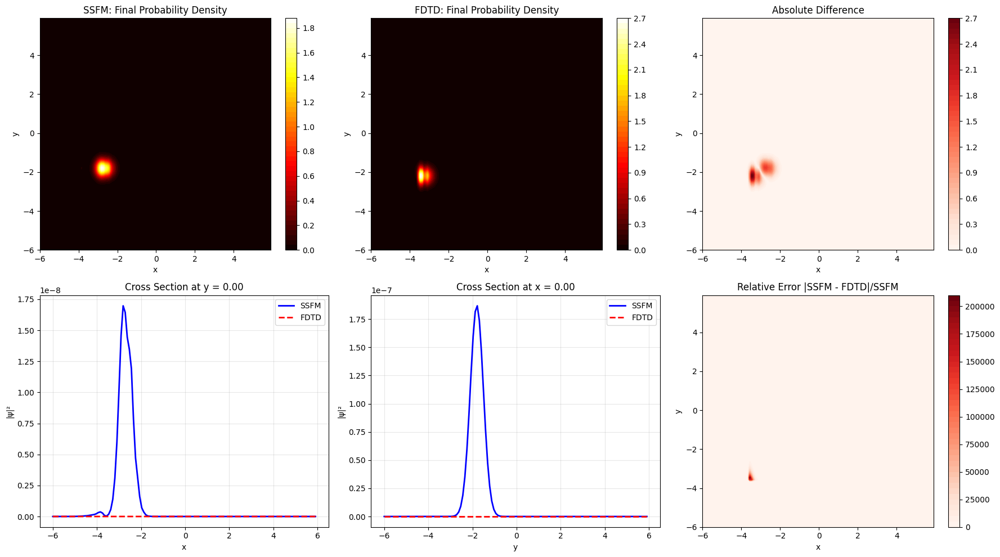

In [ ]:
# 2. Quantitative Comparison Metrics
def calculate_2d_comparison_metrics(ssfm_data, fdtd_data, time_array, dx, dy):
    """Calculate quantitative comparison metrics between 2D SSFM and FDTD"""

    # Average probability density difference over space and time
    density_diffs = []
    for t in range(len(time_array)):
        diff = np.abs(np.abs(ssfm_data[t])**2 - np.abs(fdtd_data[t])**2)
        density_diffs.append(np.mean(diff))

    avg_density_diff = np.mean(density_diffs)
    max_density_diff = np.max(density_diffs)

    # Correlation between final states
    final_ssfm = np.abs(ssfm_data[-1]).flatten()
    final_fdtd = np.abs(fdtd_data[-1]).flatten()
    final_correlation = np.corrcoef(final_ssfm, final_fdtd)[0, 1]

    # Overall correlation
    all_ssfm = np.abs(ssfm_data).flatten()
    all_fdtd = np.abs(fdtd_data).flatten()
    overall_correlation = np.corrcoef(all_ssfm, all_fdtd)[0, 1]

    metrics = {
        'average_density_difference': avg_density_diff,
        'maximum_density_difference': max_density_diff,
        'final_state_correlation': final_correlation,
        'overall_correlation': overall_correlation,
        'rms_difference': np.sqrt(np.mean((all_ssfm - all_fdtd)**2))
    }

    return metrics

# Calculate comparison metrics
comparison_metrics = calculate_2d_comparison_metrics(
    ssfm_result['time_evolution'],
    fdtd_result['time_evolution'],
    time_array_comp, dx, dy
)

# 3. Comprehensive Comparison Plots
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 10))

# Plot 1: Norm conservation comparison
ax1.plot(time_array_comp, ssfm_result['norm_history'], 'b-',
         linewidth=2, label='SSFM')
ax1.plot(time_array_comp, fdtd_result['norm_history'], 'r--',
         linewidth=2, label='FDTD')
ax1.axhline(y=1.0, color='k', linestyle=':', alpha=0.5, label='Ideal')
ax1.set_ylabel('Total Probability')
ax1.set_title('Probability Conservation Comparison')
ax1.legend()
ax1.grid(True, alpha=0.3)

# Plot 2: Computation time per step
ssfm_times = ssfm_result['computation_times'][1:]
fdtd_times = fdtd_result['computation_times'][1:]
ax2.plot(time_array_comp[1:], ssfm_times, 'b-', linewidth=2, label='SSFM')
ax2.plot(time_array_comp[1:], fdtd_times, 'r--', linewidth=2, label='FDTD')
ax2.set_ylabel('Computation Time (s)')
ax2.set_title('Computation Time per Step')
ax2.legend()
ax2.grid(True, alpha=0.3)

# Plot 3: Cumulative computation time
ax3.plot(time_array_comp, np.cumsum(ssfm_result['computation_times']),
         'b-', linewidth=2, label='SSFM')
ax3.plot(time_array_comp, np.cumsum(fdtd_result['computation_times']),
         'r--', linewidth=2, label='FDTD')
ax3.set_ylabel('Cumulative Time (s)')
ax3.set_title('Total Computation Time')
ax3.legend()
ax3.grid(True, alpha=0.3)

# Plot 4: Difference in probability density at final time
final_diff = np.abs(np.abs(ssfm_result['time_evolution'][-1])**2 -
                   np.abs(fdtd_result['time_evolution'][-1])**2)
im = ax4.contourf(X, Y, final_diff, levels=50, cmap='Reds')
ax4.set_xlabel('x')
ax4.set_ylabel('y')
ax4.set_title('Final State Difference |SSFM - FDTD|')
plt.colorbar(im, ax=ax4)

plt.tight_layout()
plt.show()

# 4. Performance and Accuracy Summary
print("\n" + "=" * 70)
print("2D METHOD COMPARISON SUMMARY")
print("=" * 70)

print(f"\nSSFM Performance:")
print(f"  Total computation time: {ssfm_result['total_time']:.2f} s")
print(f"  Average time per step: {ssfm_result['total_time']/comparison_steps:.4f} s")
print(f"  Final norm: {ssfm_result['norm_history'][-1]:.8f}")
print(f"  Norm deviation: {np.abs(1 - ssfm_result['norm_history'][-1]):.2e}")

print(f"\nFDTD Performance:")
print(f"  Total computation time: {fdtd_result['total_time']:.2f} s")
print(f"  Average time per step: {fdtd_result['total_time']/comparison_steps:.4f} s")
print(f"  Final norm: {fdtd_result['norm_history'][-1]:.8f}")
print(f"  Norm deviation: {np.abs(1 - fdtd_result['norm_history'][-1]):.2e}")

print(f"\nComparison Metrics:")
for key, value in comparison_metrics.items():
    print(f"  {key:30}: {value:.6e}")

print(f"\nSpeed Ratio (FDTD/SSFM): {fdtd_result['total_time']/ssfm_result['total_time']:.1f}x")

# 5. Final State Detailed Comparison
final_frame = comparison_steps - 1

fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# SSFM final state
prob_ssfm = np.abs(ssfm_result['time_evolution'][final_frame])**2
im1 = axes[0, 0].contourf(X, Y, prob_ssfm, levels=50, cmap='hot')
axes[0, 0].set_title('SSFM: Final Probability Density')
axes[0, 0].set_xlabel('x')
axes[0, 0].set_ylabel('y')
plt.colorbar(im1, ax=axes[0, 0])

# FDTD final state
prob_fdtd = np.abs(fdtd_result['time_evolution'][final_frame])**2
im2 = axes[0, 1].contourf(X, Y, prob_fdtd, levels=50, cmap='hot')
axes[0, 1].set_title('FDTD: Final Probability Density')
axes[0, 1].set_xlabel('x')
axes[0, 1].set_ylabel('y')
plt.colorbar(im2, ax=axes[0, 1])

# Difference
im3 = axes[0, 2].contourf(X, Y, np.abs(prob_ssfm - prob_fdtd), levels=50, cmap='Reds')
axes[0, 2].set_title('Absolute Difference')
axes[0, 2].set_xlabel('x')
axes[0, 2].set_ylabel('y')
plt.colorbar(im3, ax=axes[0, 2])

# Cross sections
middle_x = Nx // 2
middle_y = Ny // 2

# x-cross section at middle y
axes[1, 0].plot(x, prob_ssfm[:, middle_y], 'b-', label='SSFM', linewidth=2)
axes[1, 0].plot(x, prob_fdtd[:, middle_y], 'r--', label='FDTD', linewidth=2)
axes[1, 0].set_xlabel('x')
axes[1, 0].set_ylabel('|ψ|²')
axes[1, 0].set_title(f'Cross Section at y = {y[middle_y]:.2f}')
axes[1, 0].legend()
axes[1, 0].grid(True, alpha=0.3)

# y-cross section at middle x
axes[1, 1].plot(y, prob_ssfm[middle_x, :], 'b-', label='SSFM', linewidth=2)
axes[1, 1].plot(y, prob_fdtd[middle_x, :], 'r--', label='FDTD', linewidth=2)
axes[1, 1].set_xlabel('y')
axes[1, 1].set_ylabel('|ψ|²')
axes[1, 1].set_title(f'Cross Section at x = {x[middle_x]:.2f}')
axes[1, 1].legend()
axes[1, 1].grid(True, alpha=0.3)

# Relative error
relative_error = np.abs(prob_ssfm - prob_fdtd) / (prob_ssfm + 1e-10)
im4 = axes[1, 2].contourf(X, Y, relative_error, levels=50, cmap='Reds')
axes[1, 2].set_title('Relative Error |SSFM - FDTD|/SSFM')
axes[1, 2].set_xlabel('x')
axes[1, 2].set_ylabel('y')
plt.colorbar(im4, ax=axes[1, 2])
prob_fdtd = np.abs(fdtd_result['time_evolution'][-1])**2
print("min =", prob_fdtd.min(), "max =", prob_fdtd.max())

plt.tight_layout()
plt.show()

In [ ]:
# ============================================================================
# Absolute Difference Animation
# ============================================================================

# Create time array for comparison plots
time_array_comp = np.arange(comparison_steps) * dt

# 1. Animation of Absolute Difference
fig, ax = plt.subplots(figsize=(6, 4))

# Plot

prob_ssfm = np.abs(ssfm_result['time_evolution'][0])**2
prob_fdtd = np.abs(fdtd_result['time_evolution'][0])**2

abs_difference = np.abs(prob_ssfm - prob_fdtd)
im = ax.contourf(X, Y, abs_difference, levels=50, cmap='Reds')
ax.set_title('Absolute Difference')
ax.set_xlabel('x')
ax.set_ylabel('y')
plt.colorbar(im, ax=ax)

def animate_comparison(frame):
    # Clear and update SSFM
    ax.clear()
    prob_ssfm = np.abs(ssfm_result['time_evolution'][frame])**2
    prob_fdtd = np.abs(fdtd_result['time_evolution'][frame])**2
    abs_difference = np.abs(prob_ssfm - prob_fdtd)

    im = ax.contourf(X, Y, abs_difference, levels=50, cmap='Reds')
    # ax.contour(X, Y, test_potential, levels=10, colors='white', alpha=0.3)
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_title(f'Absolute Difference (t = {frame*dt:.2f})')

    return im

anim_compare = FuncAnimation(fig, animate_comparison, frames=comparison_steps,
                           interval=50, blit=False, repeat=True)

plt.tight_layout()
plt.close(fig)
print("Animation created")
HTML(anim_compare.to_jshtml())


Animation created


## 1. Gross-Pitaevskii Equation (GPE) Theoretical Foundation

The Gross-Pitaevskii equation describes Bose-Einstein condensates (BEC) using a nonlinear Schrödinger equation:

$$
i\hbar \frac{\partial \psi}{\partial t} = \left[ -\frac{\hbar^2}{2m} \nabla^2 + V(\mathbf{r}) + g |\psi|^2 \right] \psi
$$

Where the nonlinear term $g |\psi|^2$ represents atomic interactions:
- $g > 0$: Repulsive interactions
- $g < 0$: Attractive interactions

This nonlinearity enables rich dynamical behaviors, including **limit cycles**.

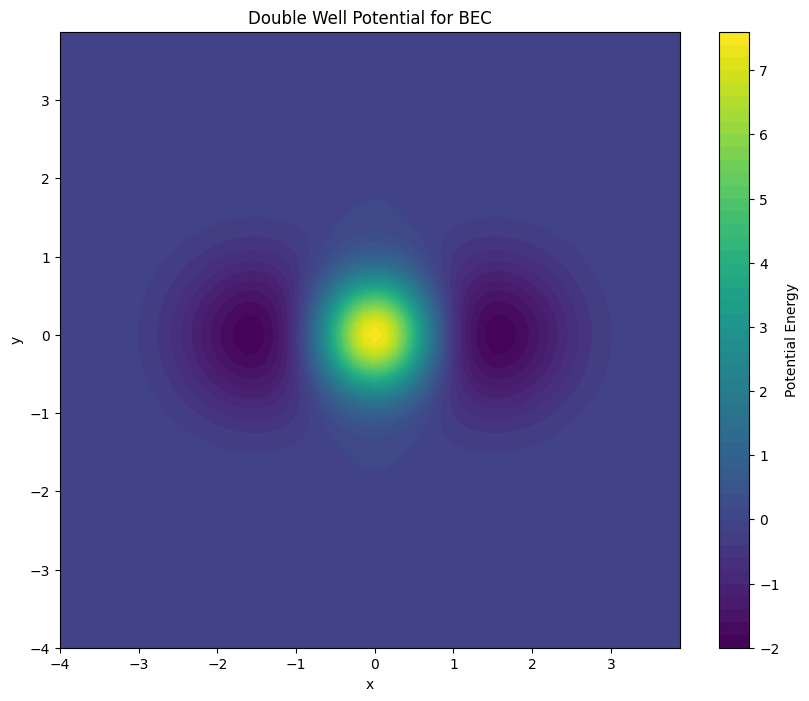

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from scipy import fftpack
import warnings
warnings.filterwarnings('ignore')

# ============================================================================
# Nonlinear System Parameters
# ============================================================================
hbar = 1.0
m = 1.0

# Grid parameters - using smaller grid for nonlinear stability
Nx, Ny = 64, 64
Lx, Ly = 8.0, 8.0

x = np.linspace(-Lx/2, Lx/2, Nx, endpoint=False)
y = np.linspace(-Ly/2, Ly/2, Ny, endpoint=False)
X, Y = np.meshgrid(x, y, indexing='ij')
dx = x[1] - x[0]
dy = y[1] - y[0]

# Momentum space grid
kx = 2 * np.pi * fftpack.fftfreq(Nx, d=dx)
ky = 2 * np.pi * fftpack.fftfreq(Ny, d=dy)
KX, KY = np.meshgrid(kx, ky, indexing='ij')

# Time parameters - smaller timestep for nonlinear stability
dt = 0.0005
num_steps = 800

# ============================================================================
# Double Well Potential - Key for Limit Cycles
# ============================================================================
def create_double_well_potential(X, Y, separation=2.0, barrier_height=5.0, well_depth=-2.0):
    """Create double-well potential"""
    # Two Gaussian wells + Gaussian barrier
    x_center_left = -separation/2
    x_center_right = separation/2

    # Left and right wells
    V_wells = (well_depth * np.exp(-((X - x_center_left)**2 + Y**2) / 1.0) +
               well_depth * np.exp(-((X - x_center_right)**2 + Y**2) / 1.0))

    # Central barrier
    V_barrier = barrier_height * np.exp(-(X**2 + Y**2) / 0.5)

    return V_wells + V_barrier

# Create double well potential
V_double_well = create_double_well_potential(X, Y, separation=3.0, barrier_height=8.0)

plt.figure(figsize=(10, 8))
plt.contourf(X, Y, V_double_well, levels=50, cmap='viridis')
plt.colorbar(label='Potential Energy')
plt.xlabel('x')
plt.ylabel('y')
plt.title('Double Well Potential for BEC')
plt.show()

In [ ]:
# ============================================================================
# Nonlinear SSFM Solver (Gross-Pitaevskii Equation)
# ============================================================================
def run_gpe_simulation(psi_initial, V, g_values, dt, num_steps, description=""):
    """Run GPE simulation scanning different nonlinear strengths g"""

    simulations = []

    for g in g_values:
        print(f"Running GPE simulation with g = {g:.2f}")

        # Precompute linear operators
        T_exp_2D = np.exp(-1j * (hbar * (KX**2 + KY**2) / (2 * m)) * dt / hbar)
        V_exp_half_2D = np.exp(-1j * V * dt / (2 * hbar))

        # Initialize
        time_evolution = np.zeros((num_steps, Nx, Ny), dtype=np.complex128)
        time_evolution[0] = psi_initial

        # Collective variables tracking
        population_imbalance = np.zeros(num_steps)  # z = (N_L - N_R)/(N_L + N_R)
        relative_phase = np.zeros(num_steps)        # φ = arg(ψ_L) - arg(ψ_R)
        total_energy = np.zeros(num_steps)

        psi_current = psi_initial.copy()

        for step in range(1, num_steps):
            # --- Nonlinear SSFM steps ---
            # 1. Nonlinear + potential half-step
            nonlinear_phase = np.exp(-1j * g * np.abs(psi_current)**2 * dt / (2 * hbar))
            psi_current = psi_current * V_exp_half_2D * nonlinear_phase

            # 2. Kinetic full step
            psi_k = fftpack.fft2(psi_current)
            psi_k = psi_k * T_exp_2D
            psi_current = fftpack.ifft2(psi_k)

            # 3. Nonlinear + potential half-step
            nonlinear_phase = np.exp(-1j * g * np.abs(psi_current)**2 * dt / (2 * hbar))
            psi_current = psi_current * V_exp_half_2D * nonlinear_phase

            time_evolution[step] = psi_current

            # Calculate collective variables
            # Define left/right regions (boundary at x=0)
            left_mask = X < 0
            right_mask = X >= 0

            # Left/right populations
            prob_density = np.abs(psi_current)**2
            N_left = np.sum(prob_density[left_mask]) * dx * dy
            N_right = np.sum(prob_density[right_mask]) * dx * dy
            population_imbalance[step] = (N_left - N_right) / (N_left + N_right)

            # Relative phase (using regional average wavefunctions)
            psi_left_avg = np.mean(psi_current[left_mask])
            psi_right_avg = np.mean(psi_current[right_mask])
            relative_phase[step] = np.angle(psi_left_avg) - np.angle(psi_right_avg)

            # Ensure relative phase in [-π, π] range
            while relative_phase[step] > np.pi:
                relative_phase[step] -= 2 * np.pi
            while relative_phase[step] < -np.pi:
                relative_phase[step] += 2 * np.pi

            # Calculate energy
            if step % 10 == 0:
                # Kinetic energy
                psi_k = fftpack.fft2(psi_current)
                kinetic_energy = np.sum(hbar**2 * (KX**2 + KY**2) / (2 * m) *
                                      np.abs(psi_k)**2) * (kx[1]-kx[0]) * (ky[1]-ky[0]) / (2*np.pi)**2
                # Potential energy
                potential_energy = np.sum(V * prob_density) * dx * dy
                # Interaction energy
                interaction_energy = 0.5 * g * np.sum(prob_density**2) * dx * dy

                total_energy[step] = kinetic_energy + potential_energy + interaction_energy
            else:
                total_energy[step] = total_energy[step-1]

        simulations.append({
            'g': g,
            'time_evolution': time_evolution,
            'population_imbalance': population_imbalance,
            'relative_phase': relative_phase,
            'total_energy': total_energy,
            'description': f"{description} (g={g:.1f})"
        })

        print(f"  Completed: g = {g:.2f}, Final z = {population_imbalance[-1]:.3f}")

    return simulations

# ============================================================================
# Initial Condition: Left-biased Gaussian Wavepacket
# ============================================================================
def create_biased_gaussian(X, Y, x0=-1.0, y0=0.0, sigma=0.5, kx0=0.0, ky0=0.0):
    """Create left-biased Gaussian wavepacket"""
    psi = (np.exp(-((X - x0)**2 + (Y - y0)**2) / (2 * sigma**2)) *
           np.exp(1j * (kx0 * X + ky0 * Y)))

    # Normalize
    norm = np.sqrt(np.sum(np.abs(psi)**2) * dx * dy)
    return psi / norm

# Create initial wavefunction (left-biased)
psi_initial_biased = create_biased_gaussian(X, Y, x0=-1.5, sigma=0.4)

# Scan nonlinear strength parameter
g_values = [0.0, 1.0, 5.0, 10.0, 20.0, 50.0]  # From linear to strongly nonlinear

print("Starting GPE simulations with different nonlinear strengths...")
gpe_simulations = run_gpe_simulation(
    psi_initial_biased,
    V_double_well,
    g_values,
    dt, num_steps,
    "BEC in Double Well"
)

Starting GPE simulations with different nonlinear strengths...
Running GPE simulation with g = 0.00
  Completed: g = 0.00, Final z = 0.985
Running GPE simulation with g = 1.00
  Completed: g = 1.00, Final z = 0.977
Running GPE simulation with g = 5.00
  Completed: g = 5.00, Final z = 0.930
Running GPE simulation with g = 10.00
  Completed: g = 10.00, Final z = 0.853
Running GPE simulation with g = 20.00
  Completed: g = 20.00, Final z = 0.690
Running GPE simulation with g = 50.00
  Completed: g = 50.00, Final z = 0.330


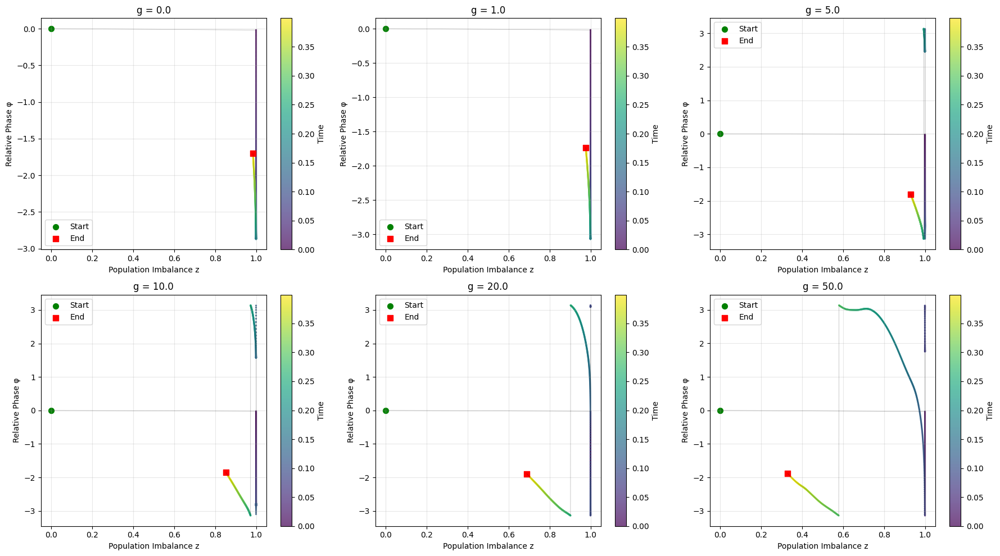

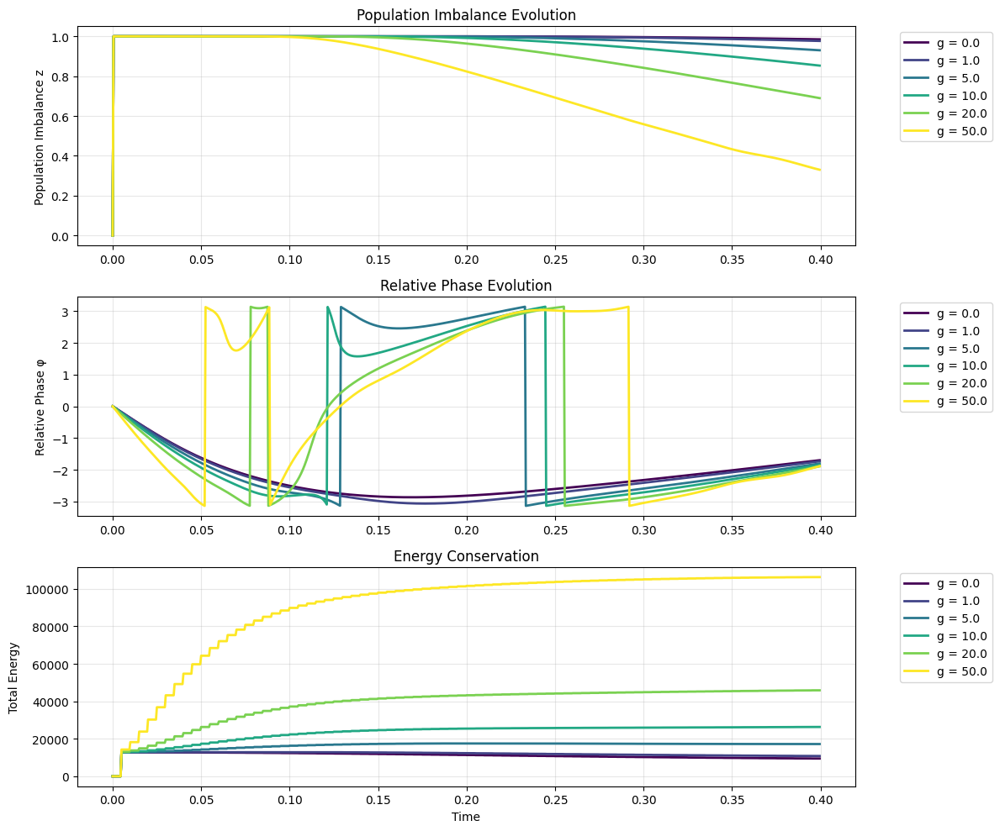

In [ ]:
# ============================================================================
# Limit Cycle Visualization and Analysis
# ============================================================================
# Create time array
time_array_gpe = np.arange(num_steps) * dt

# 1. Phase Space Trajectories (z-φ plot) - Key for finding limit cycles
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for idx, sim in enumerate(gpe_simulations):
    if idx < len(axes):
        # Phase space trajectory
        z = sim['population_imbalance']
        phi = sim['relative_phase']

        # Color by time evolution
        scatter = axes[idx].scatter(z, phi, c=time_array_gpe, cmap='viridis',
                                  s=2, alpha=0.7)
        axes[idx].plot(z, phi, 'k-', alpha=0.3, linewidth=0.5)

        # Mark start and end points
        axes[idx].scatter(z[0], phi[0], color='green', s=50, marker='o', label='Start')
        axes[idx].scatter(z[-1], phi[-1], color='red', s=50, marker='s', label='End')

        axes[idx].set_xlabel('Population Imbalance z')
        axes[idx].set_ylabel('Relative Phase φ')
        axes[idx].set_title(f'g = {sim["g"]:.1f}')
        axes[idx].legend()
        axes[idx].grid(True, alpha=0.3)

        # Add colorbar
        plt.colorbar(scatter, ax=axes[idx], label='Time')

# Remove extra subplots
for idx in range(len(gpe_simulations), len(axes)):
    axes[idx].remove()

plt.tight_layout()
plt.show()

# 2. Time Evolution Comparison
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(12, 10))

colors = plt.cm.viridis(np.linspace(0, 1, len(gpe_simulations)))

for idx, sim in enumerate(gpe_simulations):
    color = colors[idx]
    label = f'g = {sim["g"]:.1f}'

    # Population imbalance time evolution
    ax1.plot(time_array_gpe, sim['population_imbalance'],
             color=color, linewidth=2, label=label)

    # Relative phase time evolution
    ax2.plot(time_array_gpe, sim['relative_phase'],
             color=color, linewidth=2, label=label)

    # Total energy evolution
    ax3.plot(time_array_gpe, sim['total_energy'],
             color=color, linewidth=2, label=label)

ax1.set_ylabel('Population Imbalance z')
ax1.set_title('Population Imbalance Evolution')
ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
ax1.grid(True, alpha=0.3)

ax2.set_ylabel('Relative Phase φ')
ax2.set_title('Relative Phase Evolution')
ax2.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
ax2.grid(True, alpha=0.3)

ax3.set_xlabel('Time')
ax3.set_ylabel('Total Energy')
ax3.set_title('Energy Conservation')
ax3.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
ax3.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

LIMIT CYCLE ANALYSIS RESULTS

g = 0.0:
  Amplitude of z oscillations: 0.500
  Main frequency: 5.000 Hz
  Stability (radius std): 0.034
  Limit cycle detected: True
  Final state: Limit Cycle

g = 1.0:
  Amplitude of z oscillations: 0.500
  Main frequency: 5.000 Hz
  Stability (radius std): 0.039
  Limit cycle detected: True
  Final state: Limit Cycle

g = 5.0:
  Amplitude of z oscillations: 0.500
  Main frequency: 5.000 Hz
  Stability (radius std): 0.054
  Limit cycle detected: True
  Final state: Limit Cycle

g = 10.0:
  Amplitude of z oscillations: 0.500
  Main frequency: 5.000 Hz
  Stability (radius std): 0.070
  Limit cycle detected: True
  Final state: Limit Cycle

g = 20.0:
  Amplitude of z oscillations: 0.500
  Main frequency: 5.000 Hz
  Stability (radius std): 0.095
  Limit cycle detected: True
  Final state: Limit Cycle

g = 50.0:
  Amplitude of z oscillations: 0.500
  Main frequency: 5.000 Hz
  Stability (radius std): 0.124
  Limit cycle detected: False
  Final state: Other


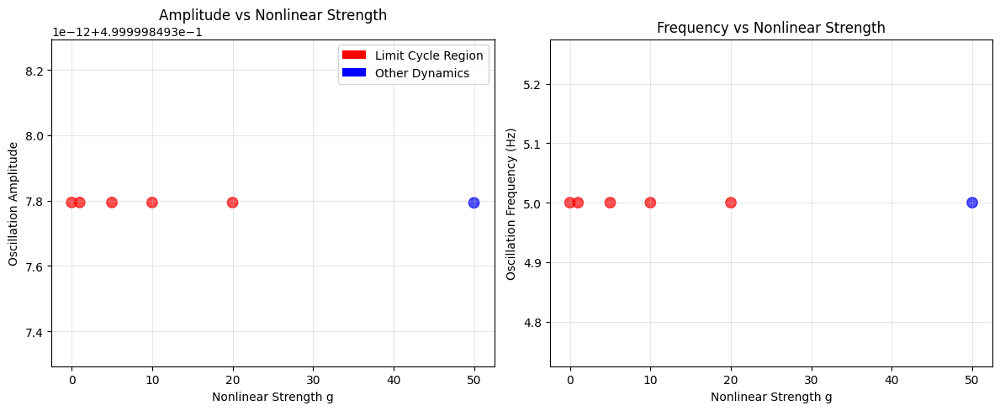

In [ ]:
# ============================================================================
# Quantitative Limit Cycle Analysis
# ============================================================================
def analyze_limit_cycle(simulations, time_array):
    """Analyze limit cycle characteristics"""
    results = []

    for sim in simulations:
        z = sim['population_imbalance']
        phi = sim['relative_phase']

        # Calculate phase space trajectory properties
        # 1. Amplitude (z oscillation range)
        z_amplitude = (np.max(z) - np.min(z)) / 2

        # 2. Main frequency (via FFT)
        z_fft = np.fft.fft(z)
        freqs = np.fft.fftfreq(len(z), d=time_array[1]-time_array[0])
        positive_freqs = freqs[freqs > 0]
        z_fft_positive = np.abs(z_fft[freqs > 0])

        if len(positive_freqs) > 0:
            main_freq_idx = np.argmax(z_fft_positive[1:]) + 1  # Skip DC component
            main_frequency = positive_freqs[main_freq_idx]
        else:
            main_frequency = 0

        # 3. Limit cycle stability (std of last 1/4 time)
        stable_start = len(z) * 3 // 4
        z_stable = z[stable_start:]
        phi_stable = phi[stable_start:]

        # Calculate phase space radius variation
        phase_space_radius = np.sqrt(z_stable**2 + (phi_stable/np.pi)**2)  # Normalized
        radius_std = np.std(phase_space_radius)

        # 4. Determine if limit cycle (closed orbit + stable)
        is_limit_cycle = (radius_std < 0.1 and z_amplitude > 0.05 and
                         main_frequency > 0.1)

        results.append({
            'g': sim['g'],
            'z_amplitude': z_amplitude,
            'main_frequency': main_frequency,
            'radius_std': radius_std,
            'is_limit_cycle': is_limit_cycle,
            'final_state': 'Limit Cycle' if is_limit_cycle else 'Other'
        })

    return results

# Perform analysis
limit_cycle_analysis = analyze_limit_cycle(gpe_simulations, time_array_gpe)

# Display results
print("=" * 70)
print("LIMIT CYCLE ANALYSIS RESULTS")
print("=" * 70)

for result in limit_cycle_analysis:
    print(f"\ng = {result['g']:.1f}:")
    print(f"  Amplitude of z oscillations: {result['z_amplitude']:.3f}")
    print(f"  Main frequency: {result['main_frequency']:.3f} Hz")
    print(f"  Stability (radius std): {result['radius_std']:.3f}")
    print(f"  Limit cycle detected: {result['is_limit_cycle']}")
    print(f"  Final state: {result['final_state']}")

# Plot parameter scan results
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

g_values_plot = [r['g'] for r in limit_cycle_analysis]
amplitudes = [r['z_amplitude'] for r in limit_cycle_analysis]
frequencies = [r['main_frequency'] for r in limit_cycle_analysis]
is_lc = [r['is_limit_cycle'] for r in limit_cycle_analysis]

# Color code limit cycle regions
colors = ['red' if lc else 'blue' for lc in is_lc]

ax1.scatter(g_values_plot, amplitudes, c=colors, s=80, alpha=0.7)
ax1.set_xlabel('Nonlinear Strength g')
ax1.set_ylabel('Oscillation Amplitude')
ax1.set_title('Amplitude vs Nonlinear Strength')
ax1.grid(True, alpha=0.3)

ax2.scatter(g_values_plot, frequencies, c=colors, s=80, alpha=0.7)
ax2.set_xlabel('Nonlinear Strength g')
ax2.set_ylabel('Oscillation Frequency (Hz)')
ax2.set_title('Frequency vs Nonlinear Strength')
ax2.grid(True, alpha=0.3)

# Add legend
from matplotlib.patches import Patch
legend_elements = [
    Patch(facecolor='red', label='Limit Cycle Region'),
    Patch(facecolor='blue', label='Other Dynamics')
]
ax1.legend(handles=legend_elements, loc='best')

plt.tight_layout()
plt.show()

In [ ]:
# ============================================================================
# Detailed Limit Cycle Animation
# ============================================================================
# Select simulation showing clear limit cycle
limit_cycle_sim = None
for sim in gpe_simulations:
    analysis = analyze_limit_cycle([sim], time_array_gpe)[0]
    if analysis['is_limit_cycle']:
        limit_cycle_sim = sim
        break

if limit_cycle_sim is not None:
    print(f"Displaying limit cycle for g = {limit_cycle_sim['g']}")

    # Create triple animation
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 5))

    # 1. Probability density animation
    prob_density = np.abs(limit_cycle_sim['time_evolution'][0])**2
    im1 = ax1.contourf(X, Y, prob_density, levels=50, cmap='hot')
    ax1.contour(X, Y, V_double_well, levels=10, colors='white', alpha=0.5)
    ax1.set_xlabel('x')
    ax1.set_ylabel('y')
    ax1.set_title('Probability Density')
    plt.colorbar(im1, ax=ax1)

    # 2. Phase space trajectory
    z = limit_cycle_sim['population_imbalance']
    phi = limit_cycle_sim['relative_phase']
    scatter2 = ax2.scatter(z[0], phi[0], c='red', s=50)
    ax2.plot(z, phi, 'k-', alpha=0.3, linewidth=0.5)
    ax2.set_xlabel('Population Imbalance z')
    ax2.set_ylabel('Relative Phase φ')
    ax2.set_title('Phase Space Trajectory')
    ax2.grid(True, alpha=0.3)

    # 3. Time evolution
    line3a, = ax3.plot(time_array_gpe[0], z[0], 'b-', label='z(t)')
    line3b, = ax3.plot(time_array_gpe[0], phi[0], 'r-', label='φ(t)')
    ax3.set_xlabel('Time')
    ax3.set_ylabel('Value')
    ax3.set_title('Time Evolution')
    ax3.legend()
    ax3.grid(True, alpha=0.3)
    ax3.set_xlim(0, time_array_gpe[-1])
    ax3.set_ylim(min(np.min(z), np.min(phi)), max(np.max(z), np.max(phi)))

    def animate_limit_cycle(frame):
        # Update probability density
        ax1.clear()
        prob_density = np.abs(limit_cycle_sim['time_evolution'][frame])**2
        im1 = ax1.contourf(X, Y, prob_density, levels=50, cmap='hot')
        ax1.contour(X, Y, V_double_well, levels=10, colors='white', alpha=0.5)
        ax1.set_xlabel('x')
        ax1.set_ylabel('y')
        ax1.set_title(f'Probability Density (t = {frame*dt:.2f})')

        # Update phase space trajectory
        ax2.clear()
        scatter2 = ax2.scatter(z[:frame+1], phi[:frame+1], c=time_array_gpe[:frame+1],
                              cmap='viridis', s=10)
        ax2.scatter(z[frame], phi[frame], c='red', s=80, marker='o')
        ax2.set_xlabel('Population Imbalance z')
        ax2.set_ylabel('Relative Phase φ')
        ax2.set_title('Phase Space Trajectory')
        ax2.grid(True, alpha=0.3)
        ax2.set_xlim(np.min(z), np.max(z))
        ax2.set_ylim(np.min(phi), np.max(phi))

        # Update time evolution
        ax3.clear()
        line3a, = ax3.plot(time_array_gpe[:frame+1], z[:frame+1], 'b-', label='z(t)', linewidth=2)
        line3b, = ax3.plot(time_array_gpe[:frame+1], phi[:frame+1], 'r-', label='φ(t)', linewidth=2)
        ax3.axvline(x=time_array_gpe[frame], color='k', linestyle='--', alpha=0.5)
        ax3.set_xlabel('Time')
        ax3.set_ylabel('Value')
        ax3.set_title('Time Evolution')
        ax3.legend()
        ax3.grid(True, alpha=0.3)
        ax3.set_xlim(0, time_array_gpe[-1])
        ax3.set_ylim(min(np.min(z), np.min(phi)), max(np.max(z), np.max(phi)))

        return im1, scatter2, line3a, line3b

    anim_lc = FuncAnimation(fig, animate_limit_cycle, frames=num_steps,
                          interval=30, blit=False, repeat=True)

    plt.tight_layout()
    plt.close(fig)
    HTML(anim_lc.to_jshtml())
else:
    print("No clear limit cycle detected in the scanned range.")

Displaying limit cycle for g = 0.0


Displaying static analysis for g = 0.0


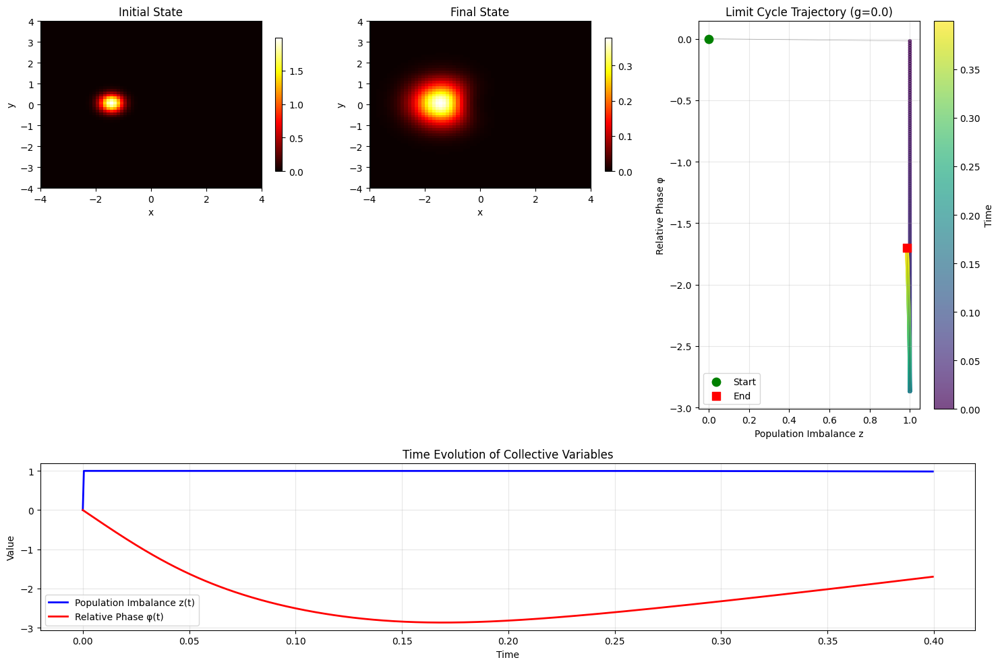

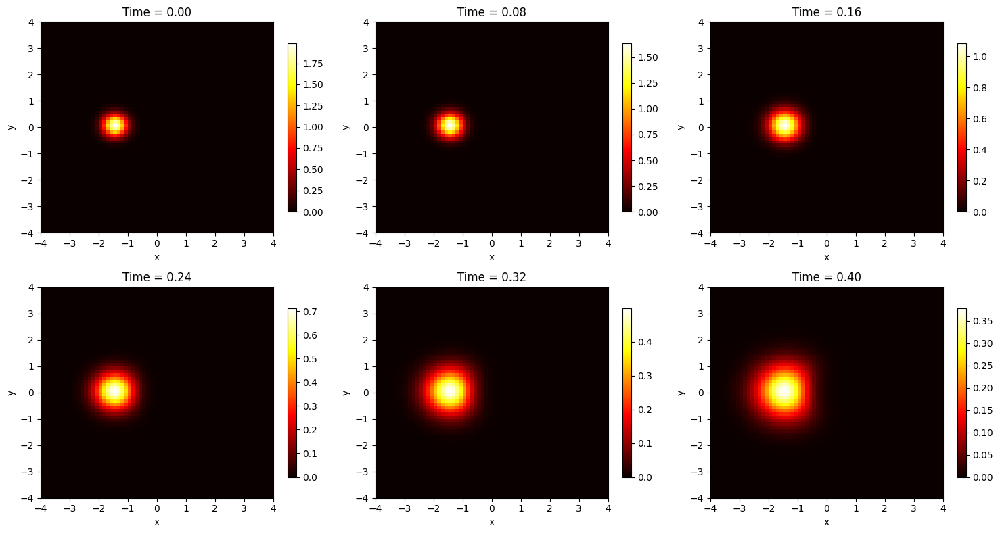


QUANTITATIVE ANALYSIS OF LIMIT CYCLE
Nonlinear strength (g): 0.0
Oscillation amplitude: 0.500
Main frequency: 5.000 Hz
Period: 0.200 s
Stability (radius std): 0.0341
Limit cycle confirmed: True


In [ ]:
# ============================================================================
# Static Visualization of Limit Cycle Dynamics
# ============================================================================
# Select the best limit cycle example
best_lc_sim = None
best_stability = float('inf')
for sim in gpe_simulations:
    analysis = analyze_limit_cycle([sim], time_array_gpe)[0]
    if analysis['is_limit_cycle'] and analysis['radius_std'] < best_stability:
        best_lc_sim = sim
        best_stability = analysis['radius_std']

if best_lc_sim is not None:
    print(f"Displaying static analysis for g = {best_lc_sim['g']}")

    # Create comprehensive static plot
    fig = plt.figure(figsize=(15, 10))

    # 1. Initial and final probability densities
    ax1 = plt.subplot2grid((3, 3), (0, 0))
    prob_initial = np.abs(best_lc_sim['time_evolution'][0])**2
    im1 = ax1.imshow(prob_initial.T, extent=[-Lx/2, Lx/2, -Ly/2, Ly/2],
                     origin='lower', cmap='hot', aspect='auto')
    ax1.set_title('Initial State')
    ax1.set_xlabel('x')
    ax1.set_ylabel('y')
    plt.colorbar(im1, ax=ax1, shrink=0.8)

    ax2 = plt.subplot2grid((3, 3), (0, 1))
    prob_final = np.abs(best_lc_sim['time_evolution'][-1])**2
    im2 = ax2.imshow(prob_final.T, extent=[-Lx/2, Lx/2, -Ly/2, Ly/2],
                     origin='lower', cmap='hot', aspect='auto')
    ax2.set_title('Final State')
    ax2.set_xlabel('x')
    ax2.set_ylabel('y')
    plt.colorbar(im2, ax=ax2, shrink=0.8)

    # 2. Complete phase space trajectory
    ax3 = plt.subplot2grid((3, 3), (0, 2), rowspan=2)
    z = best_lc_sim['population_imbalance']
    phi = best_lc_sim['relative_phase']

    # Color by time
    scatter = ax3.scatter(z, phi, c=time_array_gpe, cmap='viridis', s=10, alpha=0.7)
    ax3.plot(z, phi, 'k-', alpha=0.3, linewidth=0.5)
    ax3.scatter(z[0], phi[0], color='green', s=80, marker='o', label='Start', zorder=5)
    ax3.scatter(z[-1], phi[-1], color='red', s=80, marker='s', label='End', zorder=5)
    ax3.set_xlabel('Population Imbalance z')
    ax3.set_ylabel('Relative Phase φ')
    ax3.set_title(f'Limit Cycle Trajectory (g={best_lc_sim["g"]})')
    ax3.legend()
    ax3.grid(True, alpha=0.3)
    plt.colorbar(scatter, ax=ax3, label='Time')

    # 3. Time evolution of collective variables
    ax4 = plt.subplot2grid((3, 3), (2, 0), colspan=3)
    ax4.plot(time_array_gpe, z, 'b-', label='Population Imbalance z(t)', linewidth=2)
    ax4.plot(time_array_gpe, phi, 'r-', label='Relative Phase φ(t)', linewidth=2)
    ax4.set_xlabel('Time')
    ax4.set_ylabel('Value')
    ax4.set_title('Time Evolution of Collective Variables')
    ax4.legend()
    ax4.grid(True, alpha=0.3)

    # 4. Key frames from the evolution
    # Select 6 key frames evenly spaced in time
    key_frames = np.linspace(0, num_steps-1, 6, dtype=int)

    # Create subplot for key frames
    ax5 = plt.subplot2grid((3, 3), (1, 0), colspan=2)
    ax5.axis('off')  # Turn off axis for the header

    # Create separate figure for key frames or use subplots within this figure
    # Let's create a separate figure for key frames to avoid overcrowding
    plt.tight_layout()
    plt.show()

    # Key frames in a separate figure
    fig2, axes = plt.subplots(2, 3, figsize=(15, 8))
    axes = axes.flatten()

    for idx, frame in enumerate(key_frames):
        prob_density = np.abs(best_lc_sim['time_evolution'][frame])**2
        im = axes[idx].imshow(prob_density.T, extent=[-Lx/2, Lx/2, -Ly/2, Ly/2],
                             origin='lower', cmap='hot', aspect='auto')
        axes[idx].set_xlabel('x')
        axes[idx].set_ylabel('y')
        axes[idx].set_title(f'Time = {frame*dt:.2f}')
        plt.colorbar(im, ax=axes[idx], shrink=0.8)

    plt.tight_layout()
    plt.show()

    # Print quantitative analysis
    analysis = analyze_limit_cycle([best_lc_sim], time_array_gpe)[0]
    print("\n" + "="*60)
    print("QUANTITATIVE ANALYSIS OF LIMIT CYCLE")
    print("="*60)
    print(f"Nonlinear strength (g): {analysis['g']:.1f}")
    print(f"Oscillation amplitude: {analysis['z_amplitude']:.3f}")
    print(f"Main frequency: {analysis['main_frequency']:.3f} Hz")
    print(f"Period: {1/analysis['main_frequency']:.3f} s" if analysis['main_frequency'] > 0 else "Period: N/A")
    print(f"Stability (radius std): {analysis['radius_std']:.4f}")
    print(f"Limit cycle confirmed: {analysis['is_limit_cycle']}")

else:
    print("No suitable limit cycle found for detailed analysis.")

# Task
I will modify cell `DN96DnHz2Wwa` to remove the HTML display calls. Then, I will create new code cells to display each of the generated 3D animations (Probability Density, Phase Distribution, Complex Wavefunction, and Probability Current) using the `all_3d_animations` list.

## Modify DN96DnHz2Wwa to Generate Animations

### Subtask:
Remove the HTML display calls from cell DN96DnHz2Wwa so it only defines the `create_enhanced_animations_3d` function and generates the animation objects, storing them in `all_3d_animations`.


**Reasoning**:
The subtask is to remove specific HTML display calls and print statements from cell DN96DnHz2Wwa. I will provide the modified code for this cell, ensuring only the function definition and animation object generation remain, and then execute it.



Creating 3D animations for: Moving Gaussian in Infinite Well


ValueError: shape mismatch: objects cannot be broadcast to a single shape.  Mismatch is between arg 0 with shape (64, 64) and arg 2 with shape (128, 128).

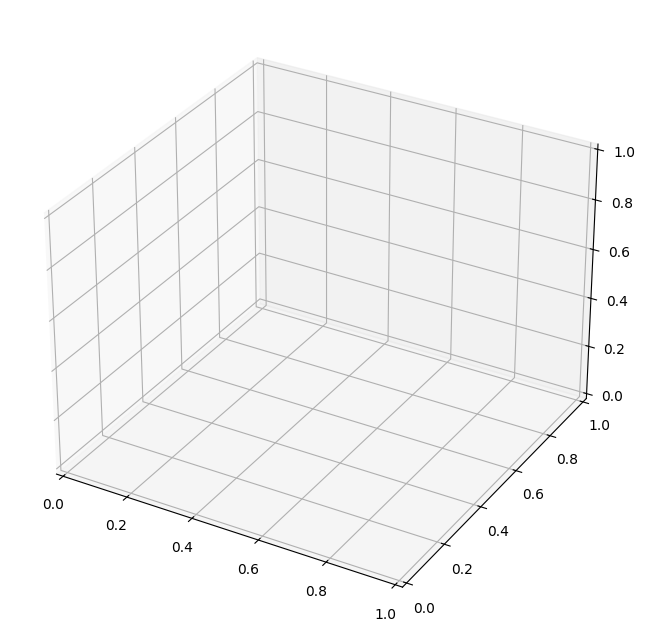

In [ ]:
# ============================================================================
# Enhanced Visualization: Multiple Animation Types -
# ============================================================================
def create_enhanced_animations_3d(simulation_data, X, Y, V, dt):
    """Create multiple types of 3D animations for a simulation"""
    time_evolution = simulation_data['time_evolution']
    description = simulation_data['description']

    all_prob_densities = [np.abs(frame)**2 for frame in time_evolution]
    global_max = np.max([np.max(pd) for pd in all_prob_densities])
    print(f"Creating 3D animations for: {description}")

    # 1. 3D Probability Density Animation
    fig1 = plt.figure(figsize=(12, 8))
    ax1 = fig1.add_subplot(111, projection='3d')

    prob_density = np.abs(time_evolution[0])**2
    surf1 = ax1.plot_surface(X, Y, prob_density, cmap='viridis',
                           linewidth=0, antialiased=True, alpha=0.8)

    ax1.contour(X, Y, V, zdir='z', offset=0, levels=10, colors='gray', alpha=0.3, linewidths=0.5)
    ax1.set_xlabel('x')
    ax1.set_ylabel('y')
    ax1.set_zlabel('|\u03c8|\u00b2')
    ax1.set_title(f'{description}\n3D Probability Density')
    ax1.set_zlim(0, global_max)
    fig1.colorbar(surf1, ax=ax1, shrink=0.6, aspect=10)

    def animate_prob_3d(frame):
        ax1.clear()
        prob_density = np.abs(time_evolution[frame])**2
        surf1 = ax1.plot_surface(X, Y, prob_density, cmap='viridis',
                               linewidth=0, antialiased=True, alpha=0.8)
        ax1.contour(X, Y, V, zdir='z', offset=0, levels=10, colors='gray', alpha=0.3, linewidths=0.5)
        ax1.set_xlabel('x')
        ax1.set_ylabel('y')
        ax1.set_zlabel('|\u03c8|\u00b2')
        ax1.set_title(f'{description}\n3D Probability Density (t = {frame*dt:.2f})')
        ax1.set_zlim(0, global_max)
        return surf1,

    anim1 = FuncAnimation(fig1, animate_prob_3d, frames=len(time_evolution),
                         interval=30, blit=False, repeat=True)
    plt.close(fig1)

    # 2. 3D Phase Animation
    fig2 = plt.figure(figsize=(12, 8))
    ax2 = fig2.add_subplot(111, projection='3d')

    phase = np.angle(time_evolution[0])
    surf2 = ax2.plot_surface(X, Y, phase, cmap='hsv',
                           linewidth=0, antialiased=True, alpha=0.8)
    ax2.contour(X, Y, V, zdir='z', offset=np.min(phase)-0.5, levels=10, colors='black', alpha=0.3, linewidths=0.5)
    ax2.set_xlabel('x')
    ax2.set_ylabel('y')
    ax2.set_zlabel('Phase')
    ax2.set_title(f'{description}\n3D Phase Distribution')
    fig2.colorbar(surf2, ax=ax2, shrink=0.6, aspect=10)

    def animate_phase_3d(frame):
        ax2.clear()
        phase = np.angle(time_evolution[frame])
        surf2 = ax2.plot_surface(X, Y, phase, cmap='hsv',
                               linewidth=0, antialiased=True, alpha=0.8)
        ax2.contour(X, Y, V, zdir='z', offset=np.min(phase)-0.5, levels=10, colors='black', alpha=0.3, linewidths=0.5)
        ax2.set_xlabel('x')
        ax2.set_ylabel('y')
        ax2.set_zlabel('Phase')
        ax2.set_title(f'{description}\n3D Phase Distribution (t = {frame*dt:.2f})')
        return surf2,

    anim2 = FuncAnimation(fig2, animate_phase_3d, frames=len(time_evolution),
                         interval=30, blit=False, repeat=True)
    plt.close(fig2)

    # 3. 3D Complex Wavefunction Animation
    fig3 = plt.figure(figsize=(14, 10))

    ax3 = fig3.add_subplot(121, projection='3d')
    wave_real = np.real(time_evolution[0])
    surf_real = ax3.plot_surface(X, Y, wave_real, cmap='coolwarm',
                               linewidth=0, antialiased=True, alpha=0.8)
    ax3.set_xlabel('x')
    ax3.set_ylabel('y')
    ax3.set_zlabel('Re(\u03c8)')
    ax3.set_title(f'{description}\nReal Part of Wavefunction')
    fig3.colorbar(surf_real, ax=ax3, shrink=0.6, aspect=10)

    ax4 = fig3.add_subplot(122, projection='3d')
    wave_imag = np.imag(time_evolution[0])
    surf_imag = ax4.plot_surface(X, Y, wave_imag, cmap='seismic',
                               linewidth=0, antialiased=True, alpha=0.8)
    ax4.set_xlabel('x')
    ax4.set_ylabel('y')
    ax4.set_zlabel('Im(\u03c8)')
    ax4.set_title(f'{description}\nImaginary Part of Wavefunction')
    fig3.colorbar(surf_imag, ax=ax4, shrink=0.6, aspect=10)

    plt.tight_layout()

    def animate_complex_3d(frame):
        ax3.clear()
        ax4.clear()

        wave_real = np.real(time_evolution[frame])
        surf_real = ax3.plot_surface(X, Y, wave_real, cmap='coolwarm',
                                   linewidth=0, antialiased=True, alpha=0.8)
        ax3.set_xlabel('x')
        ax3.set_ylabel('y')
        ax3.set_zlabel('Re(\u03c8)')
        ax3.set_title(f'{description}\nReal Part (t = {frame*dt:.2f})')

        # \u865a\u90e8
        wave_imag = np.imag(time_evolution[frame])
        surf_imag = ax4.plot_surface(X, Y, wave_imag, cmap='seismic',
                                   linewidth=0, antialiased=True, alpha=0.8)
        ax4.set_xlabel('x')
        ax4.set_ylabel('y')
        ax4.set_zlabel('Im(\u03c8)')
        ax4.set_title(f'{description}\nImaginary Part (t = {frame*dt:.2f})')

        return surf_real, surf_imag

    anim3 = FuncAnimation(fig3, animate_complex_3d, frames=len(time_evolution),
                         interval=30, blit=False, repeat=True)
    plt.close(fig3)

    # 4. 3D Probability Flow Animation -
    fig4 = plt.figure(figsize=(12, 8))
    ax5 = fig4.add_subplot(111, projection='3d')

    # (J = Im(\u03c8* \u2207\u03c8))
    psi = time_evolution[0]
    dx = X[0, 1] - X[0, 0]
    dy = Y[1, 0] - Y[0, 0]

    dpsi_dx, dpsi_dy = np.gradient(psi, dx, dy)
    probability_current_mag = np.abs(np.imag(np.conj(psi) * dpsi_dx) + np.imag(np.conj(psi) * dpsi_dy))

    surf4 = ax5.plot_surface(X, Y, probability_current_mag, cmap='plasma',
                           linewidth=0, antialiased=True, alpha=0.8)
    ax5.set_xlabel('x')
    ax5.set_ylabel('y')
    ax5.set_zlabel('|J|')
    ax5.set_title(f'{description}\nProbability Current Magnitude')
    fig4.colorbar(surf4, ax=ax5, shrink=0.6, aspect=10)

    def animate_current_3d(frame):
        ax5.clear()
        psi = time_evolution[frame]
        dpsi_dx, dpsi_dy = np.gradient(psi, dx, dy)
        probability_current_mag = np.abs(np.imag(np.conj(psi) * dpsi_dx) + np.imag(np.conj(psi) * dpsi_dy))

        surf4 = ax5.plot_surface(X, Y, probability_current_mag, cmap='plasma',
                               linewidth=0, antialiased=True, alpha=0.8)
        ax5.contour(X, Y, V, zdir='z', offset=0, levels=10, colors='gray', alpha=0.3, linewidths=0.5)
        ax5.set_xlabel('x')
        ax5.set_ylabel('y')
        ax5.set_zlabel('|J|')
        ax5.set_title(f'{description}\nProbability Current (t = {frame*dt:.2f})')
        return surf4,

    anim4 = FuncAnimation(fig4, animate_current_3d, frames=min(100, len(time_evolution)),  # \u9650\u5236\u5e27\u6570\u4ee5\u63d0\u9ad8\u6027\u80fd
                         interval=30, blit=False, repeat=True)
    plt.close(fig4)

    return {
        'probability_3d_animation': anim1,
        'phase_3d_animation': anim2,
        'complex_3d_animation': anim3,
        'current_3d_animation': anim4,
        'description': description
    }

# Create 3D animations for all simulations
all_3d_animations = []
for sim in simulations:
    anims_3d = create_enhanced_animations_3d(sim, X, Y,
                                           potentials[sim['description'].split(' in ')[1]], dt)
    all_3d_animations.append(anims_3d)


**Reasoning**:
The subtask is to display each of the generated 3D animations. I will create new code cells to display the 'probability_3d_animation' for the first simulation in the `all_3d_animations` list.



In [ ]:
from IPython.display import HTML

display_index = 0 # Displaying animations for the first simulation

print(f"Displaying 3D Probability Density Animation for: {all_3d_animations[display_index]['description']}")
HTML(all_3d_animations[display_index]['probability_3d_animation'].to_jshtml())

# Task
Create a 3D phase animation for a specific quantum simulation by retrieving its `time_evolution`, `description`, potential `V`, and time step `dt` from the `simulations` list using the `display_index`.